In [1]:
from sailnet import model
from sailnet import dictlearner
from sailnet import stimset
from sailnet import pca 
from sailnet import lca
from sailnet import utils
import numpy as np
import array
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib.widgets import Slider
from random import gauss
import os 
import pickle
import sklearn
import random
import math
import requests
import statistics
from PIL import Image
from math import sqrt
from functools import reduce
from os.path import expanduser
from collections import namedtuple
import scipy
from scipy import stats
from scipy import random as scirand
from scipy import linalg
from scipy.stats import linregress
from scipy.stats import pearsonr
from scipy.stats.stats import zscore
from sklearn.decomposition import PCA as skpca
import pandas as pd
from matplotlib.pyplot import imshow
import mat73

Unable to load GPU implementation. Only CPU inference available.


In [2]:
%matplotlib inline

In [3]:
%matplotlib inline
import matplotlib
matplotlib.rcParams['figure.figsize'] = (12, 8)

In [4]:
def get_similarity_over_time(rfhistory, stepwise=True, ref_idx=0):
    if stepwise == True:
        referencerfs = rfhistory[0]
    else:
        referencerfs = rfhistory[ref_idx]
        
    similarities = []
    similarity = lambda rfs, referencerfs : np.einsum('ij,ij->i', rfs, referencerfs)/np.linalg.norm(referencerfs, axis=1)/np.linalg.norm(rfs, axis=1)
    
    for rfs in rfhistory:
        similarities.append(similarity(rfs, referencerfs))
        if stepwise == True:    
            referencerf = rfs
        else:
            pass

    return(similarities)

In [5]:
def get_phases(rfs, dims=16):
    fourier_basis = np.array([np.fft.fftn(rf.reshape((dims,dims))) for rf in rfs])
    return(np.array([np.angle(a) for a in fourier_basis]))

In [6]:
def get_max_frequencies(rfs, dims=16):
    
    kfreq = np.fft.fftfreq(dims)*dims
    kfreq2D = np.meshgrid(kfreq, kfreq)
    knrm = np.sqrt(kfreq2D[0]**2+kfreq2D[1]**2)
    knrm = knrm.flatten()
    kbins = np.arange(0.5, dims//2+1, 1.)
    kvals = 0.5*(kbins[1:] + kbins[:-1])
    fourier_basis = np.array([np.fft.fftn(rf.reshape((dims,dims))) for rf in rfs])        
    fourier_amplitudes = np.abs(fourier_basis)**2
    fourier_amplitudes = [oneamp.reshape(dims**2) for oneamp in fourier_amplitudes]
    Abins = [stats.binned_statistic(knrm, amplitude, statistic="mean", bins=kbins)[0] for amplitude in fourier_amplitudes]
    Abins = [onebin*np.pi*(kbins[1:]**2 - kbins[:-1]**2) for onebin in Abins]
    return np.array([kvals[np.argmax(Abin)] for Abin in Abins])

In [7]:
def collect_params(matlab_params):
    try:
        A, b, x0, y0, sigmax, sigmay, theta, phi, lamb, phase = matlab_params[0][0][1][0][0]
        A = A[0][0]
        b = b[0][0]
        x0 = x0[0][0]
        y0 = y0[0][0]
        sigmax = sigmax[0][0]
        sigmay = sigmay[0][0]
        theta = theta[0][0]
        phi = phi[0][0]
        lamb = lamb[0][0]
        phase = phase[0][0]
    except KeyError:
        A, b, lamb, phase, phi, sigmax, sigmay, theta, x0, y0 = matlab_params['fit'].values()
#     f0 = 1/lamb
    return A, b, x0, y0, sigmax, sigmay, theta, phi, lamb, phase

In [8]:
def get_param(matlab_params, param_str='lambda'):
    if param_str == 'lambda':
        idx = 8 
   
    elif param_str == 'A':
        idx = 0
       
    elif param_str == 'x0':
        idx = 2
       
    elif param_str == 'y0':
        idx = 3
   
    elif param_str == 'sigmax':
        idx=4
          
    elif param_str == 'sigmay':
        idx=5
       
    elif param_str == 'theta':
        idx=6
       
    elif param_str == 'phi':
        idx = 7
        
    elif param_str == 'freq':
        lambd = get_param(matlab_params, param_str='lambda')
        return(1/lambd)
        
    elif param_str == 'sigmamax':
        sigmax = get_param(matlab_params, param_str='sigmax')
        sigmay = get_param(matlab_params, param_str='sigmay')
        return(np.maximum(sigmax,sigmay))
    
    elif param_str == 'sigmaarea':
        sigmax = get_param(matlab_params, param_str='sigmax')
        sigmay = get_param(matlab_params, param_str='sigmay')
        return(sigmax*sigmay)
    
    elif param_str == 'cyclewidth':
        sigmax = get_param(matlab_params, param_str='sigmax')
        f = 1/get_param(matlab_params, param_str='lambda')
        cyclewidth = sigmax*f
        return(cyclewidth)
    
    elif param_str == 'cyclelength':
        sigmay = get_param(matlab_params, param_str='sigmay')
        f = 1/get_param(matlab_params, param_str='lambda')
        cyclewidth = sigmay*f
        return(cyclelength)
    
    elif param_str == 'cyclearea':
        cyclewidth = get_param(matlab_params, param_str='cyclewidth')
        cyclelength = get_param(matlab_params, param_str='cyclelength')
        return(cyclewidth*cyclelength)

    elif param_str == 'orientationratio':
        sigmax = get_param(matlab_params, param_str='sigmax')
        sigmay = get_param(matlab_params, param_str='sigmay')
        theta = get_param(matlab_params, param_str='theta')
        return(get_orientation_ratio(sigmax,sigmay,theta))
    
    elif param_str == 'orientedcycles':
        sigmax = get_param(matlab_params, param_str='sigmax')
        sigmay = get_param(matlab_params, param_str='sigmay')
        theta = get_param(matlab_params, param_str='theta')
        f = 1/get_param(matlab_params, param_str='lambda')
        return(get_orientation(sigmax,sigmay,theta)*f)
    
#     elif param_str == 'orientationfreq':
#         orientation = get_param(matlab_params,param_str='orientation')
#         f = 1/get_param(matlab_params,param_str='lambda')
#         return(f*orientation)
    
    param = [collect_params(rf)[idx] for rf in matlab_params]
    return(np.array(param))

In [9]:
def split_by_property(rfs, prop='max_freq', nsplits=3):
    includedrfs = rfs[:(len(rfs) - (len(rfs)%nsplits))]
    if prop == 'max_freq':
        get_prop = lambda includedrfs : get_max_frequencies(includedrfs)
    else:
        get_prop = lambda includedrfs : get_param(includedrfs, param_str=prop)
    return(np.split(np.argsort(get_prop(includedrfs)),nsplits))y

In [10]:
def get_mean_timecourse(history, timebounds=(0, 100)):
    meantimecourse = np.array([rf.mean() for rf in history][timebounds[0]:timebounds[1]])       
    stderr = np.array([1.96*rf.std()/np.sqrt(np.shape(history)[1]) for rf in history][timebounds[0]:timebounds[1]])
#     stderr = np.array([rf.std() for rf in history][timebounds[0]:timebounds[1]])

    return(meantimecourse, stderr)

In [11]:
def get_mean_timecourses_by_group(rfhistory, groups, stepwise=True, ref_idx=0, timebounds=(0,100)):
    means = []
    stds = []
    for group in groups:
        grouphistory = [timepoint[group] for timepoint in rfhistory]
        similarities = get_similarity_over_time(grouphistory, stepwise=stepwise, ref_idx=ref_idx)
        
        mean, std = get_mean_timecourse(similarities, timebounds=timebounds)
        means.append(mean)
        stds.append(std)
    return means, stds

In [12]:
def plot_mean_timecourse(rfhistory, 
                         groups, 
                         labels, 
                         stepwise=True, 
                         x_axis='Training iterations ($t$)',
#                          y_axis = r"$\bf{" + similarity + "}$" + '$(BF_t, BF_T)$',
                         ref_idx=0,
                         timebounds=(0,100),
#                          xlim=(0,100),
#                          ylim=(0,1),
#                          xticks=[0,50,100],
#                          yticks=[0,1],
                    
                        
                        ):
    
    means, stds = get_mean_timecourses_by_group(rfhistory, groups, stepwise=stepwise, ref_idx=ref_idx, timebounds=timebounds)
    
    timecourseplot = plt.figure()
    ax = plt.axes()
    for t, err, l in zip(means, stds, labels):
        x = np.linspace(0, len(t), len(t))
#         plt.errorbar(x, t, yerr=err, label=l)
        plt.fill_between(x, t-err, t+err, label=l, alpha=0.5)
    
        x_pos = 53
        y_pos = 0.5
        
        plt.xlim([-2, 52])
        plt.xticks([0,50], fontsize=36)
        plt.ylim([0.5, 1.02])
        plt.yticks([0.5,1], fontsize=36)
        plt.xlabel(x_axis, fontsize=36, labelpad=16)
    


#         x_pos = 104
#         y_pos = 0
    
#         plt.xlim([-2, 102])
#         plt.xticks([0,50, 100], fontsize=36)
#         plt.ylim([0, 1.02])
#         plt.yticks([0.0,0.5,1.0], fontsize=36)
#         plt.xlabel(x_axis, fontsize=36, labelpad=16)
#         plt.ylabel(r"$\bf{" + 'similarity' + "}$" + '$(BF_t, BF_T)$' , fontsize=36, labelpad=16)
#         plt.legend(fontsize=25, loc='lower right')  #36 
    
    offset_text = r'$\times 10^{3}$'
    horizontalalignment='left'
    verticalalignment='bottom'
    ax.text(x_pos, y_pos, offset_text, fontsize=36)
    
#     plt.xticks(xticks, fontsize=36)
    

    


#     plt.xlim((0,100))
    
#     plt.xlabel(x_axis, fontsize=36, labelpad=16)
#     plt.ylim((0,1.0))
#     plt.yticks([0, 0.5, 1.0], fontsize=36)
#     plt.yticks([])
#     plt.ylabel(y_axis, fontsize=36, labelpad=16)
#     plt.legend(fontsize=36, loc='lower right')  

In [13]:
def display_rfs_over_time(rfhistory,interval=20,center=True,idx=None):
    if idx == None:
        idx = np.random.randint(0,np.shape(rfhistory[-1])[0])
    
    #get data
    
    im_t = lambda rf : utils.move_axis_to_batch_minor(rf,0)[:,idx].reshape((16,16))
    rf_over_time = [im_t(rf) for rf in rfhistory[::interval]]
   
    #center
    if center == True:
        datavmax = np.max(np.abs([rf_over_time[-1].min(),rf_over_time[-1].max()]))
        datavmin = -datavmax
        
    else:
        datavmax = None
        datavmin = None
        
    plt.figure()
    f, axarr = plt.subplots(1,len(rf_over_time))
    for ax, rf in zip(axarr, rf_over_time):
        ax.imshow(rf, interpolation='nearest',cmap='gray',vmin=datavmin,vmax=datavmax)
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
 

In [14]:
def get_well_fit_samples(matlab_params,r2s,n,r2lowestpercentile,centercutoff):
    errorfilter = filterbyr2(matlab_params, threshold=np.percentile(r2s, r2lowestpercentile))
    centerfilter, _ = filteroffcenter(matlab_params, xlims=centercutoff, ylims=centercutoff)
    goodidxs = np.intersect1d(errorfilter, centerfilter)
    if n>len(goodidxs):
        n=len(goodidxs)
    sampleidxs = np.random.choice(goodidxs,size=n,replace=False)
    sample_params = matlab_params[sampleidxs]
    print(len(goodidxs))
    print(len(sample_params))
    return(sampleidxs, sample_params)

In [15]:
def getr2(matlab_params):
    try:
        r2 = matlab_params['gof'][0][0][0]['rsquare'][0][0][0]
    except (KeyError, IndexError):
        r2 = matlab_params['r2']
    return r2

In [16]:
def filterbyr2(matlab_params, threshold=.9):
#     r2 = getr2(matlab_params)
    r2 = np.array([getr2(i) for i in matlab_params])
    goodbool = (r2 >= threshold)
    return np.where(goodbool)[0]

In [17]:
def filteroffcenter(matlab_params, xlims=(1,15), ylims=(1,15)):
    x0 = get_param(matlab_params, 'x0')
    y0 = get_param(matlab_params, 'y0')
    xbool = np.logical_and(x0>=xlims[0], x0<=xlims[1])
    ybool = np.logical_and(y0>=ylims[0], y0<=ylims[1])
    goodbool = np.logical_and(xbool, ybool)
    badbool = np.logical_not(goodbool)
    return np.where(goodbool)[0], np.where(badbool)[0]

Load previous analysis results

In [30]:
sparsenet_gabor_params = np.squeeze(scipy.io.loadmat('run-results/sparsenet/gaborfits/10x100kFISTA.mat')['results_lca'])

In [19]:
sparsenet_rfhistory = np.load('run-results/sparsenet/runs/sparsenetFISTA100kQhistory.npz')['arr_0']

In [31]:
sailnet_gabor_params = np.squeeze(mat73.loadmat('run-results/sailnet/gaborfits/sailnet10x100k.mat')['results_sailnet_10x100k'])

ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not suppor

ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not suppor

ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not suppor

ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not suppor

ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not suppor

ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not suppor

ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not suppor

ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not suppor

ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not suppor

ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not suppor

ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not suppor

ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not suppor

ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not suppor

ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not suppor

ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not supported: sfit, (uint32)
ERROR:root:ERROR: MATLAB type not suppor

In [20]:
sailnet_rfhistory = np.squeeze(mat73.loadmat('run-results/sailnet/runs/sailnet10x100krfhistory.mat')['Qhistory'])

In [817]:
dodds_sailnet_rfhistory = list(np.load('run-results/sailnet/runs/doddsrunrfhistory.npz')['arr_0'])

In [880]:
dodds10x100k_sailnet_rfhistory = list(np.load('run-results/sailnet/runs/dodds10x100k_sailnet_rfhistory.npz')['arr_0'])

In [899]:
sailnet256_rfhistory = np.squeeze(mat73.loadmat('run-results/sailnet/runs/Qhistory1x100k.mat')['Qhistory'])

In [896]:
sailnet_rfhistory2 = np.squeeze(mat73.loadmat('run-results/sailnet/runs/Qhistory10x100k2.mat')['Qhistory'])

In [16]:
plot_mean_timecourse(sailnet_rfhistory, 
                     [sailnet_freq_1, sailnet_freq_2, sailnet_freq_3], 
                     ['Low frequency', 'Mid frequency', 'High frequency'], 
                     stepwise=False, 
                     ref_idx=-1,
#                      xticks=([0,50]),
#                      ylim=(0.5,1),
                    )

# plt.savefig()                

NameError: name 'sailnet_rfhistory' is not defined

In [29]:
plot_mean_timecourse(sparsenet_rfhistory, 
                     [sparsenet_freq_1, sparsenet_freq_2, sparsenet_freq_3], 
                     ['Low frequency', 'Mid frequency', 'High frequency'], 
                     stepwise=False, 
                     ref_idx=-1)

NameError: name 'sparsenet_freq_1' is not defined

In [21]:
t1 = np.where(get_max_frequencies(sparsenet_rfhistory[-1]) == 1)[0]
t2 = np.where(get_max_frequencies(sparsenet_rfhistory[-1]) == 2)[0]
t3 = np.where(get_max_frequencies(sparsenet_rfhistory[-1]) == 3)[0]
t4 = np.where(get_max_frequencies(sparsenet_rfhistory[-1]) == 4)[0]
t5 = np.where(get_max_frequencies(sparsenet_rfhistory[-1]) == 5)[0]
t6 = np.where(get_max_frequencies(sparsenet_rfhistory[-1]) == 6)[0]
t7 = np.where(get_max_frequencies(sparsenet_rfhistory[-1]) == 7)[0]
t8 = np.where(get_max_frequencies(sparsenet_rfhistory[-1]) == 8)[0]


In [50]:
sparsenet_small = list(np.load('run-results/sparsenet/classifications/gaborfit_categories/sparsenetFISTA100ksmallarea.npz')['arr_0'])

In [52]:
sparsenet_edge = list(np.load('run-results/sparsenet/classifications/gaborfit_categories/sparsenetFISTA100kedges.npz')['arr_0'])

In [54]:
sparsenet_wavelet = list(np.load('run-results/sparsenet/classifications/gaborfit_categories/sparsenetFISTA100khighfreq.npz')['arr_0'])

In [55]:
sparsenet_gabor = list(np.load('run-results/sparsenet/classifications/gaborfit_categories/sparsenetFISTA100kgabors.npz')['arr_0'])

Text(0, 0.5, 'Density')

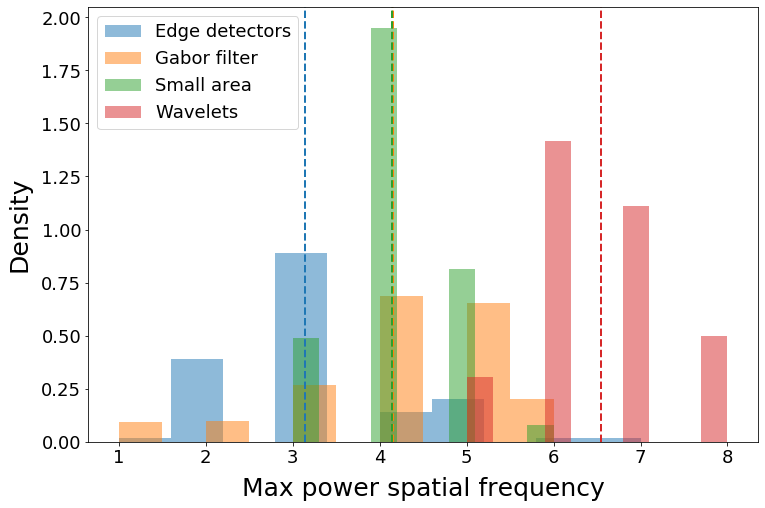

In [59]:
plt.hist(edges_freqs, alpha=0.5, label='Edge detectors', density=True)
plt.axvline(np.mean(edges_freqs), color='tab:blue', linestyle='dashed', linewidth=2)

plt.hist(gabor_freqs, alpha=0.5, label='Gabor filter', density=True)
plt.axvline(np.mean(gabor_freqs), color='tab:orange', linestyle='dashed', linewidth=2)

plt.hist(small_freqs, alpha=0.5, label='Small area', density=True)
plt.axvline(np.mean(small_freqs), color='tab:green', linestyle='dashed', linewidth=2)

plt.hist(wavelet_freqs, alpha=0.5, label='Wavelets', density=True)
plt.axvline(np.mean(wavelet_freqs), color='tab:red', linestyle='dashed', linewidth=2)

plt.legend(fontsize=18)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.xlabel('Max power spatial frequency', fontsize=25, labelpad=10)
plt.ylabel('Density', fontsize=25, labelpad=10)

In [58]:
small_freqs = get_max_frequencies(sparsenet_rfhistory[-1][sparsenet_small])
edges_freqs = get_max_frequencies(sparsenet_rfhistory[-1][sparsenet_edge])
wavelet_freqs = get_max_frequencies(sparsenet_rfhistory[-1][sparsenet_wavelet])
gabor_freqs = get_max_frequencies(sparsenet_rfhistory[-1][sparsenet_gabor])

(array([105., 217.,   0., 281.,   0.,  74.,   3.,   0.,   1.,   1.]),
 array([1. , 1.6, 2.2, 2.8, 3.4, 4. , 4.6, 5.2, 5.8, 6.4, 7. ]),
 <a list of 10 Patch objects>)

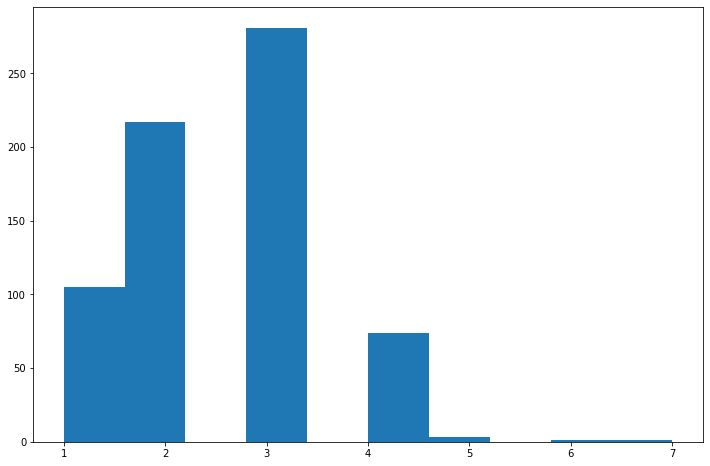

In [32]:
plt.hist(get_max_frequencies(sparsenet_rfhistory[-1][sparsenet_edge]))

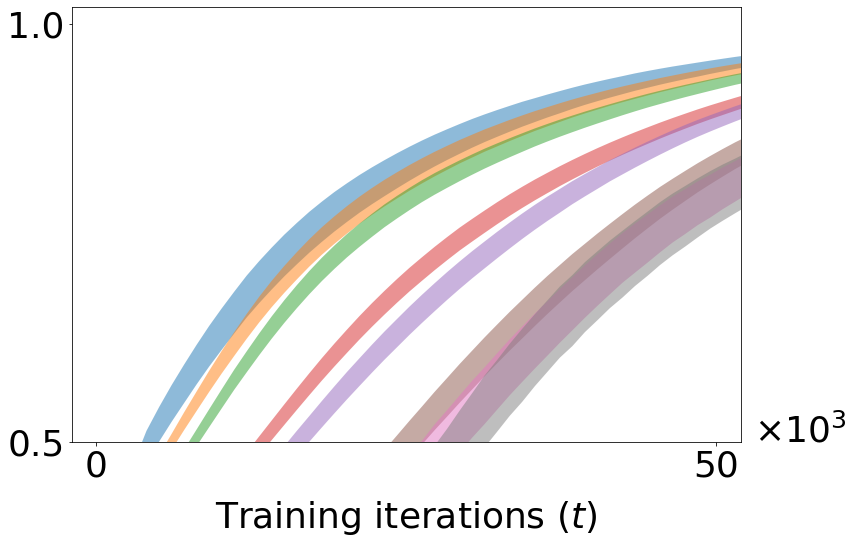

In [24]:
plot_mean_timecourse(sparsenet_rfhistory, 
                     [t1, t2, t3, t4, t5, t6, t7, t8], 
                     ['1 cycle', '2 cycles', '3 cycles', '4 cycles', '5 cycles', '6 cycles', '7 cycles', '8 cycles'], 
                     stepwise=False, 
                     ref_idx=-1)

In [19]:
t1 = np.where(get_max_frequencies(sailnet_rfhistory[-1]) == 1)[0]
t2 = np.where(get_max_frequencies(sailnet_rfhistory[-1]) == 2)[0]
t3 = np.where(get_max_frequencies(sailnet_rfhistory[-1]) == 3)[0]
t4 = np.where(get_max_frequencies(sailnet_rfhistory[-1]) == 4)[0]
t5 = np.where(get_max_frequencies(sailnet_rfhistory[-1]) == 5)[0]

In [21]:
len(t5)

3

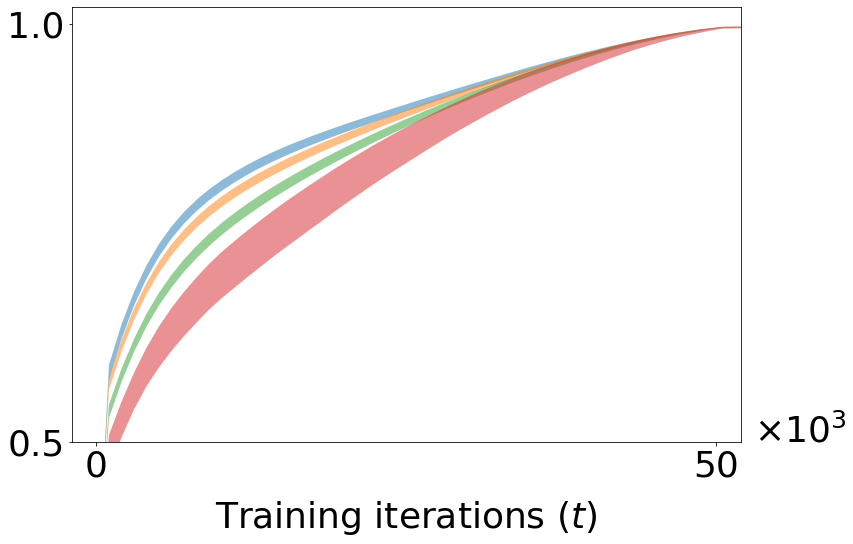

In [25]:
plot_mean_timecourse(sailnet_rfhistory, 
                     [t1, t2, t3, t4], 
                     ['1 cycle', '2 cycles', '3 cycles', '4 cycles'], 
                     stepwise=False, 
                     ref_idx=-1)

# Sparsenet

Classify RFs by peak frequency in power spectra

In [60]:
sparsenet_freq_1, sparsenet_freq_2, sparsenet_freq_3 = split_by_property(sparsenet_rfhistory[-1])

In [764]:
np.savez('run-results/sparsenet/classifications/sparsenetFISTA100klow_freq', sparsenet_freq_1)
np.savez('run-results/sparsenet/classifications/sparsenetFISTA100kmid_freq', sparsenet_freq_2)
np.savez('run-results/sparsenet/classifications/sparsenetFISTA100khigh_freq', sparsenet_freq_3)

In [ ]:
np.savez('run-results/sailnet/classifications/sailnetFISTA100klow_freq', sailnet_freq_1)
np.savez('run-results/sailnet/classifications/sailnetFISTA100kmid_freq', sailnet_freq_2)
np.savez('run-results/sailnet/classifications/sailnetFISTA100khigh_freq', sailnet_freq_3)

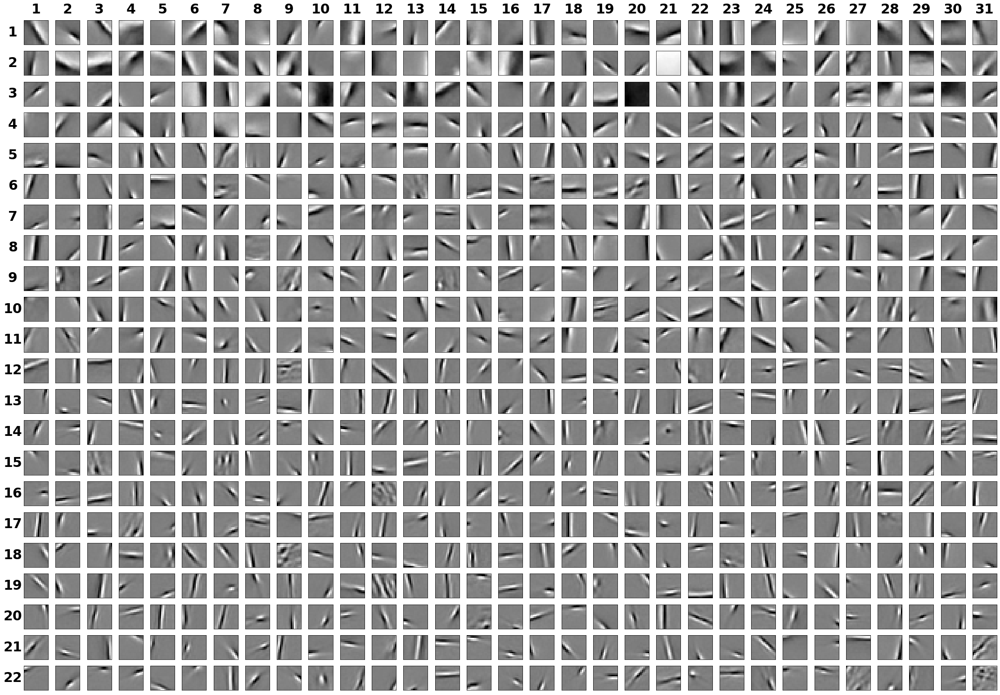

In [395]:
f = utils.display_patches(len(sparsenet_freq_1),sparsenet_rfhistory[-1][sparsenet_freq_1],display=True,center=True)
f = utils.display_patches(len(sparsenet_freq_2),sparsenet_rfhistory[-1][sparsenet_freq_2],display=True,center=True)
f = utils.display_patches(len(sparsenet_freq_3),sparsenet_rfhistory[-1][sparsenet_freq_3],display=True,center=True)

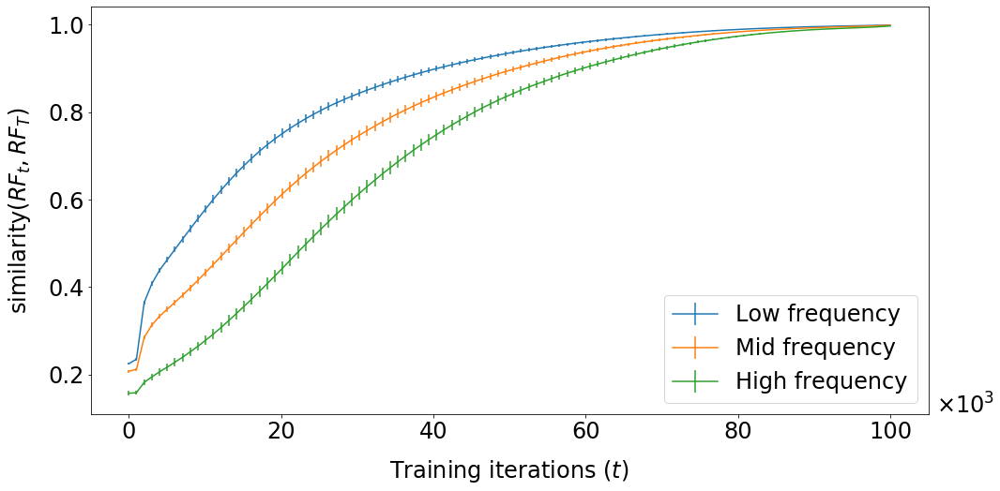

In [1570]:
plot_mean_timecourse(sparsenet_rfhistory, 
                     [sparsenet_freq_1, sparsenet_freq_2, sparsenet_freq_3], 
                     ['Low frequency', 'Mid frequency', 'High frequency'], 
                     stepwise=False, 
                     ref_idx=-1)

<Figure size 1440x720 with 0 Axes>

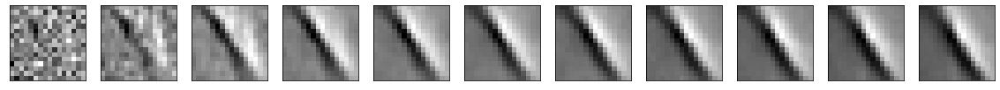

<Figure size 1440x720 with 0 Axes>

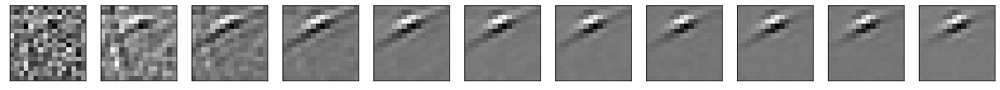

<Figure size 1440x720 with 0 Axes>

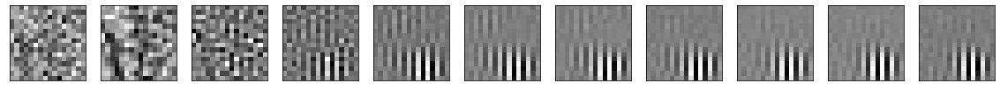

In [239]:
f = display_rfs_over_time(sparsenet_rfhistory, interval=10, idx=sparsenet_freq_1[0], center=False)
f = display_rfs_over_time(sparsenet_rfhistory, interval=10, idx=sparsenet_freq_2[200], center=False)
f = display_rfs_over_time(sparsenet_rfhistory, interval=10, idx=sparsenet_freq_3[-1], center=False)

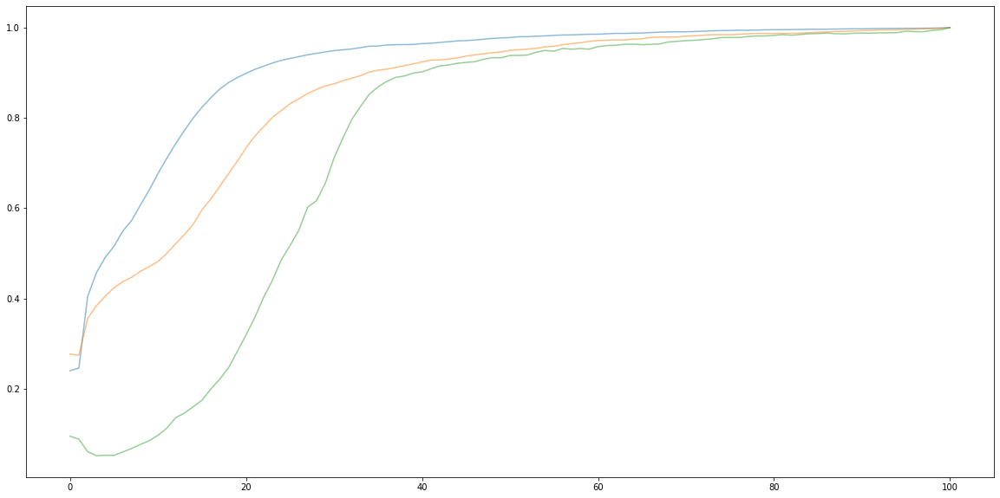

In [236]:
plt.plot([rf[sparsenet_freq_1][0] for rf in get_similarity_over_time(sparsenet_rfhistory,stepwise=False,ref_idx=-1)], color='tab:blue',alpha=0.5)
plt.plot([rf[sparsenet_freq_2][200] for rf in get_similarity_over_time(sparsenet_rfhistory,stepwise=False,ref_idx=-1)], color='tab:orange',alpha=0.5)
plt.plot([rf[sparsenet_freq_3][-1] for rf in get_similarity_over_time(sparsenet_rfhistory,stepwise=False,ref_idx=-1)], color='tab:green',alpha=0.5)

In [32]:
sparsenet_size_1, sparsenet_size_2, sparsenet_size_3 = split_by_property(sparsenet_gabor_params,prop='sigmaarea')

In [767]:
np.savez('run-results/sparsenet/classifications/sparsenetFISTA100ksmall', sparsenet_size_1)
np.savez('run-results/sparsenet/classifications/sparsenetFISTA100kmed', sparsenet_size_2)
np.savez('run-results/sparsenet/classifications/sparsenetFISTA100klarge', sparsenet_size_3)

In [441]:
sparsenet_fitfreq_1, sparsenet_fitfreq_2, sparsenet_fitfreq_3 = split_by_property(sparsenet_gabor_params,prop='freq')

In [768]:
np.savez('run-results/sparsenet/classifications/sparsenetFISTA100klowfgabor', sparsenet_fitfreq_1)
np.savez('run-results/sparsenet/classifications/sparsenetFISTA100kmidfgabor', sparsenet_fitfreq_2)
np.savez('run-results/sparsenet/classifications/sparsenetFISTA100khighfgabor', sparsenet_fitfreq_3)

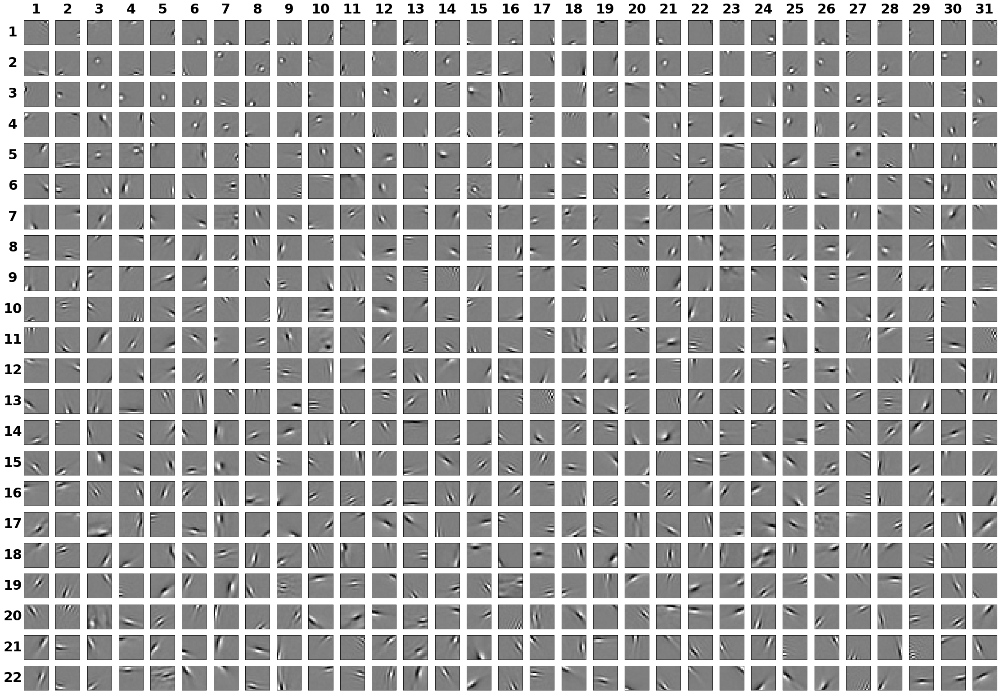

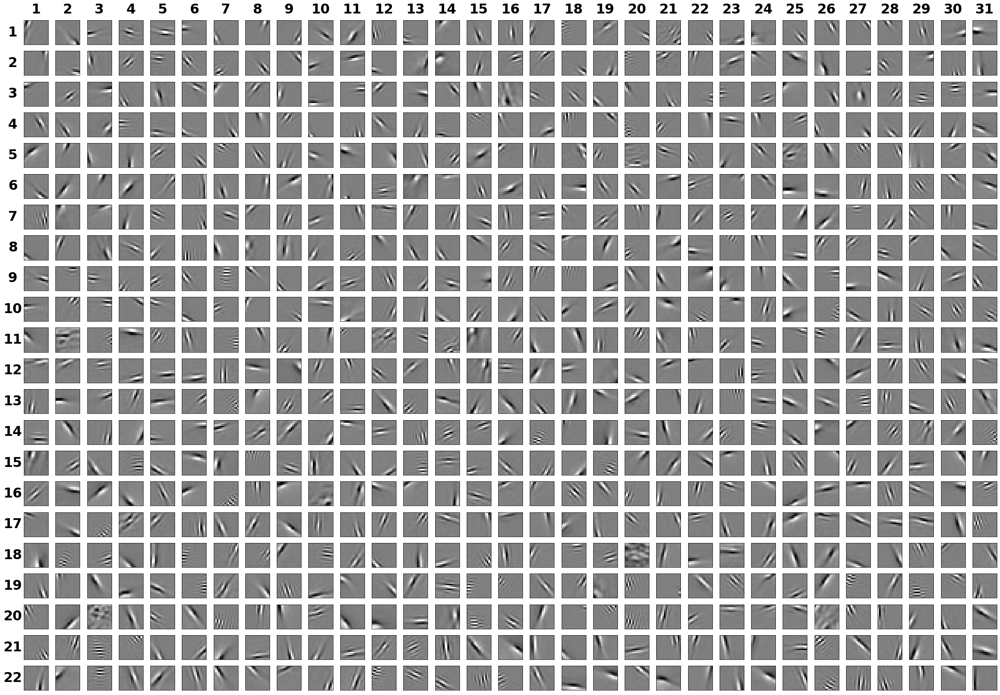

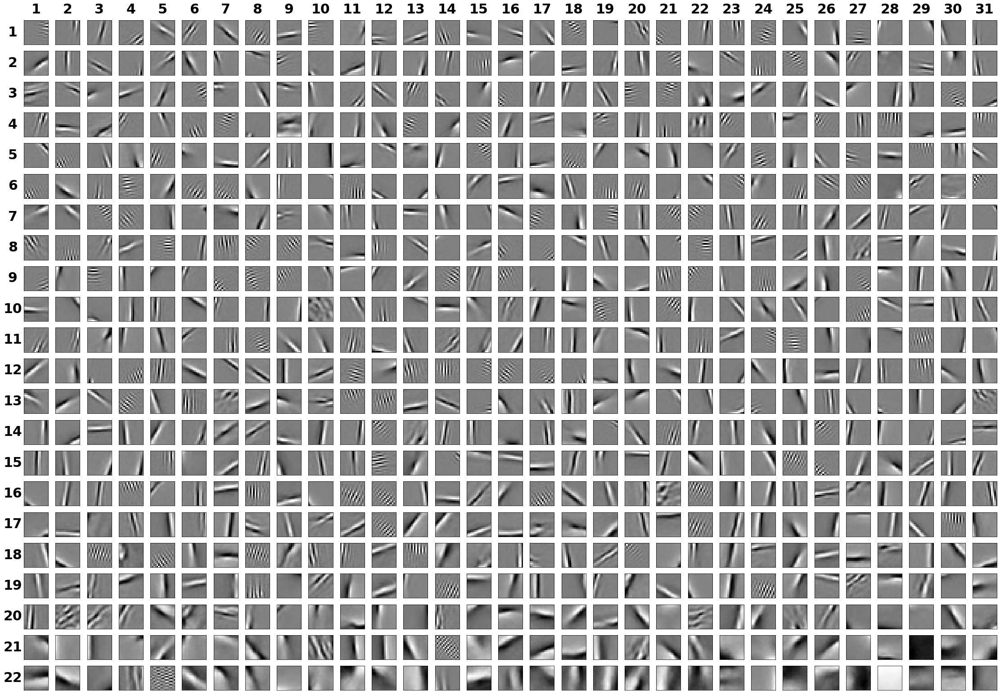

In [404]:
f = utils.display_patches(len(sparsenet_size_1),sparsenet_rfhistory[-1][sparsenet_size_1],display=True,center=True)
f = utils.display_patches(len(sparsenet_size_2),sparsenet_rfhistory[-1][sparsenet_size_2],display=True,center=True)
f = utils.display_patches(len(sparsenet_size_3),sparsenet_rfhistory[-1][sparsenet_size_3],display=True,center=True)

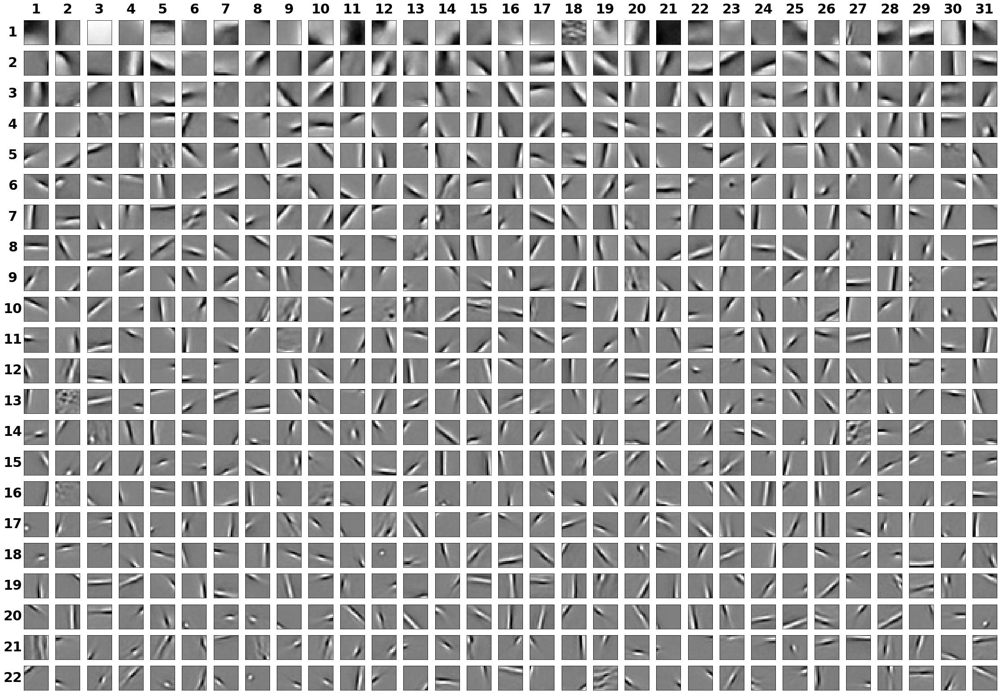

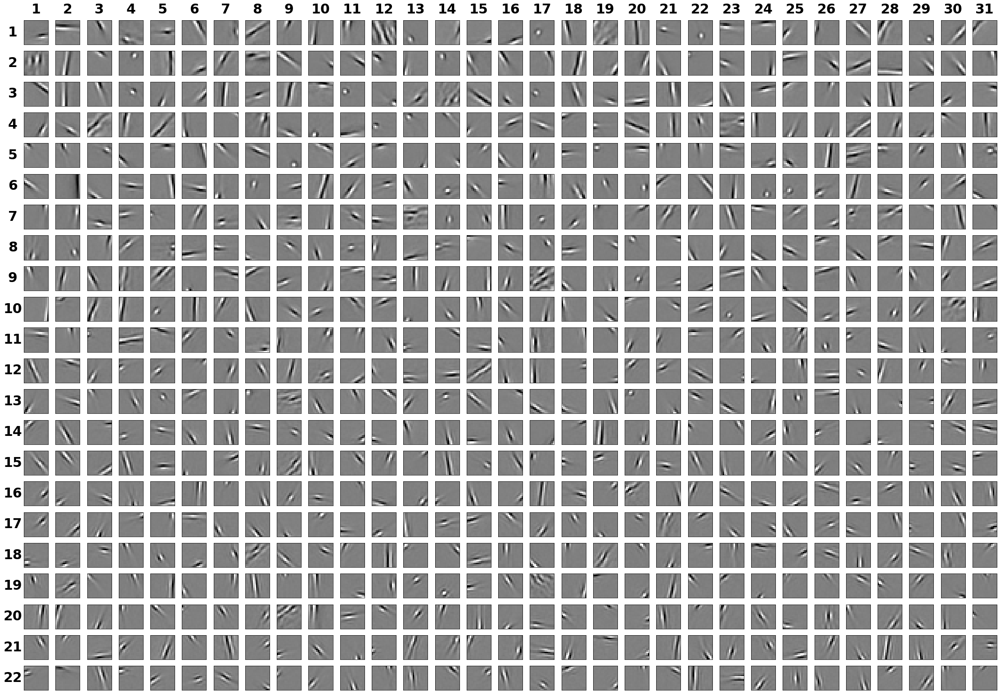

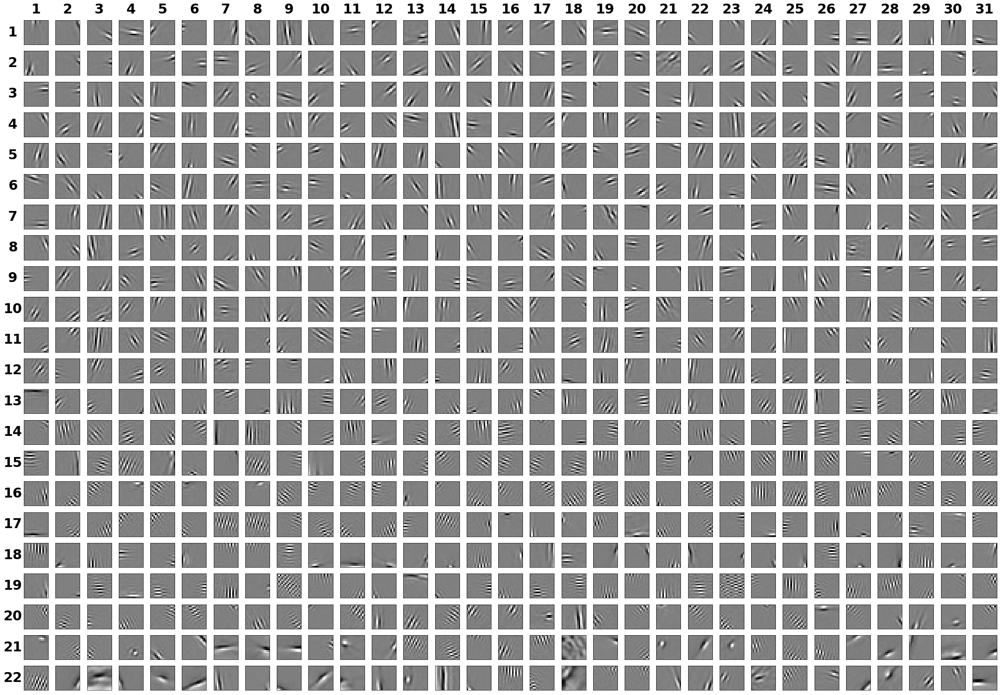

In [442]:
f = utils.display_patches(len(sparsenet_fitfreq_1),sparsenet_rfhistory[-1][sparsenet_fitfreq_1],display=True,center=True)
f = utils.display_patches(len(sparsenet_fitfreq_2),sparsenet_rfhistory[-1][sparsenet_fitfreq_2],display=True,center=True)
f = utils.display_patches(len(sparsenet_fitfreq_3),sparsenet_rfhistory[-1][sparsenet_fitfreq_3],display=True,center=True)

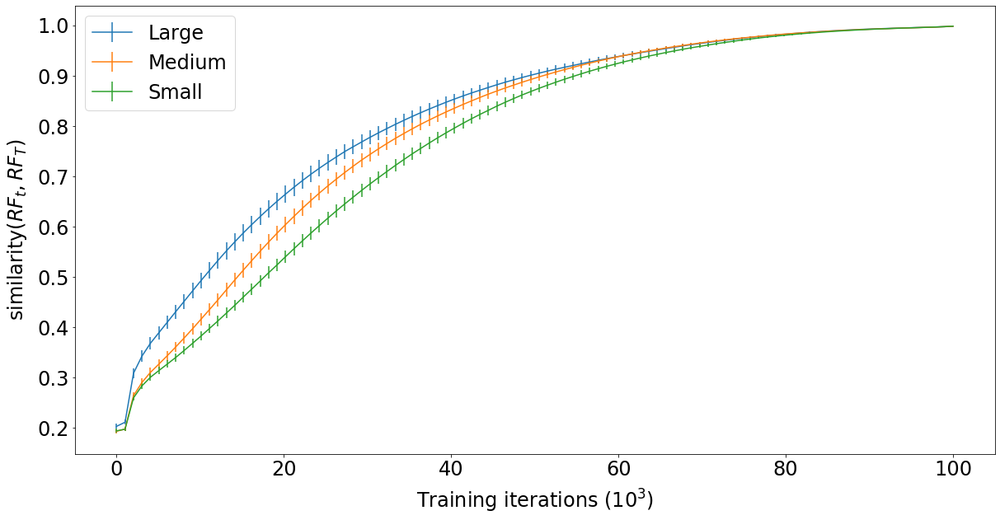

In [406]:
plot_mean_timecourse(sparsenet_rfhistory, 
                     [sparsenet_size_3, sparsenet_size_2, sparsenet_size_1], 
                     ['Large', 'Medium', 'Small'], 
                     stepwise=False, 
                     ref_idx=-1)

<Figure size 1440x720 with 0 Axes>

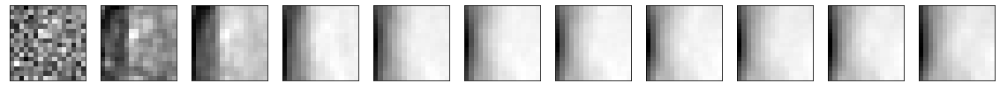

<Figure size 1440x720 with 0 Axes>

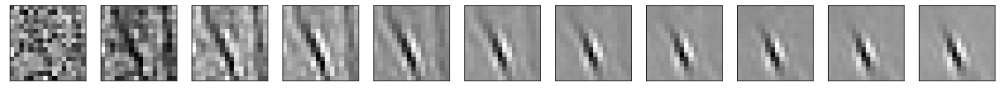

<Figure size 1440x720 with 0 Axes>

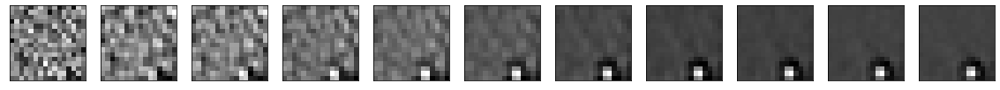

In [475]:
f = display_rfs_over_time(sparsenet_rfhistory, interval=10, idx=sparsenet_size_3[-1], center=False)
f = display_rfs_over_time(sparsenet_rfhistory, interval=10, idx=sparsenet_size_2[14], center=False)
f = display_rfs_over_time(sparsenet_rfhistory, interval=10, idx=sparsenet_size_1[5], center=False)


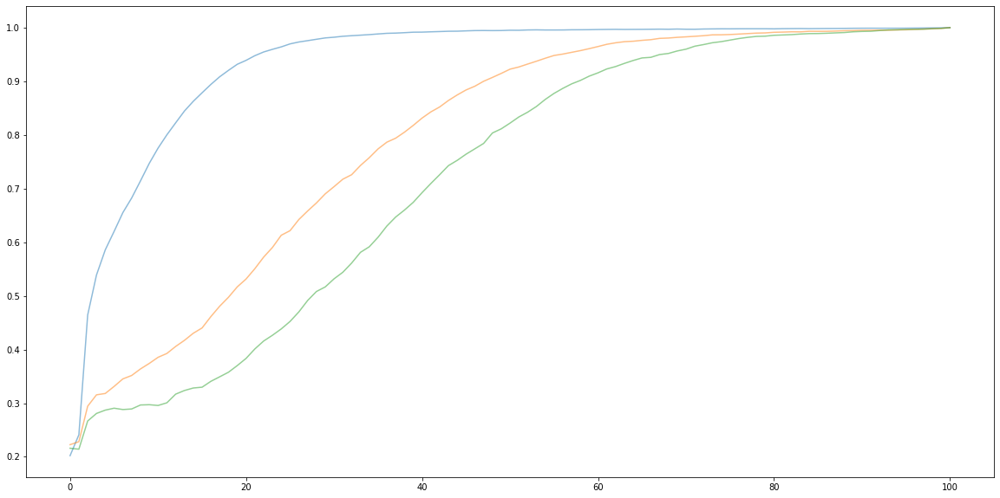

In [476]:
plt.plot([rf[sparsenet_size_3][-1] for rf in get_similarity_over_time(sparsenet_rfhistory,stepwise=False,ref_idx=-1)], color='tab:blue',alpha=0.5)
plt.plot([rf[sparsenet_size_2][14] for rf in get_similarity_over_time(sparsenet_rfhistory,stepwise=False,ref_idx=-1)], color='tab:orange',alpha=0.5)
plt.plot([rf[sparsenet_size_1][5] for rf in get_similarity_over_time(sparsenet_rfhistory,stepwise=False,ref_idx=-1)], color='tab:green',alpha=0.5)

In [1479]:
plot_mean_timecourse(sparsenet_rfhistory, 
                     [sparsenet_fitfreq_1, sparsenet_fitfreq_2, sparsenet_fitfreq_3], 
                     ['Low frequency (by Gabor fit)', 'Mid frequency (by Gabor fit)', 'High frequency (by Gabor fit)'], 
                     stepwise=False, 
                     ref_idx=-1)

TypeError: cannot unpack non-iterable Figure object

<Figure size 1440x720 with 0 Axes>

### Bin by size/frequency

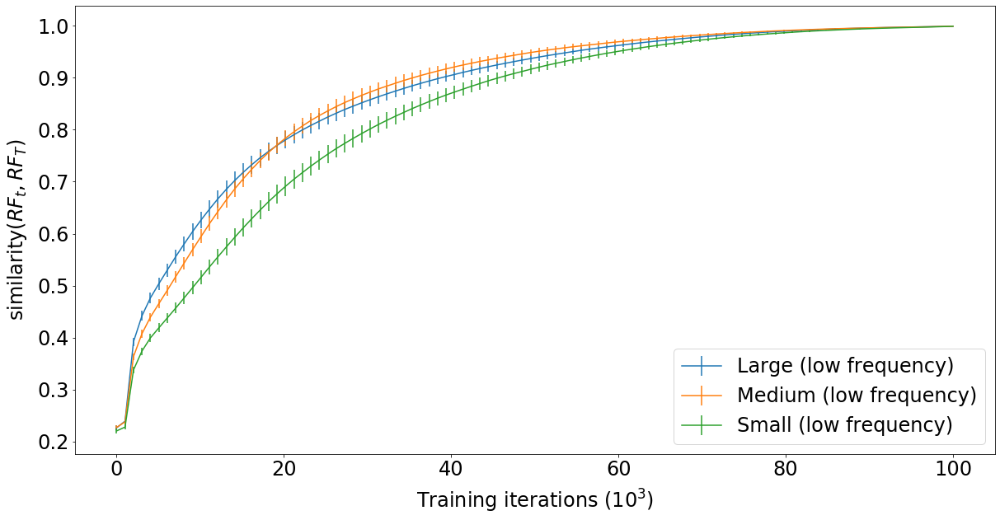

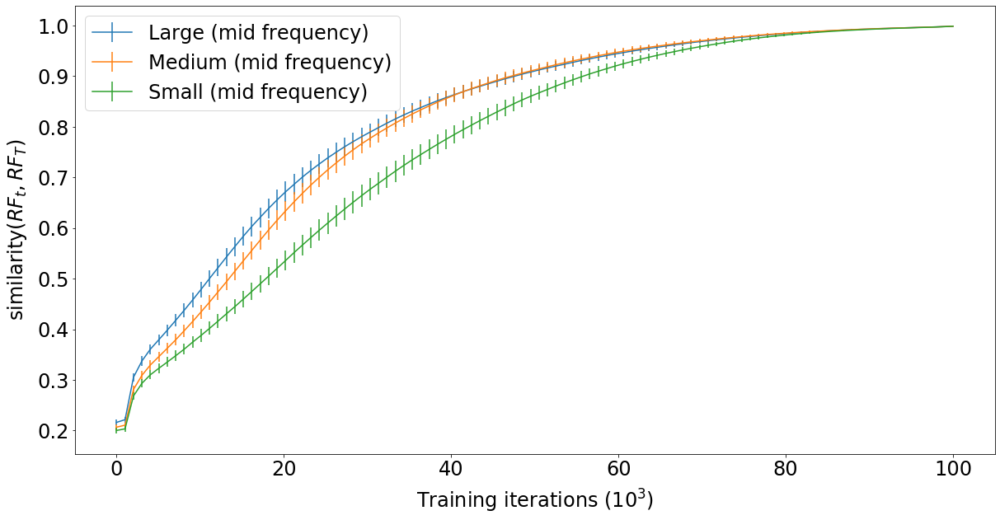

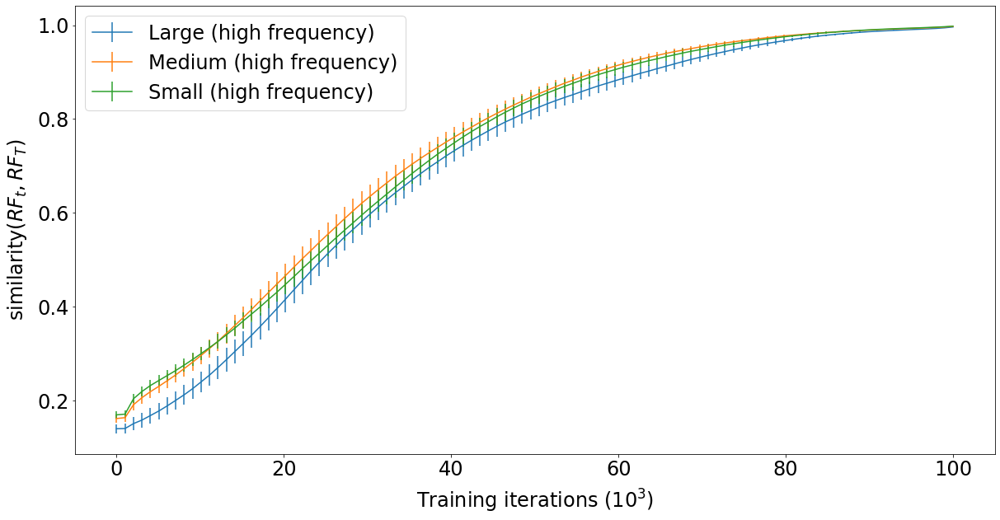

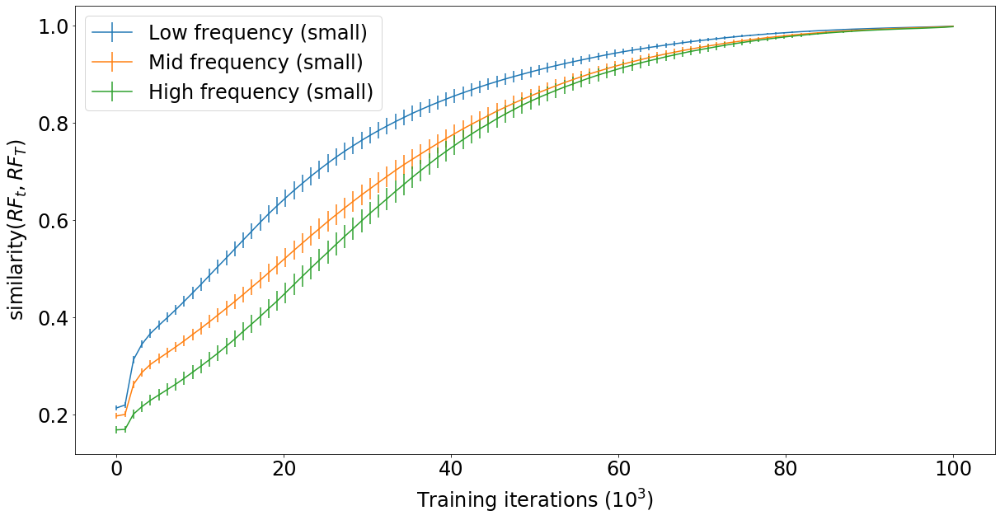

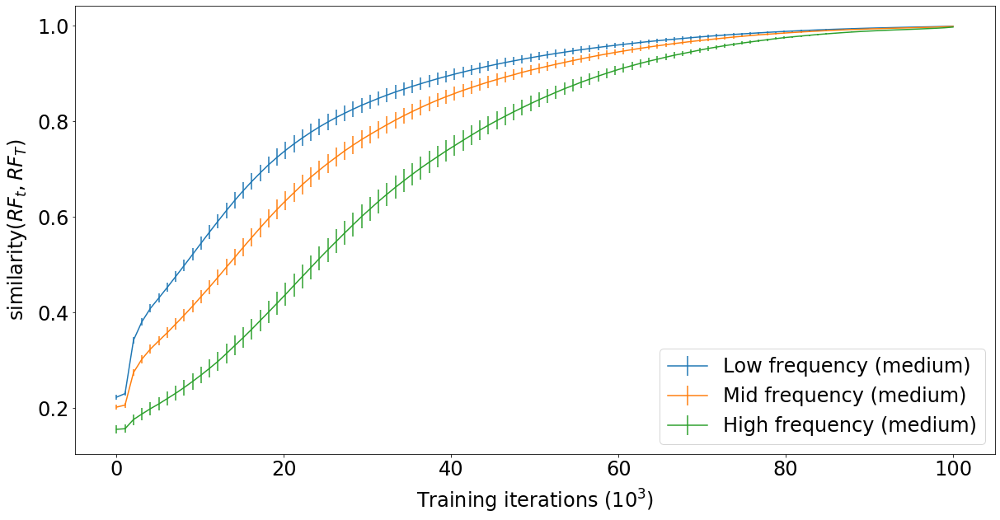

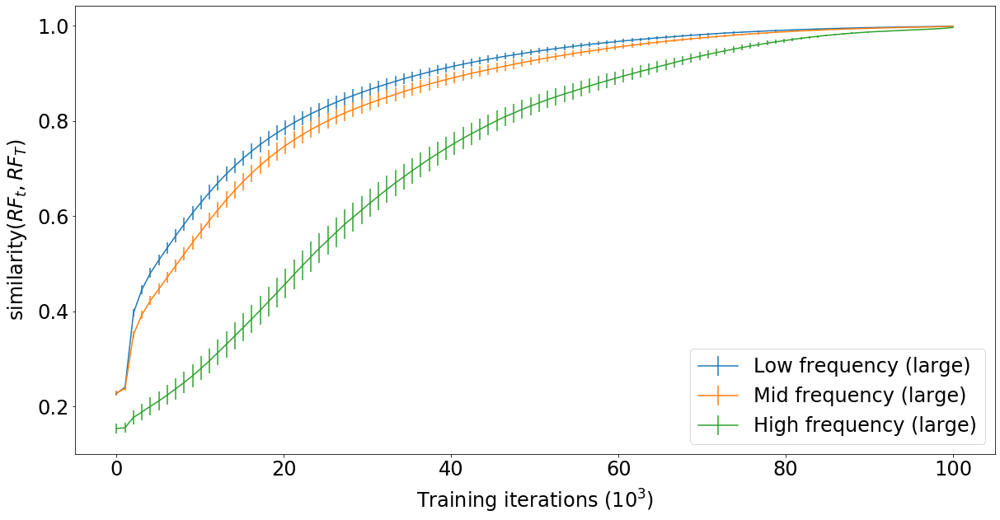

In [762]:
test1, test2, test3 = split_by_property(sparsenet_gabor_params[sparsenet_freq_1], prop='sigmaarea')
plot_mean_timecourse(sparsenet_rfhistory, 
                     [sparsenet_freq_1[test3], sparsenet_freq_1[test2], sparsenet_freq_1[test1]], 
                     ['Large (low frequency)', 'Medium (low frequency)', 'Small (low frequency)'], 
                     stepwise=False, 
                     ref_idx=-1)

test1, test2, test3 = split_by_property(sparsenet_gabor_params[sparsenet_freq_2], prop='sigmaarea')
plot_mean_timecourse(sparsenet_rfhistory, 
                     [sparsenet_freq_2[test3], sparsenet_freq_2[test2], sparsenet_freq_2[test1]], 
                     ['Large (mid frequency)', 'Medium (mid frequency)', 'Small (mid frequency)'], 
                     stepwise=False, 
                     ref_idx=-1)

test1, test2, test3 = split_by_property(sparsenet_gabor_params[sparsenet_freq_3], prop='sigmaarea')
plot_mean_timecourse(sparsenet_rfhistory, 
                     [sparsenet_freq_3[test3], sparsenet_freq_3[test2], sparsenet_freq_3[test1]], 
                     ['Large (high frequency)', 'Medium (high frequency)', 'Small (high frequency)'], 
                     stepwise=False, 
                     ref_idx=-1)

test1, test2, test3 = split_by_property(sparsenet_rfhistory[-1][sparsenet_size_1])
plot_mean_timecourse(sparsenet_rfhistory, 
                     [sparsenet_size_1[test1], sparsenet_size_1[test2], sparsenet_size_1[test3]], 
                     ['Low frequency (small)', 'Mid frequency (small)', 'High frequency (small)'], 
                     stepwise=False, 
                     ref_idx=-1)

test1, test2, test3 = split_by_property(sparsenet_rfhistory[-1][sparsenet_size_2])
plot_mean_timecourse(sparsenet_rfhistory, 
                     [sparsenet_size_2[test1], sparsenet_size_2[test2], sparsenet_size_2[test3]], 
                     ['Low frequency (medium)', 'Mid frequency (medium)', 'High frequency (medium)'], 
                     stepwise=False, 
                     ref_idx=-1)

test1, test2, test3 = split_by_property(sparsenet_rfhistory[-1][sparsenet_size_3])
plot_mean_timecourse(sparsenet_rfhistory, 
                     [sparsenet_size_3[test1], sparsenet_size_3[test2], sparsenet_size_3[test3]], 
                     ['Low frequency (large)', 'Mid frequency (large)', 'High frequency (large)'], 
                     stepwise=False, 
                     ref_idx=-1)

## ANOVA testing for size/frequency

In [725]:
def ANOVA_test(Y, Xvars):
    X = np.column_stack([var for var in Xvars])
    X = stats.zscore(X, axis=0)
    Y = stats.zscore(Y)
    
    linmodel = sklearn.linear_model.LinearRegression().fit(X,Y)
    
    totvar = np.sum([np.var(linmodel.coef_[i]*X[:,i]) for i in range(len(linmodel.coef_))])
    
    ev = np.array([np.var(linmodel.coef_[i]*X[:,])/totvar for i in range(len(linmodel.coef_))])
    
    return dict(r2=linmodel.score(X,Y), coeffs=linmodel.coef_, ev=ev)

In [804]:
sparsenet_similarity_curves = get_similarity_over_time(sparsenet_rfhistory, stepwise=False, ref_idx=-1)
sparsenet_curves_area = np.trapz(np.array(sparsenet_similarity_curves), axis=0)

In [805]:
features = [get_max_frequencies(sparsenet_rfhistory[-1]), get_param(sparsenet_gabor_params, param_str='sigmaarea')]

In [806]:
ANOVA_test(sparsenet_curves_area, features)

{'r2': 0.4104265343190622,
 'coeffs': array([-0.64258198, -0.00560617]),
 'ev': array([9.99923890e-01, 7.61100486e-05])}

Classify by mode

# SAILnet

In [20]:
sailnet_freq_1, sailnet_freq_2, sailnet_freq_3 = split_by_property(sailnet_rfhistory[-1])

In [897]:
sailnet2_freq_1, sailnet2_freq_2, sailnet2_freq_3 = split_by_max_frequencies(sailnet_rfhistory2[-1])

In [932]:
a = np.mgrid[:3, :3, :3][0]
np.angle(np.fft.fftn(a, axes=(1, 2))).shape
np.fft.fftn(a, axes=(1, 2)).shape

(3, 3, 3)

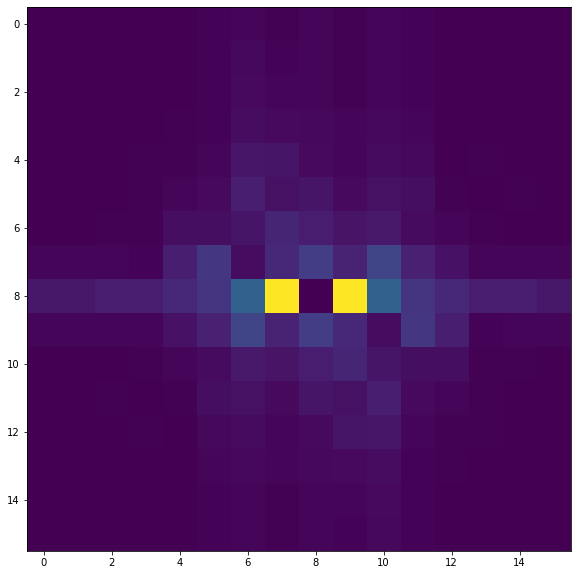

In [972]:
plt.imshow(np.abs(np.fft.fftshift(np.fft.fftn(sailnet_rfhistory[-1][5].reshape(16,16)))))

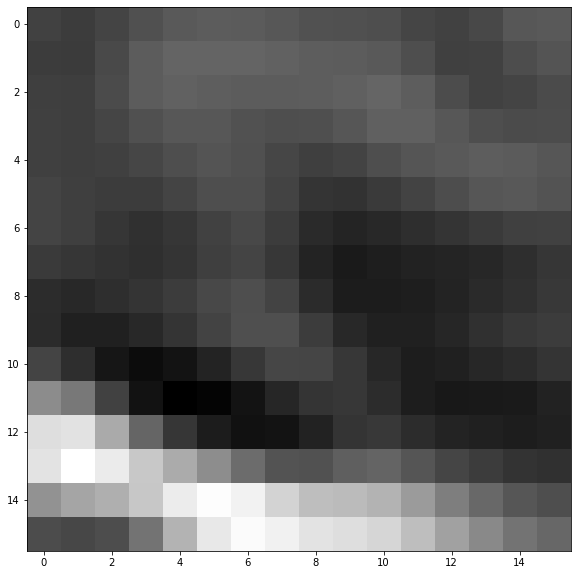

Idx: 0 Mean: 1.8177732731312554e-05 Stdev: 0.11915440331063366 Min: -0.18685785631217952 Max: 0.4033526163891387


In [985]:
utils.display_image(utils.move_axis_to_batch_minor(sailnet_rfhistory[-1],0),reshape_dims=(16,16),idx=0)

In [1118]:
np.angle(np.fft.fftn(sparsenet_rfhistory[-1][t8][-10]))-np.angle(np.fft.fftn(phase_shift(sparsenet_rfhistory[-1][t8][-10],np.pi))).ravel()

array([ 3.1415927 ,  1.2023396 , -1.2436652 , -6.1227245 , -2.0819502 ,
       -4.2840223 , -3.5130913 ,  1.202787  ,  0.26308116,  2.7276804 ,
        1.6345981 ,  2.336319  , -0.11074924,  1.182661  , -0.7442441 ,
        1.0377264 ,  4.7891517 , -3.2407339 , -0.7250335 ,  3.6194847 ,
        0.44490647,  4.620772  , -5.172559  ,  1.4469857 , -2.4495983 ,
       -0.1263417 ,  4.946437  ,  3.8527694 , -4.052307  , -0.15024996,
       -4.753788  , -1.4414282 ,  0.78066397, -5.995636  , -3.1300385 ,
       -1.2220103 , -1.7092216 , -2.3612862 ,  0.50337374,  4.751164  ,
       -0.04159331, -2.2823744 , -1.3737084 ,  2.5924897 ,  3.985821  ,
        2.4196684 , -0.99951494, -2.4872823 , -1.1722137 ,  2.2936854 ,
        0.25008202, -3.7713284 , -1.6775838 , -1.3692256 ,  0.9137598 ,
        2.9158509 ,  2.4605455 ,  3.2223525 , -0.8695867 , -2.580237  ,
       -0.55859864, -3.8164072 , -0.5933751 ,  2.2230558 ,  1.6449101 ,
       -0.50341976,  0.7145258 ,  0.9226482 , -3.510613  , -3.27

In [1114]:
np.angle(phase_shift(sparsenet_rfhistory[-1][t8][-10],np.pi))

array([[-3.14159274e+00,  3.14159274e+00, -2.70277559e-17,
         3.29006152e-16, -3.14159274e+00,  1.13917858e-16,
        -3.14159274e+00,  3.14159274e+00, -5.20812005e-17,
         3.14159274e+00, -3.14159274e+00,  1.53744474e-16,
        -3.67149707e-17,  3.14159274e+00, -2.18155784e-17,
         2.36143025e-17],
       [-3.14159274e+00,  3.14159274e+00, -2.32204967e-17,
         3.14159274e+00, -1.96587860e-17,  4.51004554e-18,
        -2.41028287e-17,  1.62264431e-17, -3.14159274e+00,
         4.37457114e-18, -6.83344657e-18,  3.14159274e+00,
        -3.14159274e+00,  3.14159274e+00, -1.13049004e-17,
         3.14159274e+00],
       [-3.14159274e+00,  2.70485794e-17, -3.14159274e+00,
         1.44048678e-15, -2.91997172e-17,  3.14159274e+00,
        -3.14159274e+00,  1.89777120e-17, -2.72827013e-17,
         3.14159274e+00, -3.14159274e+00,  5.94728037e-16,
        -1.37741363e-17,  1.93719691e-16, -3.14159274e+00,
         3.14159274e+00],
       [-3.14159274e+00,  7.48782254e

In [1096]:
np.linalg.norm(sparsenet_rfhistory[-1][t1][0].reshape(16,16) - phase_shift(sparsenet_rfhistory[-1][t1][0],np.pi/6))

0.13397466

In [ ]:
grads = [np.gradient(self.Q[i,:].reshape(self.stimshape)) for i in range(self.nunits)]

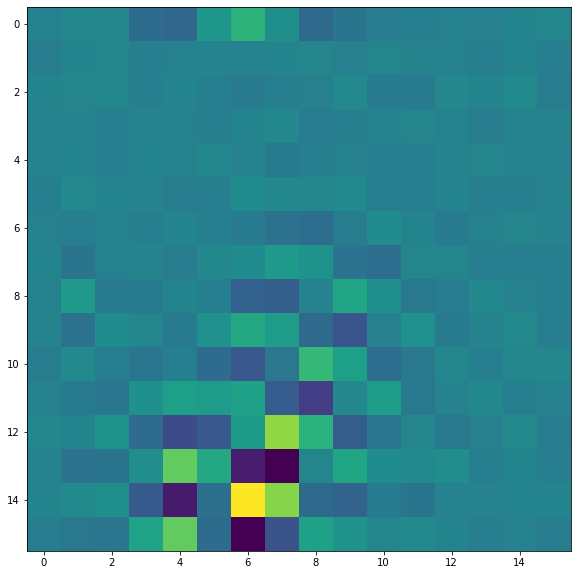

In [1237]:
plt.imshow(phase_shift(sparsenet_rfhistory[-1][t8][-10],1,1).real)

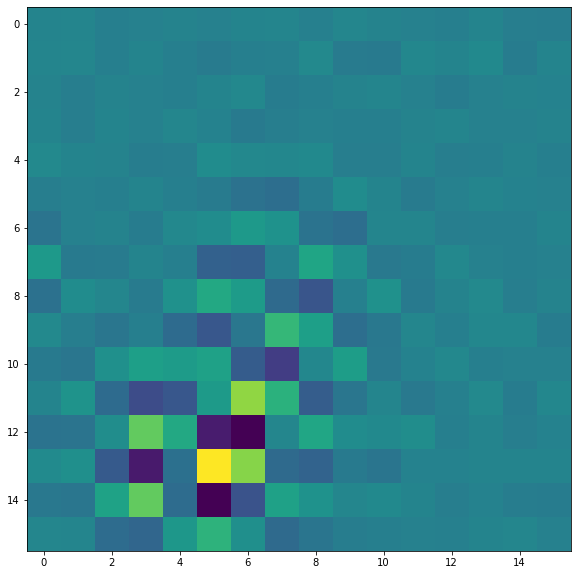

In [1238]:
plt.imshow(sparsenet_rfhistory[-1][t8][-10].reshape(16,16))

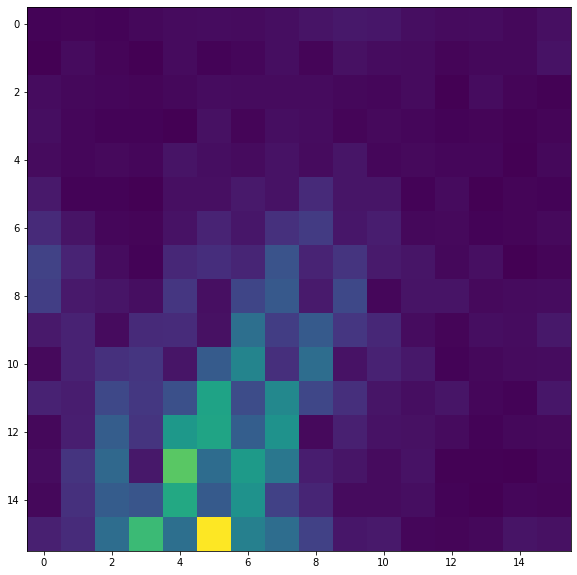

In [1267]:
plt.imshow(np.sqrt(g1**2 + g2**2))

In [1253]:
xi, yi = np.meshgrid(range(16), range(16))

In [1268]:
g1 = np.gradient(sailnet_rfhistory[-1][t4][-10].reshape(16,16))[0]
g2 = np.gradient(sailnet_rfhistory[-1][t4][-10].reshape(16,16))[1]

In [1265]:
np.matrix.argmax(np.sqrt(g1**2 + g2**2))

AttributeError: 'numpy.int64' object has no attribute '_align'

In [1269]:
np.unravel_index(np.sqrt(g1**2 + g2**2).argmax(), (g1**2 + g2**2).shape)

(11, 4)

In [1272]:
np.gradient(sailnet_rfhistory[-1][t4][-10].reshape(16,16))[0][11,4]

-0.24568899328130117

In [1273]:
np.gradient(sailnet_rfhistory[-1][t4][-10].reshape(16,16))[1][11,4]

0.012739196472985829

In [1255]:
np.shape((g1**2 + g2**2))

(16, 16)

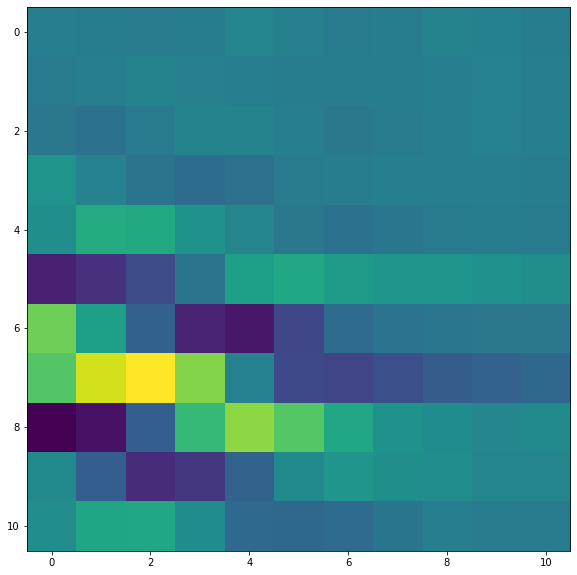

In [1383]:
plt.imshow(phase_shift(sparsenet_rfhistory[-1][t5][11], magnitude=.5).real[2:13,2:13])

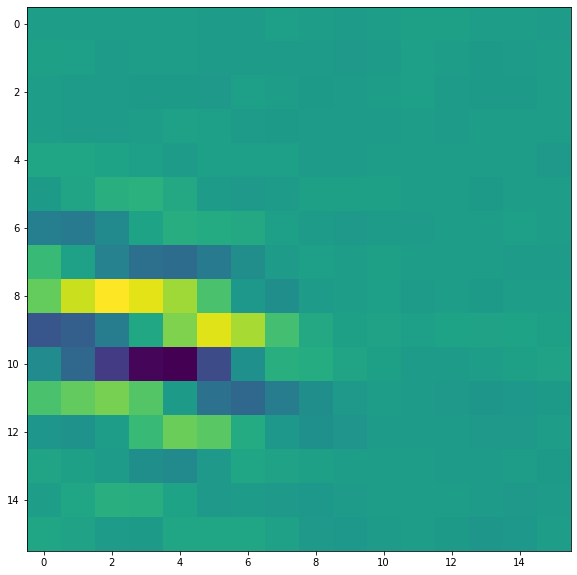

In [1381]:
plt.imshow(sparsenet_rfhistory[-1][t5][11].reshape(16,16))

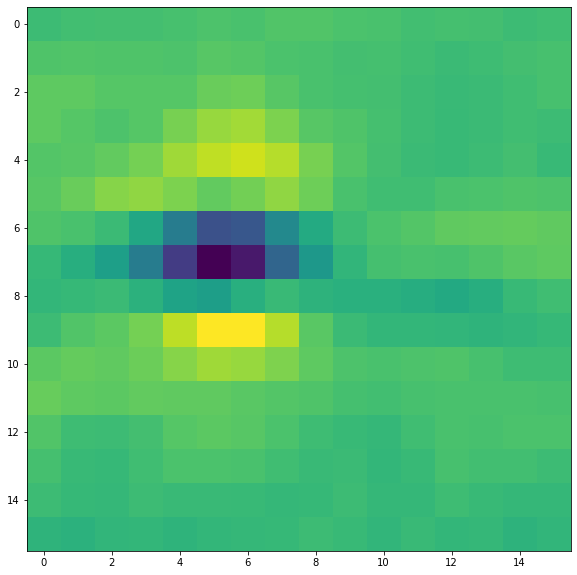

In [1357]:
plt.imshow(sparsenet_rfhistory[-1][t2][2].reshape(16,16))

In [61]:
def phase_shift(rf, magnitude=1, dims=16):
    rf = rf.reshape(dims,dims)
    grad = np.gradient(rf)
    grad_mag = np.sqrt(grad[0]**2+grad[1]**2)
    
    max_idxs = np.unravel_index(grad_mag.argmax(), (dims,dims))
    scale_factor = magnitude/grad_mag[max_idxs]
    
    eps_row = grad[0][max_idxs]
    eps_col = grad[1][max_idxs]
    fourier_transform = np.fft.fftn(rf)
    for u in range(dims):
        for v in range(dims):
            fourier_transform[u,v] *= np.exp(-1j*(2*np.pi*u*eps_row*scale_factor/dims + 2*np.pi*v*eps_col*scale_factor/dims))
#     print(np.arctan(eps_x/eps_y))
    return np.fft.ifftn(fourier_transform).real

In [64]:
sparsenet_rfhistory[-1][sparsenet_freq_1][0].shape

(256,)

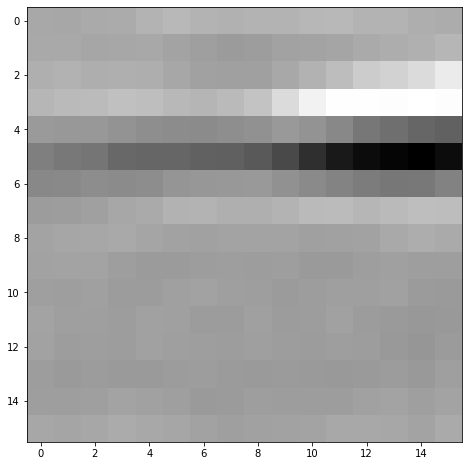

Idx: 0 Mean: 0.014678346924483776 Stdev: 0.06075192242860794 Min: -0.27992862462997437 Max: 0.1945182979106903


In [86]:
utils.display_image(sparsenet_rfhistory[-1][sparsenet_freq_2][2][:,np.newaxis],reshape_dims=(16,16),idx=0)

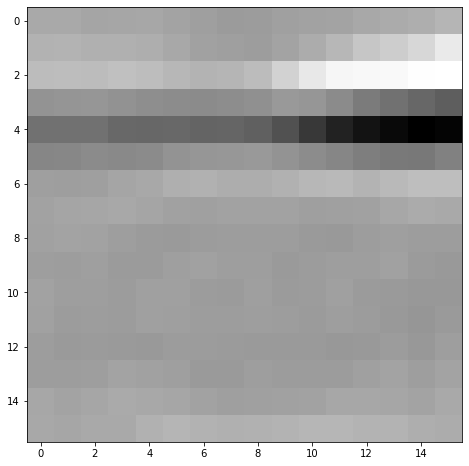

Idx: 0 Mean: 0.01467834785580635 Stdev: 0.0605502612888813 Min: -0.28770825266838074 Max: 0.20169448852539062


In [85]:
utils.display_image(phase_shift(sparsenet_rfhistory[-1][sparsenet_freq_2][2],magnitude=1)[:,np.newaxis],reshape_dims=(16,16),idx=0)

In [1419]:
t1 = np.where(get_max_frequencies(sparsenet_rfhistory[-1]) == 1)[0]
t2 = np.where(get_max_frequencies(sparsenet_rfhistory[-1]) == 2)[0]
t3 = np.where(get_max_frequencies(sparsenet_rfhistory[-1]) == 3)[0]
t4 = np.where(get_max_frequencies(sparsenet_rfhistory[-1]) == 4)[0]
t5 = np.where(get_max_frequencies(sparsenet_rfhistory[-1]) == 5)[0]
t6 = np.where(get_max_frequencies(sparsenet_rfhistory[-1]) == 6)[0]
t7 = np.where(get_max_frequencies(sparsenet_rfhistory[-1]) == 7)[0]
t8 = np.where(get_max_frequencies(sparsenet_rfhistory[-1]) == 8)[0]

In [91]:
lf_phase = [np.dot(phase_shift(rf).ravel(),rf)/np.linalg.norm(phase_shift(rf))/np.linalg.norm(rf) for rf in sparsenet_rfhistory[-1][sparsenet_freq_1]]
mf_phase = [np.dot(phase_shift(rf).ravel(),rf)/np.linalg.norm(phase_shift(rf))/np.linalg.norm(rf) for rf in sparsenet_rfhistory[-1][sparsenet_freq_2]]
hf_phase = [np.dot(phase_shift(rf).ravel(),rf)/np.linalg.norm(phase_shift(rf))/np.linalg.norm(rf) for rf in sparsenet_rfhistory[-1][sparsenet_freq_3]]

In [92]:
lf_sailnet_phase = [np.dot(phase_shift(rf).ravel(),rf)/np.linalg.norm(phase_shift(rf))/np.linalg.norm(rf) for rf in sailnet_rfhistory[-1][sailnet_freq_1]]
mf_sailnet_phase = [np.dot(phase_shift(rf).ravel(),rf)/np.linalg.norm(phase_shift(rf))/np.linalg.norm(rf) for rf in sailnet_rfhistory[-1][sailnet_freq_2]]
hf_sailnet_phase = [np.dot(phase_shift(rf).ravel(),rf)/np.linalg.norm(phase_shift(rf))/np.linalg.norm(rf) for rf in sailnet_rfhistory[-1][sailnet_freq_3]]

([], <a list of 0 Text yticklabel objects>)

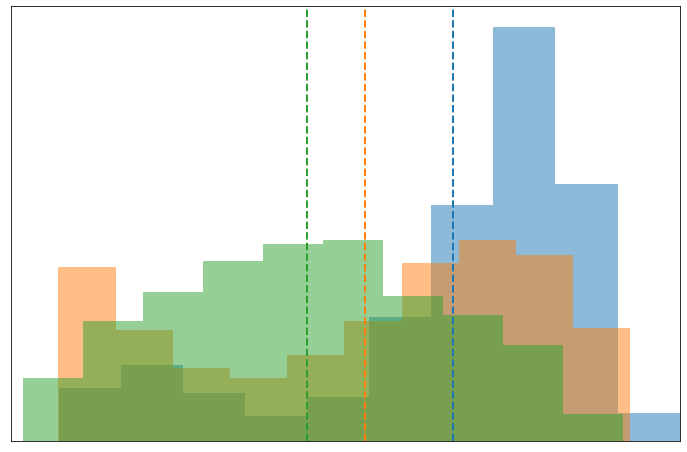

In [96]:
# plt.hist([get_similarity(phase_shift(rf).ravel(), rf) for rf in sparsenet_rfhistory[-1][t1]], density=True, alpha=0.5)
plt.hist(lf_phase, alpha=0.5, label='Low frequency')
plt.axvline(np.mean(lf_phase), color='tab:blue', linestyle='dashed', linewidth=2)

plt.hist(mf_phase, alpha=0.5, label='Mid frequency')
plt.axvline(np.mean(mf_phase), color='tab:orange', linestyle='dashed', linewidth=2)

plt.hist(hf_phase, alpha=0.5, label='High frequency')
plt.axvline(np.mean(hf_phase), color='tab:green', linestyle='dashed', linewidth=2)


# plt.legend(fontsize=36)
plt.xlim([-1,1])
plt.xticks([], fontsize=36)
plt.yticks(fontsize=36)
plt.yticks([])
# plt.xlabel('similarity$(BF, BF^\prime)$', fontsize=36, labelpad=16)
# plt.ylabel('Density', fontsize=36, labelpad=16)



# plt.axvline(np.mean([np.dot(phase_shift(rf).ravel(),rf)/np.linalg.norm(phase_shift(rf))/np.linalg.norm(rf) for rf in sparsenet_rfhistory[-1][t6]]), color='tab:red')


# plt.hist([np.dot(phase_shift(rf).ravel(),rf)/np.linalg.norm(phase_shift(rf))/np.linalg.norm(rf) for rf in sparsenet_rfhistory[-1][t7]], alpha=0.5)
# plt.axvline(np.mean([np.dot(phase_shift(rf).ravel(),rf)/np.linalg.norm(phase_shift(rf))/np.linalg.norm(rf) for rf in sparsenet_rfhistory[-1][t7]]), color='tab:red')


# plt.hist([np.dot(phase_shift(rf).ravel(),rf)/np.linalg.norm(phase_shift(rf))/np.linalg.norm(rf) for rf in sparsenet_rfhistory[-1][t8]], alpha=0.5)
# plt.axvline(np.mean([np.dot(phase_shift(rf).ravel(),rf)/np.linalg.norm(phase_shift(rf))/np.linalg.norm(rf) for rf in sparsenet_rfhistory[-1][t8]]), color='tab:red')




([], <a list of 0 Text yticklabel objects>)

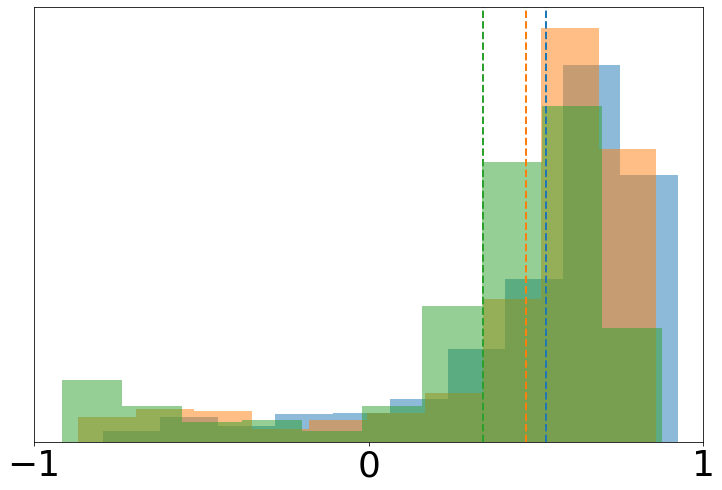

In [106]:
plt.hist(lf_sailnet_phase, alpha=0.5, label='Low frequency')
plt.axvline(np.mean(lf_sailnet_phase), color='tab:blue', linestyle='dashed', linewidth=2)

plt.hist(mf_sailnet_phase, alpha=0.5, label='Mid frequency')
plt.axvline(np.mean(mf_sailnet_phase), color='tab:orange', linestyle='dashed', linewidth=2)

plt.hist(hf_sailnet_phase, alpha=0.5, label='High frequency')
plt.axvline(np.mean(hf_sailnet_phase), color='tab:green', linestyle='dashed', linewidth=2)


# plt.legend(fontsize=36)
plt.xlim([-1,1])
plt.xticks([-1, 0, 1], fontsize=36)
# plt.xticks([],fontsize=36)
plt.yticks(fontsize=36)
plt.yticks([])
# plt.xlabel('similarity$(BF, BF^\prime)$', fontsize=36, labelpad=16, fontweight='bold')
# plt.ylabel('Density', fontsize=36, labelpad=16)


Text(0, 0.5, 'Density')

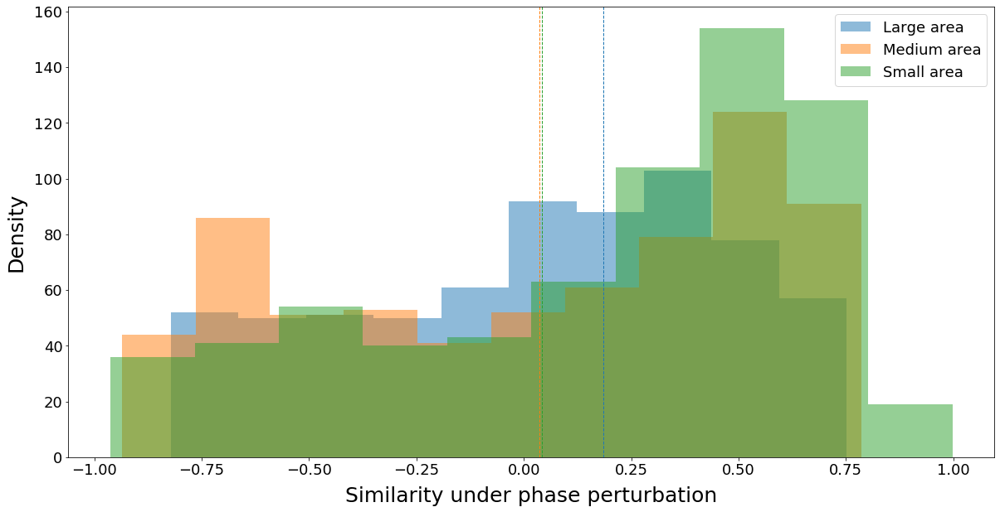

In [1451]:
plt.hist([np.dot(phase_shift(rf).ravel(),rf)/np.linalg.norm(phase_shift(rf))/np.linalg.norm(rf) for rf in sparsenet_rfhistory[-1][sparsenet_size_1]], alpha=0.5, label='Large area')
plt.axvline(np.mean([np.dot(phase_shift(rf).ravel(),rf)/np.linalg.norm(phase_shift(rf))/np.linalg.norm(rf) for rf in sparsenet_rfhistory[-1][sparsenet_size_1]]), color='tab:green', linestyle='dashed', linewidth=1)

plt.hist([np.dot(phase_shift(rf).ravel(),rf)/np.linalg.norm(phase_shift(rf))/np.linalg.norm(rf) for rf in sparsenet_rfhistory[-1][sparsenet_size_2]], alpha=0.5, label='Medium area')
plt.axvline(np.mean([np.dot(phase_shift(rf).ravel(),rf)/np.linalg.norm(phase_shift(rf))/np.linalg.norm(rf) for rf in sparsenet_rfhistory[-1][sparsenet_size_2]]), color='tab:orange', linestyle='dashed', linewidth=1)

# plt.hist([get_similarity(phase_shift(rf).ravel(), rf) for rf in sparsenet_rfhistory[-1][t1]], density=True, alpha=0.5)
plt.hist([np.dot(phase_shift(rf).ravel(),rf)/np.linalg.norm(phase_shift(rf))/np.linalg.norm(rf) for rf in sparsenet_rfhistory[-1][sparsenet_size_3]], alpha=0.5, label='Small area')
plt.axvline(np.mean([np.dot(phase_shift(rf).ravel(),rf)/np.linalg.norm(phase_shift(rf))/np.linalg.norm(rf) for rf in sparsenet_rfhistory[-1][sparsenet_size_3]]), color='tab:blue', linestyle='dashed', linewidth=1)

plt.legend(fontsize=18)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.xlabel('Similarity under phase perturbation', fontsize=25, labelpad=10)
plt.ylabel('Density', fontsize=25, labelpad=10)

In [1425]:
t1 = np.where(get_max_frequencies(sailnet_rfhistory[-1]) == 1)[0]
t2 = np.where(get_max_frequencies(sailnet_rfhistory[-1]) == 2)[0]
t3 = np.where(get_max_frequencies(sailnet_rfhistory[-1]) == 3)[0]
t4 = np.where(get_max_frequencies(sailnet_rfhistory[-1]) == 4)[0]
t5 = np.where(get_max_frequencies(sailnet_rfhistory[-1]) == 5)[0]

In [1430]:
print(np.mean([np.abs(np.dot(phase_shift(rf).ravel(),rf))/np.linalg.norm(phase_shift(rf))/np.linalg.norm(rf) for rf in sailnet_rfhistory[-1][t1]]))
print(np.mean([np.abs(np.dot(phase_shift(rf).ravel(),rf))/np.linalg.norm(phase_shift(rf))/np.linalg.norm(rf) for rf in sailnet_rfhistory[-1][t2]]))
print(np.mean([np.abs(np.dot(phase_shift(rf).ravel(),rf))/np.linalg.norm(phase_shift(rf))/np.linalg.norm(rf) for rf in sailnet_rfhistory[-1][t3]]))
print(np.mean([np.abs(np.dot(phase_shift(rf).ravel(),rf))/np.linalg.norm(phase_shift(rf))/np.linalg.norm(rf) for rf in sailnet_rfhistory[-1][t4]]))
print(np.mean([np.abs(np.dot(phase_shift(rf).ravel(),rf))/np.linalg.norm(phase_shift(rf))/np.linalg.norm(rf) for rf in sailnet_rfhistory[-1][t5]]))


0.596364421349389
0.5742741532828033
0.5083631813224132
0.40203459227683086
0.0199501190413139


Text(0.5, 0, 'Similarity under phase perturbation')

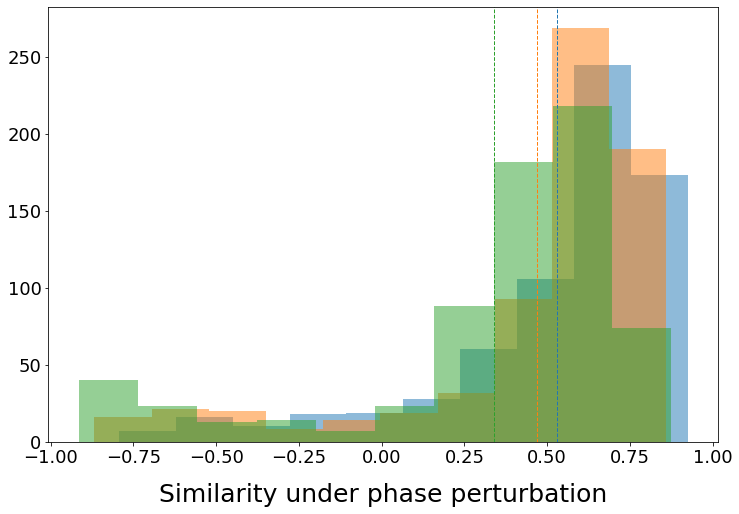

In [1648]:
# plt.hist([get_similarity(phase_shift(rf).ravel(), rf) for rf in sailnet_rfhistory[-1][t1]], density=True, alpha=0.5)
plt.hist([np.dot(phase_shift(rf).ravel(),rf)/np.linalg.norm(phase_shift(rf))/np.linalg.norm(rf) for rf in sailnet_rfhistory[-1][sailnet_freq_1]], alpha=0.5, label='Low frequency')
plt.axvline(np.mean([np.dot(phase_shift(rf).ravel(),rf)/np.linalg.norm(phase_shift(rf).ravel())/np.linalg.norm(rf) for rf in sailnet_rfhistory[-1][sailnet_freq_1]]), color='tab:blue', linestyle='dashed', linewidth=1)

plt.hist([np.dot(phase_shift(rf).ravel(),rf)/np.linalg.norm(phase_shift(rf))/np.linalg.norm(rf) for rf in sailnet_rfhistory[-1][sailnet_freq_2]], alpha=0.5, label='Mid frequency')
plt.axvline(np.mean([np.dot(phase_shift(rf).ravel(),rf)/np.linalg.norm(phase_shift(rf).ravel())/np.linalg.norm(rf) for rf in sailnet_rfhistory[-1][sailnet_freq_2]]), color='tab:orange', linestyle='dashed', linewidth=1)

plt.hist([np.dot(phase_shift(rf).ravel(),rf)/np.linalg.norm(phase_shift(rf))/np.linalg.norm(rf) for rf in sailnet_rfhistory[-1][sailnet_freq_3]], alpha=0.5, label='High frequency')
plt.axvline(np.mean([np.dot(phase_shift(rf).ravel(),rf)/np.linalg.norm(phase_shift(rf).ravel())/np.linalg.norm(rf) for rf in sailnet_rfhistory[-1][sailnet_freq_3]]), color='tab:green', linestyle='dashed', linewidth=1)



# plt.legend(fontsize=18)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.xlabel('Similarity under phase perturbation', fontsize=25, labelpad=16)
# plt.ylabel('Density', fontsize=25, labelpad=16)

Text(0.5, 0, 'Similarity under phase perturbation')

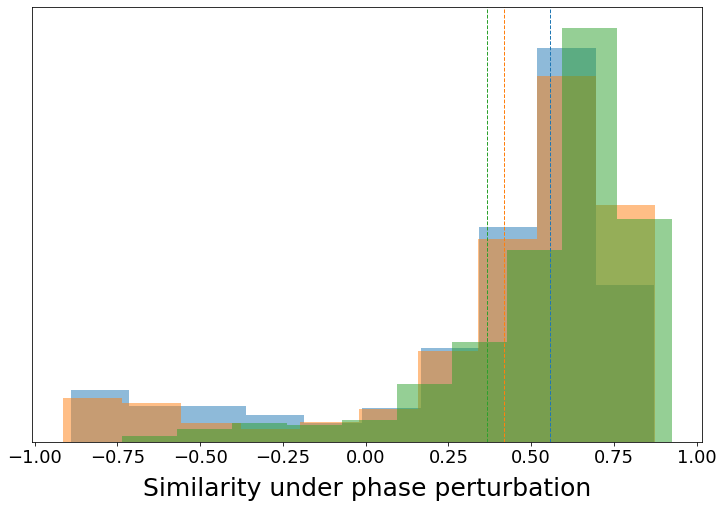

In [1645]:
plt.hist([np.dot(phase_shift(rf).ravel(),rf)/np.linalg.norm(phase_shift(rf))/np.linalg.norm(rf) for rf in sailnet_rfhistory[-1][sailnet_size_1]], alpha=0.5, label='Large area')
plt.axvline(np.mean([np.dot(phase_shift(rf).ravel(),rf)/np.linalg.norm(phase_shift(rf))/np.linalg.norm(rf) for rf in sailnet_rfhistory[-1][sailnet_size_1]]), color='tab:green', linestyle='dashed', linewidth=1)

plt.hist([np.dot(phase_shift(rf).ravel(),rf)/np.linalg.norm(phase_shift(rf))/np.linalg.norm(rf) for rf in sailnet_rfhistory[-1][sailnet_size_2]], alpha=0.5, label='Medium area')
plt.axvline(np.mean([np.dot(phase_shift(rf).ravel(),rf)/np.linalg.norm(phase_shift(rf))/np.linalg.norm(rf) for rf in sailnet_rfhistory[-1][sailnet_size_2]]), color='tab:orange', linestyle='dashed', linewidth=1)

# plt.hist([get_similarity(phase_shift(rf).ravel(), rf) for rf in sailnet_rfhistory[-1][t1]], density=True, alpha=0.5)
plt.hist([np.dot(phase_shift(rf).ravel(),rf)/np.linalg.norm(phase_shift(rf))/np.linalg.norm(rf) for rf in sailnet_rfhistory[-1][sailnet_size_3]], alpha=0.5, label='Small area')
plt.axvline(np.mean([np.dot(phase_shift(rf).ravel(),rf)/np.linalg.norm(phase_shift(rf))/np.linalg.norm(rf) for rf in sailnet_rfhistory[-1][sailnet_size_3]]), color='tab:blue', linestyle='dashed', linewidth=1)

# plt.legend(fontsize=18)
plt.xticks(fontsize=18)
# plt.yticks(fontsize=18)
plt.yticks([])
plt.xlabel('Similarity under phase perturbation', fontsize=25, labelpad=10)
# plt.ylabel('Density', fontsize=25, labelpad=10)

In [809]:
np.savez('run-results/sailnet/classifications/sailnet10x100klow_freq', sailnet_freq_1)
np.savez('run-results/sailnet/classifications/sailnet10x100kmid_freq', sailnet_freq_2)
np.savez('run-results/sailnet/classifications/sailnet10x100khigh_freq', sailnet_freq_3)

In [898]:
np.savez('run-results/sailnet/classifications/sailnet10x100k2low_freq', sailnet2_freq_1)
np.savez('run-results/sailnet/classifications/sailnet10x100k2mid_freq', sailnet2_freq_2)
np.savez('run-results/sailnet/classifications/sailnet10x100k2high_freq', sailnet2_freq_3)

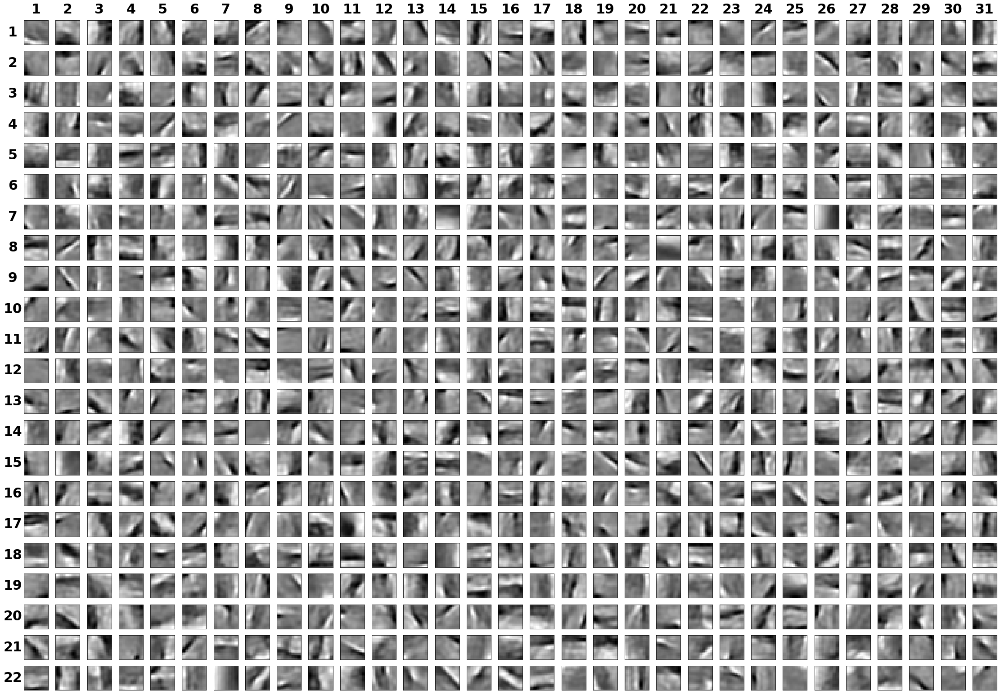

In [290]:
f = utils.display_patches(len(sailnet_freq_1),sailnet_rfhistory[-1][sailnet_freq_1],display=True,center=True)

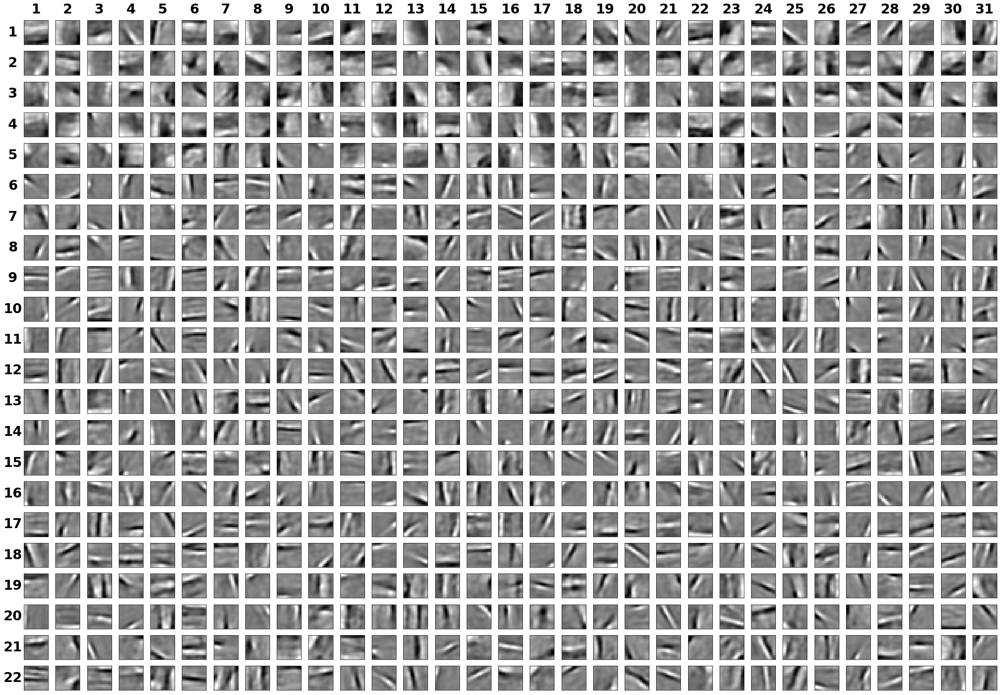

In [298]:
f = utils.display_patches(len(sailnet_freq_2),sailnet_rfhistory[-1][sailnet_freq_2],display=True,center=True)

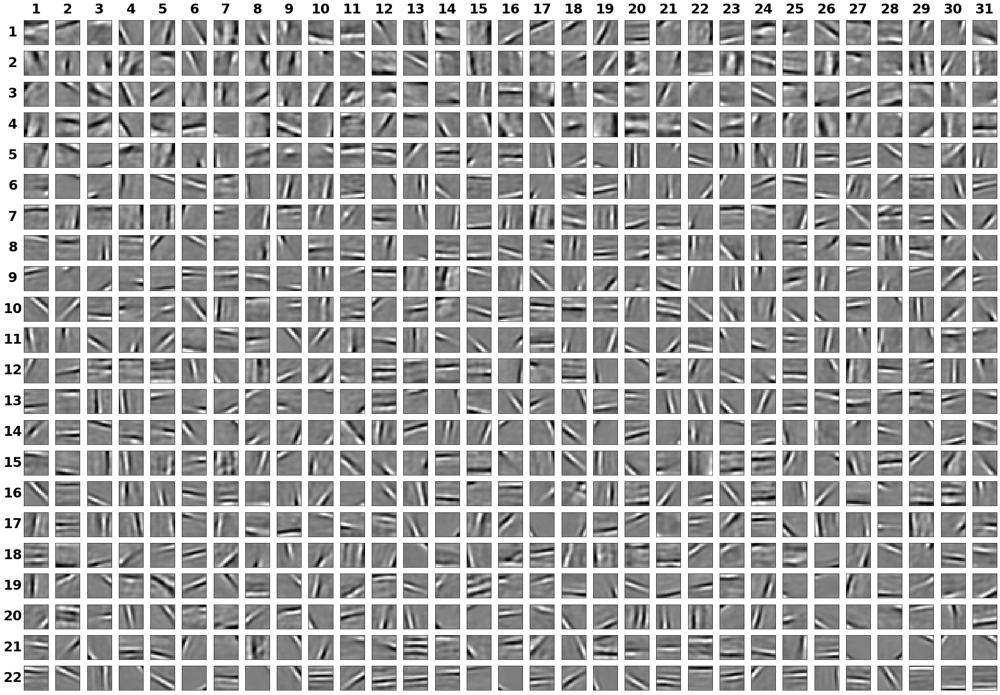

In [205]:
f = utils.display_patches(len(sailnet_freq_3),sailnet_rfhistory[-1][sailnet_freq_3],display=True,center=True)

<Figure size 1440x720 with 0 Axes>

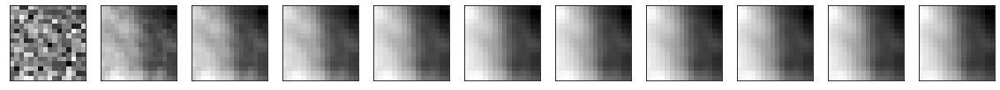

<Figure size 1440x720 with 0 Axes>

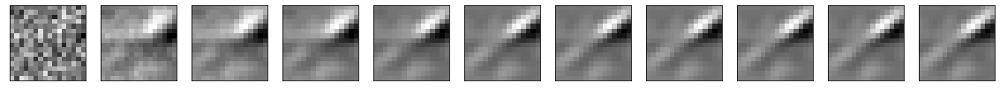

<Figure size 1440x720 with 0 Axes>

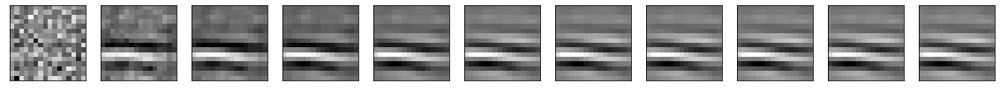

In [303]:
display_rfs_over_time(sailnet_rfhistory, interval=10, idx=sailnet_freq_1[85], center=False)
display_rfs_over_time(sailnet_rfhistory, interval=10, idx=sailnet_freq_2[181], center=False)
display_rfs_over_time(sailnet_rfhistory, interval=10, idx=sailnet_freq_3[671], center=False)

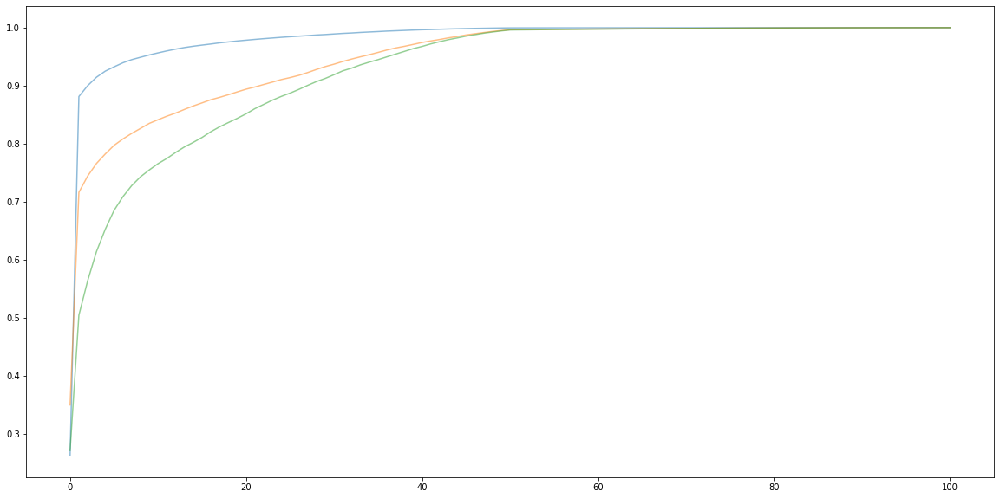

In [302]:
plt.plot([rf[sailnet_freq_1][85] for rf in get_similarity_over_time(sailnet_rfhistory,stepwise=False,ref_idx=-1)], color='tab:blue',alpha=0.5)
plt.plot([rf[sailnet_freq_2][181] for rf in get_similarity_over_time(sailnet_rfhistory,stepwise=False,ref_idx=-1)], color='tab:orange',alpha=0.5)
plt.plot([rf[sailnet_freq_3][671] for rf in get_similarity_over_time(sailnet_rfhistory,stepwise=False,ref_idx=-1)], color='tab:green',alpha=0.5)

In [34]:
sailnet_size_1, sailnet_size_2, sailnet_size_3 = split_by_property(sailnet_gabor_params,prop='sigmaarea')

In [807]:
np.savez('run-results/sailnet/classifications/sailnet10x100ksmall', sailnet_size_1)
np.savez('run-results/sailnet/classifications/sailnet10x100kmed', sailnet_size_2)
np.savez('run-results/sailnet/classifications/sailnet10x100klarge', sailnet_size_3)

In [444]:
sailnet_fitfreq_1, sailnet_fitfreq_2, sailnet_fitfreq_3 = split_by_property(sailnet_gabor_params,prop='freq')

In [808]:
np.savez('run-results/sailnet/classifications/sailnet10x100klowfgabor', sailnet_fitfreq_1)
np.savez('run-results/sailnet/classifications/sailnet10x100kmidfgabor', sailnet_fitfreq_2)
np.savez('run-results/sailnet/classifications/sailnet10x100khighfgabor', sailnet_fitfreq_3)

In [38]:
patchify_gabor_fits(sailnet_gabor_params)

NameError: name 'ellgaussconstructor' is not defined

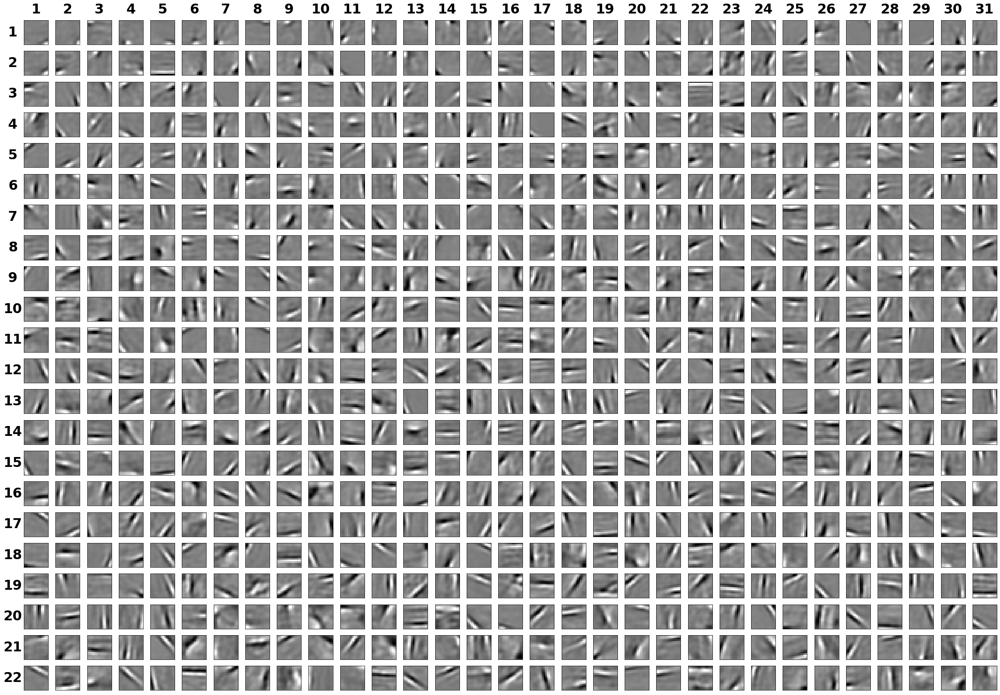

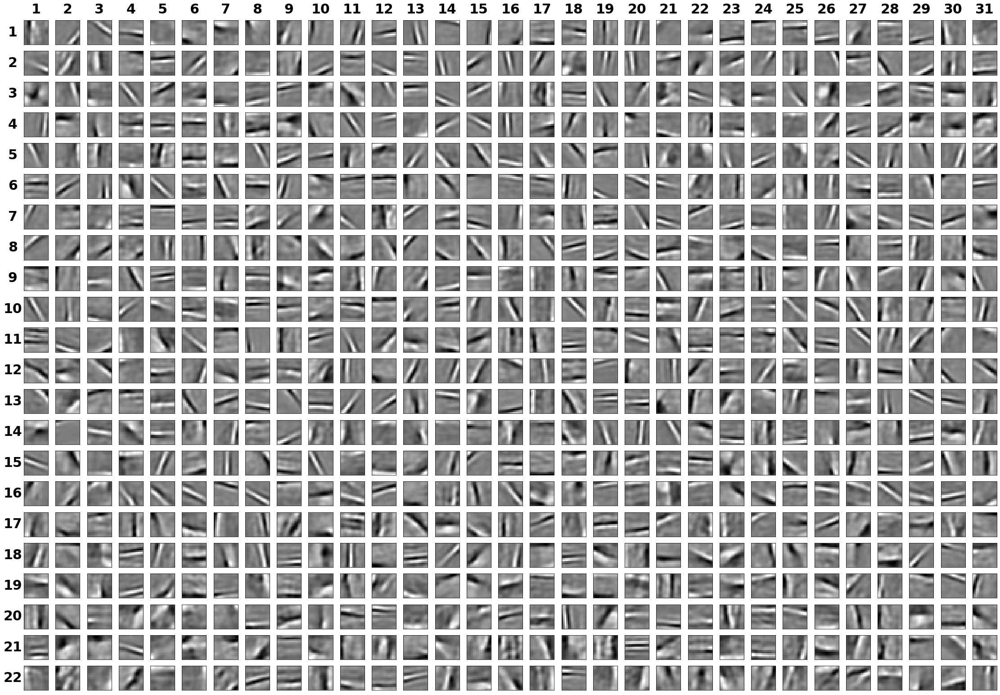

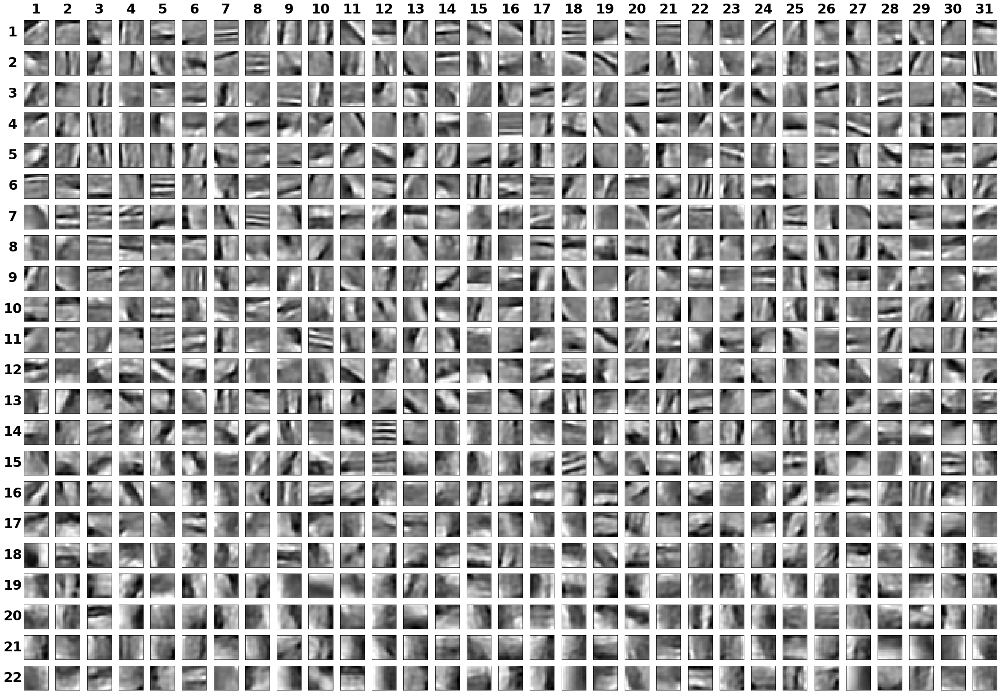

In [36]:
f = utils.display_patches(len(sailnet_size_1),sailnet_rfhistory[-1][sailnet_size_1],display=True,center=True)
f = utils.display_patches(len(sailnet_size_2),sailnet_rfhistory[-1][sailnet_size_2],display=True,center=True)
f = utils.display_patches(len(sailnet_size_3),sailnet_rfhistory[-1][sailnet_size_3],display=True,center=True)

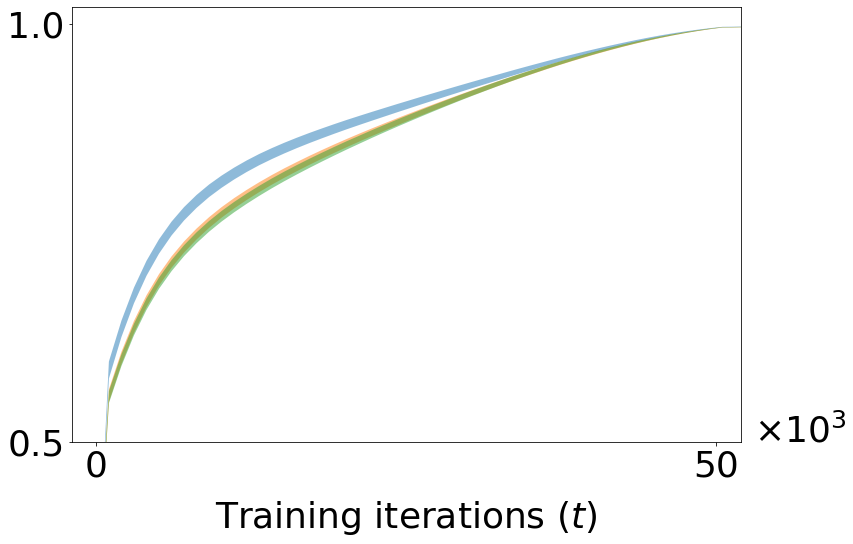

In [35]:
plot_mean_timecourse(sailnet_rfhistory, 
                     [sailnet_size_3, sailnet_size_2, sailnet_size_1], 
                     ['Large', 'Medium', 'Small'], 
                     stepwise=False, 
                     ref_idx=-1)

<Figure size 1440x720 with 0 Axes>

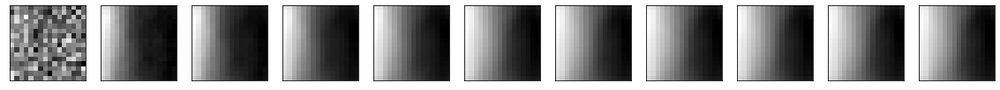

<Figure size 1440x720 with 0 Axes>

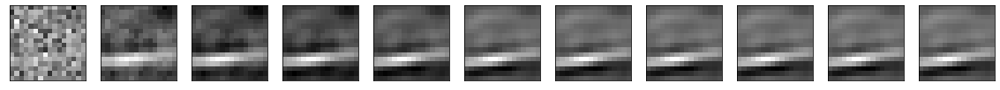

<Figure size 1440x720 with 0 Axes>

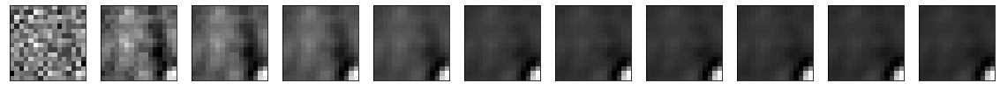

In [524]:
f = display_rfs_over_time(sailnet_rfhistory, interval=10, idx=sailnet_size_3[-5], center=False)
f = display_rfs_over_time(sailnet_rfhistory, interval=10, idx=sailnet_size_2[25], center=False)
f = display_rfs_over_time(sailnet_rfhistory, interval=10, idx=sailnet_size_1[1], center=False)


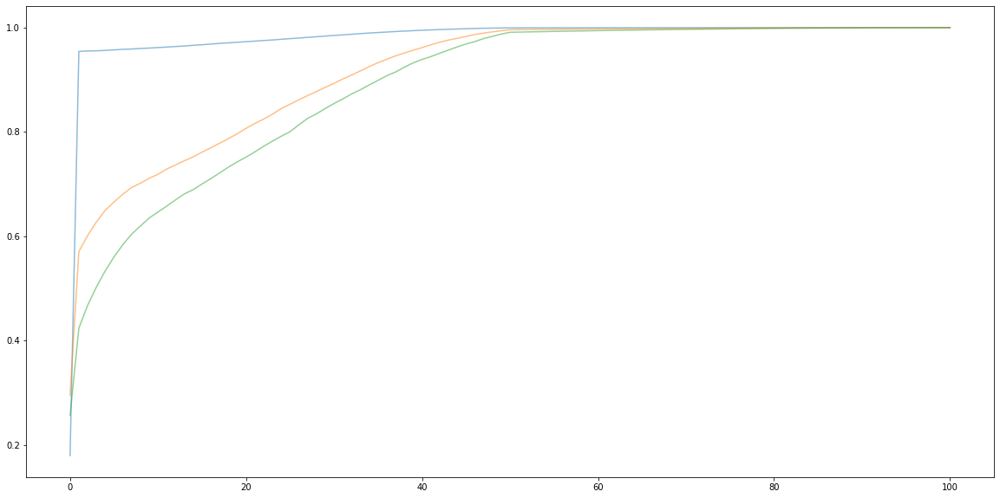

In [525]:
plt.plot([rf[sailnet_size_3][-5] for rf in get_similarity_over_time(sailnet_rfhistory,stepwise=False,ref_idx=-1)], color='tab:blue',alpha=0.5)
plt.plot([rf[sailnet_size_2][25] for rf in get_similarity_over_time(sailnet_rfhistory,stepwise=False,ref_idx=-1)], color='tab:orange',alpha=0.5)
plt.plot([rf[sailnet_size_1][1] for rf in get_similarity_over_time(sailnet_rfhistory,stepwise=False,ref_idx=-1)], color='tab:green',alpha=0.5)

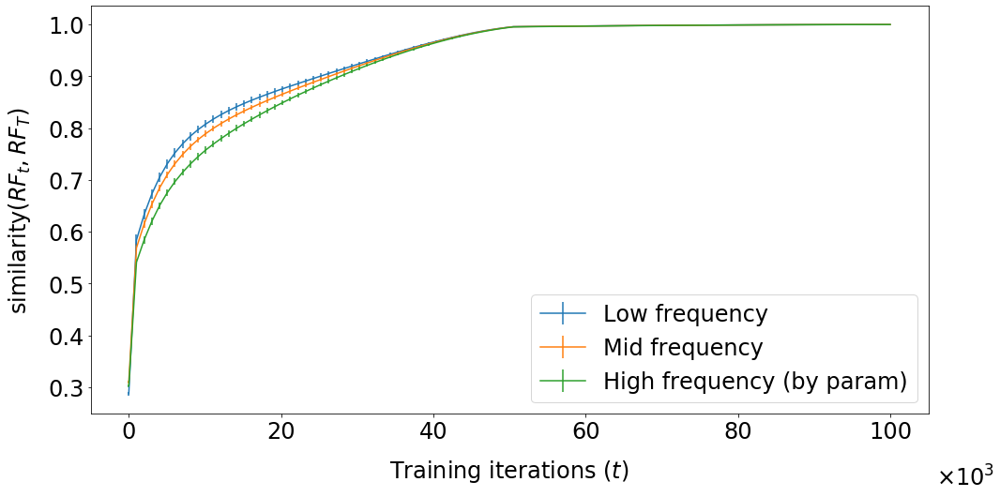

In [1573]:
plot_mean_timecourse(sailnet_rfhistory, 
                     [sailnet_fitfreq_1, sailnet_fitfreq_2, sailnet_fitfreq_3], 
                     ['Low frequency', 'Mid frequency', 'High frequency (by param)'], 
                     stepwise=False, 
                     ref_idx=-1)

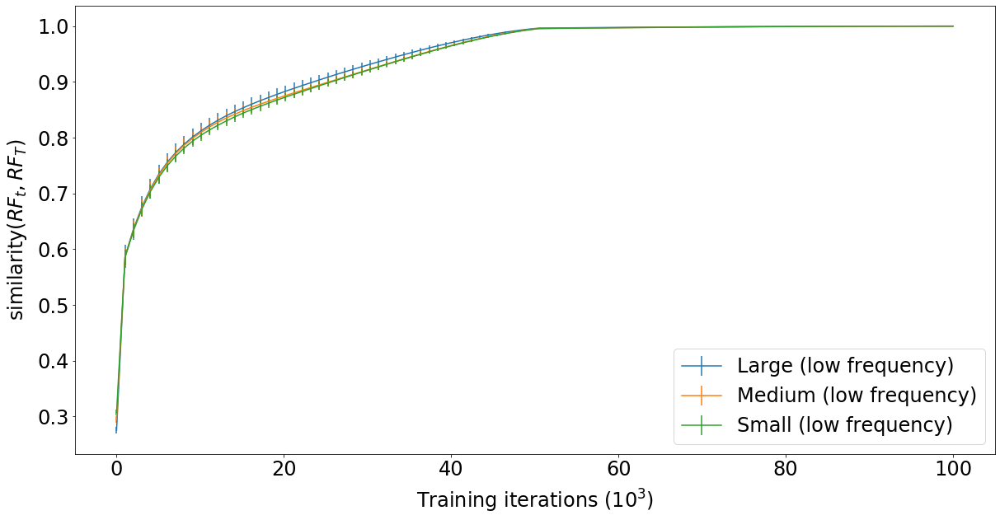

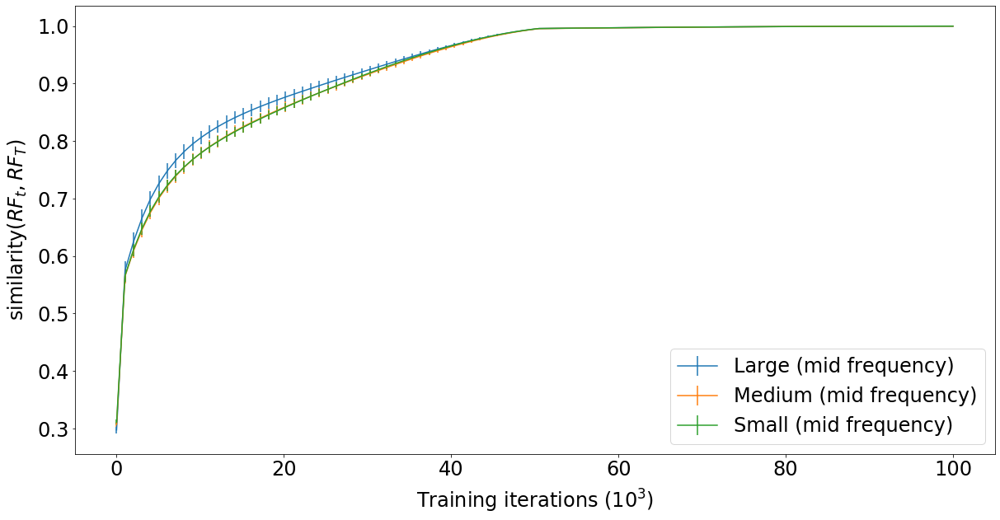

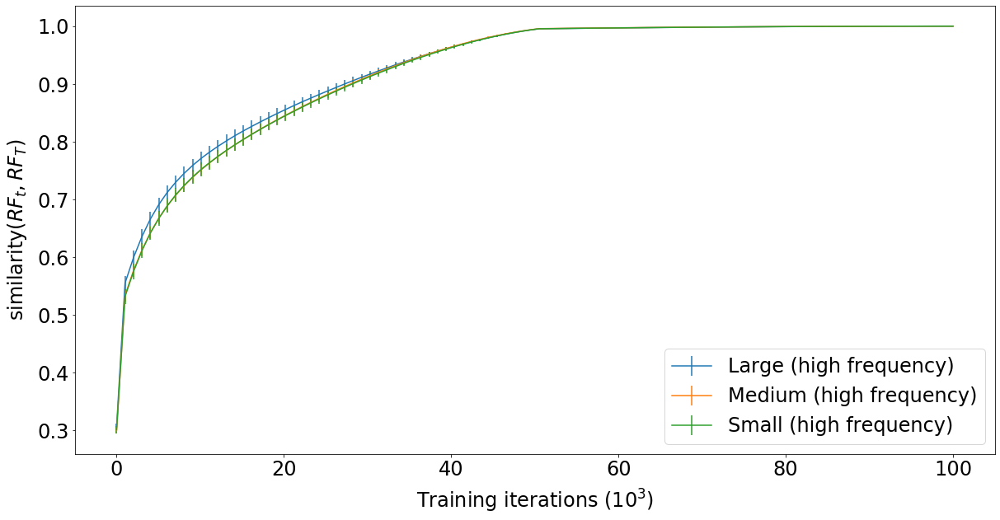

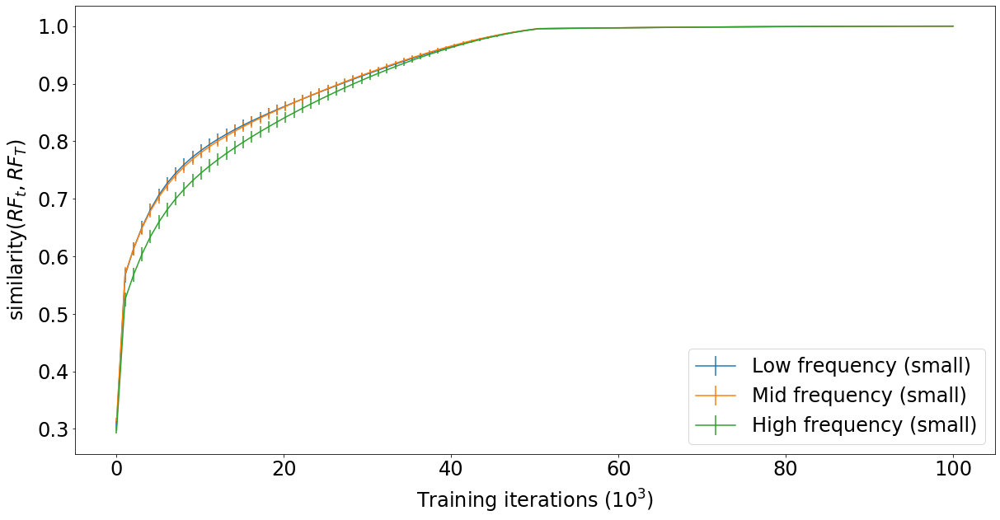

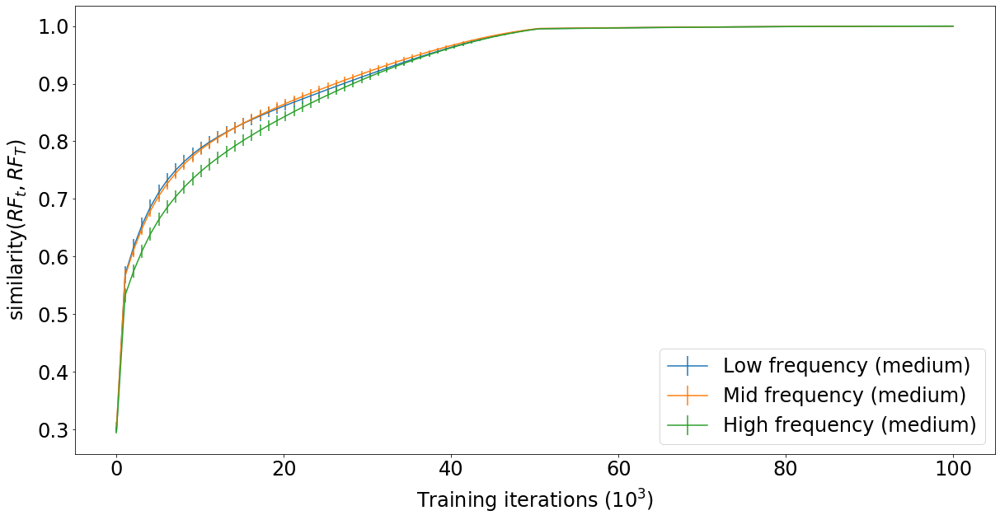

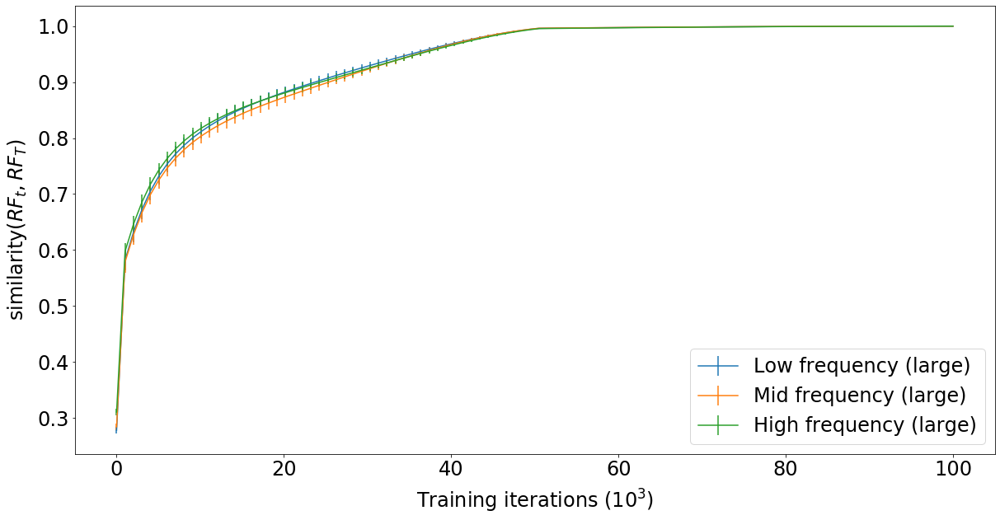

In [761]:
test1, test2, test3 = split_by_property(sailnet_gabor_params[sailnet_freq_1], prop='sigmaarea')
plot_mean_timecourse(sailnet_rfhistory, 
                     [sailnet_freq_1[test3], sailnet_freq_1[test2], sailnet_freq_1[test1]], 
                     ['Large (low frequency)', 'Medium (low frequency)', 'Small (low frequency)'], 
                     stepwise=False, 
                     ref_idx=-1)

test1, test2, test3 = split_by_property(sailnet_gabor_params[sailnet_freq_2], prop='sigmaarea')
plot_mean_timecourse(sailnet_rfhistory, 
                     [sailnet_freq_2[test3], sailnet_freq_2[test2], sailnet_freq_2[test1]], 
                     ['Large (mid frequency)', 'Medium (mid frequency)', 'Small (mid frequency)'], 
                     stepwise=False, 
                     ref_idx=-1)

test1, test2, test3 = split_by_property(sailnet_gabor_params[sailnet_freq_3], prop='sigmaarea')
plot_mean_timecourse(sailnet_rfhistory, 
                     [sailnet_freq_3[test3], sailnet_freq_3[test2], sailnet_freq_3[test1]], 
                     ['Large (high frequency)', 'Medium (high frequency)', 'Small (high frequency)'], 
                     stepwise=False, 
                     ref_idx=-1)

test1, test2, test3 = split_by_property(sailnet_rfhistory[-1][sailnet_size_1])
plot_mean_timecourse(sailnet_rfhistory, 
                     [sailnet_size_1[test1], sailnet_size_1[test2], sailnet_size_1[test3]], 
                     ['Low frequency (small)', 'Mid frequency (small)', 'High frequency (small)'], 
                     stepwise=False, 
                     ref_idx=-1)

test1, test2, test3 = split_by_property(sailnet_rfhistory[-1][sailnet_size_2])
plot_mean_timecourse(sailnet_rfhistory, 
                     [sailnet_size_2[test1], sailnet_size_2[test2], sailnet_size_2[test3]], 
                     ['Low frequency (medium)', 'Mid frequency (medium)', 'High frequency (medium)'], 
                     stepwise=False, 
                     ref_idx=-1)

test1, test2, test3 = split_by_property(sailnet_rfhistory[-1][sailnet_size_3])
plot_mean_timecourse(sailnet_rfhistory, 
                     [sailnet_size_3[test1], sailnet_size_3[test2], sailnet_size_3[test3]], 
                     ['Low frequency (large)', 'Mid frequency (large)', 'High frequency (large)'], 
                     stepwise=False, 
                     ref_idx=-1)

## ANOVA testing for size/frequency

In [733]:
sailnet_similarity_curves = get_similarity_over_time(sailnet_rfhistory, stepwise=False, ref_idx=-1)
sailnet_curves_area = np.trapz(np.array(sailnet_similarity_curves), axis=0)

In [741]:
features = [get_max_frequencies(sailnet_rfhistory[-1]), get_param(sailnet_gabor_params, param_str='sigmaarea')]

In [739]:
features = [get_max_frequencies(sailnet_rfhistory[-1])]

In [742]:
ANOVA_test(sailnet_curves_area, features)

{'r2': 0.04790541212642219,
 'coeffs': array([-0.1795625 ,  0.06471419]),
 'ev': array([0.88504377, 0.11495623])}

(array([829.,   0., 672.,   0.,   0., 510.,   0.,  34.,   0.,   3.]),
 array([1. , 1.4, 1.8, 2.2, 2.6, 3. , 3.4, 3.8, 4.2, 4.6, 5. ]),
 <a list of 10 Patch objects>)

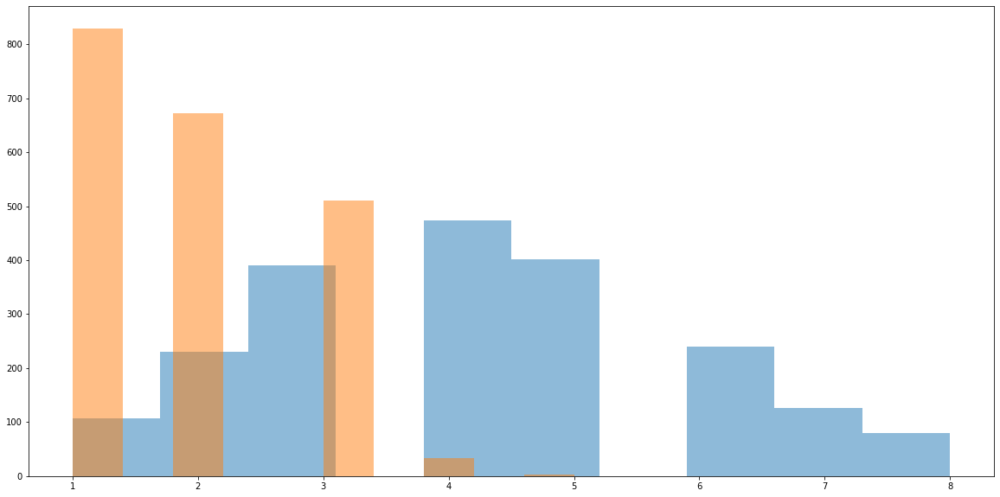

In [777]:
plt.hist(get_max_frequencies(sparsenet_rfhistory[-1]), alpha=0.5)
plt.hist(get_max_frequencies(sailnet_rfhistory[-1]), alpha=0.5)

(array([300., 689., 403., 181., 136.,  78.,  63.,  47.,  44., 107.]),
 array([ 1.72932641,  7.95639377, 14.18346113, 20.41052849, 26.63759585,
        32.86466321, 39.09173057, 45.31879792, 51.54586528, 57.77293264,
        64.        ]),
 <a list of 10 Patch objects>)

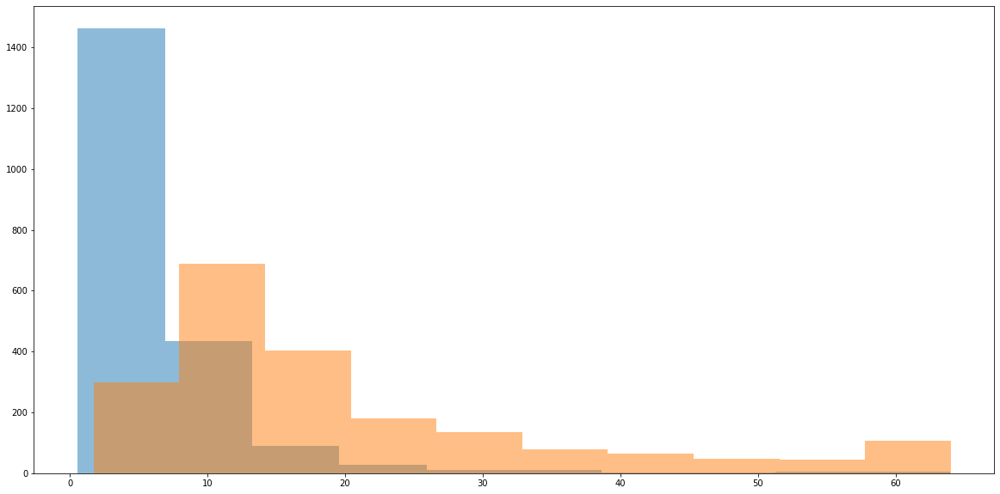

In [776]:
plt.hist(get_param(sparsenet_gabor_params, param_str='sigmaarea'), alpha=0.5)
plt.hist(get_param(sailnet_gabor_params, param_str='sigmaarea'), alpha=0.5)

Classify by mode

In [1017]:
t1 = np.where(get_max_frequencies(sailnet_rfhistory[-1]) == 1)[0]
t2 = np.where(get_max_frequencies(sailnet_rfhistory[-1]) == 2)[0]
t3 = np.where(get_max_frequencies(sailnet_rfhistory[-1]) == 3)[0]
t4 = np.where(get_max_frequencies(sailnet_rfhistory[-1]) == 4)[0]
t5 = np.where(get_max_frequencies(sailnet_rfhistory[-1]) == 5)[0]

In [882]:
t1 = np.where(get_max_frequencies(dodds10x100k_sailnet_rfhistory[5]) == 1)[0]
print(len(t1))
t2 = np.where(get_max_frequencies(dodds10x100k_sailnet_rfhistory[5]) == 2)[0]
print(len(t2))
t3 = np.where(get_max_frequencies(dodds10x100k_sailnet_rfhistory[5]) == 3)[0]
print(len(t3))
t4 = np.where(get_max_frequencies(dodds10x100k_sailnet_rfhistory[5]) == 4)[0]
print(len(t4))
t5 = np.where(get_max_frequencies(dodds10x100k_sailnet_rfhistory[5]) == 5)[0]
print(len(t5))
t6 = np.where(get_max_frequencies(dodds10x100k_sailnet_rfhistory[5]) == 6)[0]
print(len(t6))
t7 = np.where(get_max_frequencies(dodds10x100k_sailnet_rfhistory[5]) == 7)[0]
print(len(t7))
t8 = np.where(get_max_frequencies(dodds10x100k_sailnet_rfhistory[5]) == 8)[0]
print(len(t8))

0
0
1
5
68
215
632
1127


In [881]:
t1 = np.where(get_max_frequencies(dodds10x100k_sailnet_rfhistory[-1]) == 1)[0]
t2 = np.where(get_max_frequencies(dodds10x100k_sailnet_rfhistory[-1]) == 2)[0]
t3 = np.where(get_max_frequencies(dodds10x100k_sailnet_rfhistory[-1]) == 3)[0]
t4 = np.where(get_max_frequencies(dodds10x100k_sailnet_rfhistory[-1]) == 4)[0]
t5 = np.where(get_max_frequencies(dodds10x100k_sailnet_rfhistory[-1]) == 5)[0]
t6 = np.where(get_max_frequencies(dodds10x100k_sailnet_rfhistory[-1]) == 6)[0]
t7 = np.where(get_max_frequencies(dodds10x100k_sailnet_rfhistory[-1]) == 7)[0]
t8 = np.where(get_max_frequencies(dodds10x100k_sailnet_rfhistory[-1]) == 8)[0]

In [840]:
with open('../datasets/300kvanHaterenPCAdoddspre', 'rb') as f:
    impca, imshape = pickle.load(f)

In [843]:
impca.inverse_transform(sailnet_rfhistory[5])

array([[ 13.55611119,   4.92301228,  -6.85585274, ...,  -2.81124772,
          4.9190688 ,  12.20634248],
       [-29.9740288 , -28.33678249, -26.18436119, ..., -47.81750413,
        -47.36155465, -44.73307722],
       [ 35.33689269,  35.40016878,  33.58706805, ..., -81.3472445 ,
        -76.46981084, -71.52555488],
       ...,
       [-77.46141633, -81.48350722, -78.95264444, ..., -11.28432944,
        -17.10699088, -21.98413874],
       [ 25.35913074,  27.49889899,  30.1321526 , ...,  32.45139415,
         24.30808717,  16.90372332],
       [ 52.83612767,  56.63913317,  60.7221519 , ...,  -8.9074373 ,
        -13.70900953, -13.85350771]])

In [839]:
t1 = np.where(get_max_frequencies(sailnet_rfhistory[5]) == 1)[0]
print(len(t1))
t2 = np.where(get_max_frequencies(sailnet_rfhistory[5]) == 2)[0]
print(len(t2))
t3 = np.where(get_max_frequencies(sailnet_rfhistory[5]) == 3)[0]
print(len(t3))
t4 = np.where(get_max_frequencies(sailnet_rfhistory[5]) == 4)[0]
print(len(t4))
t5 = np.where(get_max_frequencies(sailnet_rfhistory[5]) == 5)[0]
print(len(t5))
t6 = np.where(get_max_frequencies(sailnet_rfhistory[5]) == 6)[0]
print(len(t6))
t7 = np.where(get_max_frequencies(sailnet_rfhistory[5]) == 7)[0]
print(len(t7))
t8 = np.where(get_max_frequencies(sailnet_rfhistory[5]) == 8)[0]
print(len(t8))

745
731
520
52
0
0
0
0


In [ ]:
sailnet_rfhistory

(array([107., 231., 391.,   0., 473., 401.,   0., 240., 126.,  79.]),
 array([1. , 1.7, 2.4, 3.1, 3.8, 4.5, 5.2, 5.9, 6.6, 7.3, 8. ]),
 <a list of 10 Patch objects>)

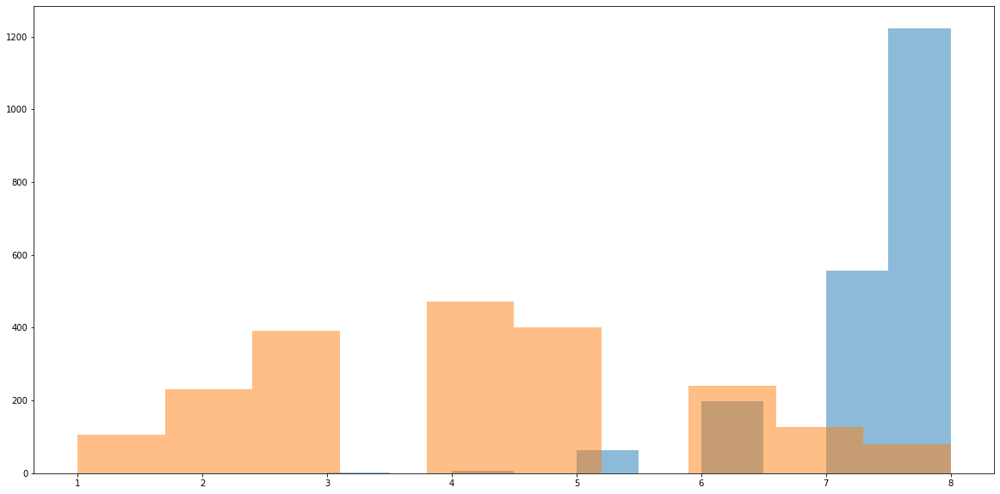

In [916]:

plt.hist(get_max_frequencies(sparsenet_rfhistory[0]), alpha=0.5)

# plt.hist(get_max_frequencies(sparsenet_rfhistory[40]), alpha=0.5)

# plt.hist(get_max_frequencies(sparsenet_rfhistory[60]), alpha=0.5)

# plt.hist(get_max_frequencies(sparsenet_rfhistory[80]), alpha=0.5)
plt.hist(get_max_frequencies(sparsenet_rfhistory[-1]), alpha=0.5)

In [904]:
t1 = np.where(get_max_frequencies(sailnet_rfhistory2[-1]) == 1)[0]
plt.plot()
t2 = np.where(get_max_frequencies(sailnet_rfhistory2[-1]) == 2)[0]
print(len(t2))
t3 = np.where(get_max_frequencies(sailnet_rfhistory2[-1]) == 3)[0]
print(len(t3))
t4 = np.where(get_max_frequencies(sailnet_rfhistory2[-1]) == 4)[0]
print(len(t4))
t5 = np.where(get_max_frequencies(sailnet_rfhistory2[-1]) == 5)[0]
print(len(t5))
t6 = np.where(get_max_frequencies(sailnet_rfhistory2[-1]) == 6)[0]
print(len(t6))
t7 = np.where(get_max_frequencies(sailnet_rfhistory2[-1]) == 7)[0]
print(len(t7))
t8 = np.where(get_max_frequencies(sailnet_rfhistory2[-1]) == 8)[0]
print(len(t8))

835
634
539
38
2
0
0
0


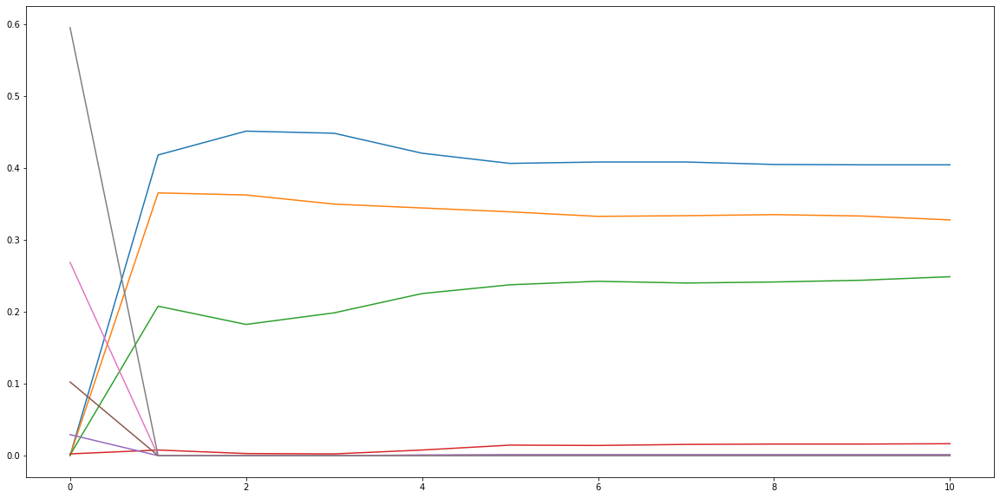

In [928]:
for i in range(8):
    t = [len(np.where(get_max_frequencies(tp) == i+1)[0])/2048 for tp in sailnet_rfhistory[0::10]]
    plt.plot(t)

In [861]:
t1 = np.where(get_max_frequencies(sailnet_rfhistory[50]) == 1)[0]
print(len(t1))
t2 = np.where(get_max_frequencies(sailnet_rfhistory[50]) == 2)[0]
print(len(t2))
t3 = np.where(get_max_frequencies(sailnet_rfhistory[50]) == 3)[0]
print(len(t3))
t4 = np.where(get_max_frequencies(sailnet_rfhistory[50]) == 4)[0]
print(len(t4))
t5 = np.where(get_max_frequencies(sailnet_rfhistory[50]) == 5)[0]
print(len(t5))
t6 = np.where(get_max_frequencies(sailnet_rfhistory[50]) == 6)[0]
print(len(t6))
t7 = np.where(get_max_frequencies(sailnet_rfhistory[50]) == 7)[0]
print(len(t7))
t8 = np.where(get_max_frequencies(sailnet_rfhistory[50]) == 8)[0]
print(len(t8))

833
695
487
30
3
0
0
0


In [865]:
t1 = np.where(get_max_frequencies(impca.inverse_transform(dodds_sailnet_rfhistory[10]),dims=80) == 1)[0]
print(len(t1))
t2 = np.where(get_max_frequencies(impca.inverse_transform(dodds_sailnet_rfhistory[10]),dims=80) == 2)[0]
print(len(t2))
t3 = np.where(get_max_frequencies(impca.inverse_transform(dodds_sailnet_rfhistory[10]),dims=80) == 3)[0]
print(len(t3))
t4 = np.where(get_max_frequencies(impca.inverse_transform(dodds_sailnet_rfhistory[10]),dims=80) == 4)[0]
print(len(t4))
t5 = np.where(get_max_frequencies(impca.inverse_transform(dodds_sailnet_rfhistory[10]),dims=80) == 5)[0]
print(len(t5))
t6 = np.where(get_max_frequencies(impca.inverse_transform(dodds_sailnet_rfhistory[10]),dims=80) == 6)[0]
print(len(t6))
t7 = np.where(get_max_frequencies(impca.inverse_transform(dodds_sailnet_rfhistory[10]),dims=80) == 7)[0]
print(len(t7))
t8 = np.where(get_max_frequencies(impca.inverse_transform(dodds_sailnet_rfhistory[10]),dims=80) == 8)[0]
print(len(t8))

463
273
197
57
30
4
0
0


In [883]:
t1 = np.where(get_max_frequencies(impca.inverse_transform(dodds10x100k_sailnet_rfhistory[10]),dims=80) == 1)[0]
print(len(t1))
t2 = np.where(get_max_frequencies(impca.inverse_transform(dodds10x100k_sailnet_rfhistory[10]),dims=80) == 2)[0]
print(len(t2))
t3 = np.where(get_max_frequencies(impca.inverse_transform(dodds10x100k_sailnet_rfhistory[10]),dims=80) == 3)[0]
print(len(t3))
t4 = np.where(get_max_frequencies(impca.inverse_transform(dodds10x100k_sailnet_rfhistory[10]),dims=80) == 4)[0]
print(len(t4))
t5 = np.where(get_max_frequencies(impca.inverse_transform(dodds10x100k_sailnet_rfhistory[10]),dims=80) == 5)[0]
print(len(t5))
t6 = np.where(get_max_frequencies(impca.inverse_transform(dodds10x100k_sailnet_rfhistory[10]),dims=80) == 6)[0]
print(len(t6))
t7 = np.where(get_max_frequencies(impca.inverse_transform(dodds10x100k_sailnet_rfhistory[10]),dims=80) == 7)[0]
print(len(t7))
t8 = np.where(get_max_frequencies(impca.inverse_transform(dodds10x100k_sailnet_rfhistory[10]),dims=80) == 8)[0]
print(len(t8))

968
564
333
98
58
21
5
1


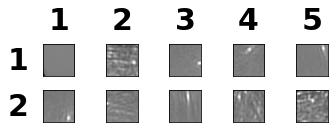

In [894]:
f = utils.display_patches(10,impca.inverse_transform(dodds10x100k_sailnet_rfhistory[-1][t5]),display=True,center=True, patch_dims=(80,80))

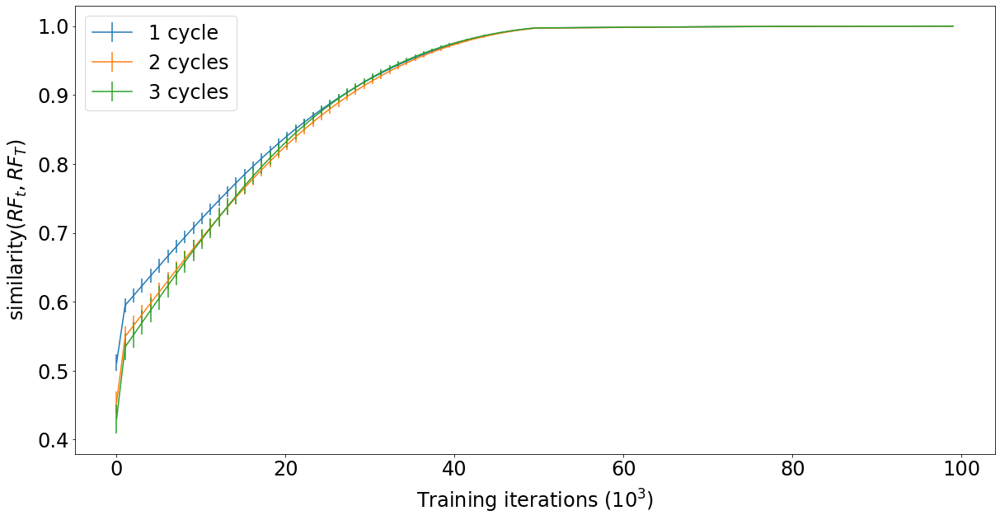

In [895]:
plot_mean_timecourse([impca.inverse_transform(timepoint) for timepoint in dodds10x100k_sailnet_rfhistory], 
                     [t1, t2, t3], 
                     ['1 cycle', '2 cycles', '3 cycles'], 
                     stepwise=False, 
                     ref_idx=-1)

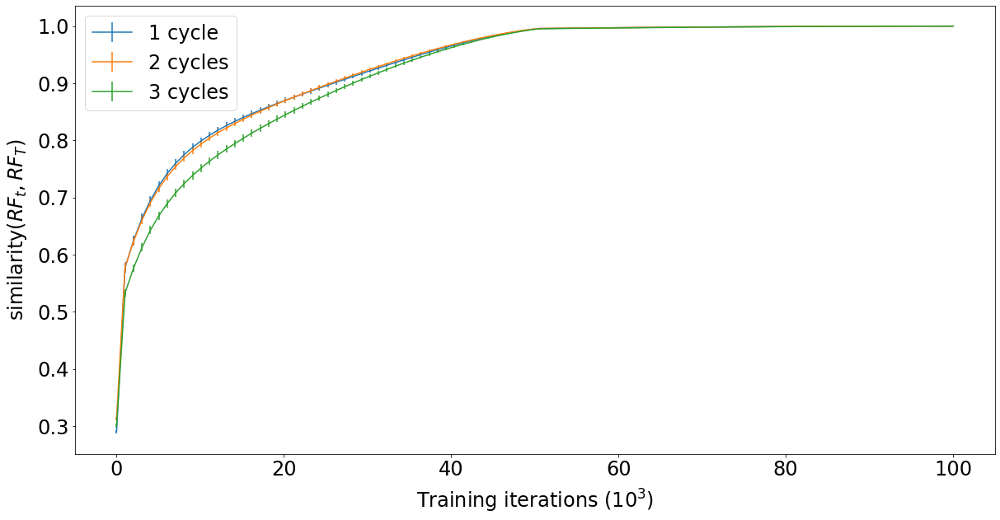

In [905]:
plot_mean_timecourse(sailnet_rfhistory2, 
                     [t1, t2, t3], 
                     ['1 cycle', '2 cycles', '3 cycles'], 
                     stepwise=False, 
                     ref_idx=-1)

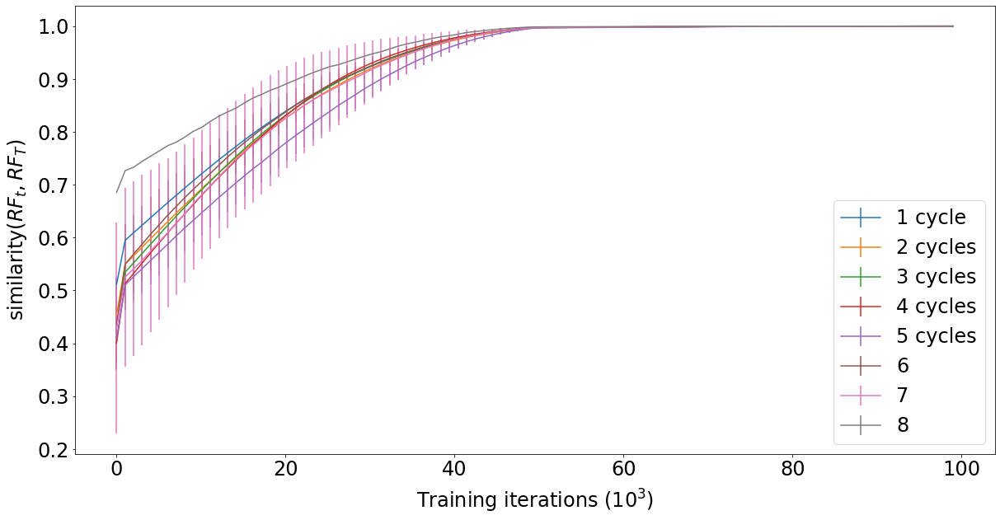

In [884]:
plot_mean_timecourse([impca.inverse_transform(timepoint) for timepoint in dodds10x100k_sailnet_rfhistory], 
                     [t1, t2, t3, t4, t5, t6, t7, t8], 
                     ['1 cycle', '2 cycles', '3 cycles', '4 cycles', '5 cycles', '6', '7', '8'], 
                     stepwise=False, 
                     ref_idx=-1)

In [1751]:
t1 = np.where(get_max_frequencies(sparsenet_rfhistory[-1]) == 1)[0]
t2 = np.where(get_max_frequencies(sparsenet_rfhistory[-1]) == 2)[0]
t3 = np.where(get_max_frequencies(sparsenet_rfhistory[-1]) == 3)[0]
t4 = np.where(get_max_frequencies(sparsenet_rfhistory[-1]) == 4)[0]
t5 = np.where(get_max_frequencies(sparsenet_rfhistory[-1]) == 5)[0]
t6 = np.where(get_max_frequencies(sparsenet_rfhistory[-1]) == 6)[0]
t7 = np.where(get_max_frequencies(sparsenet_rfhistory[-1]) == 7)[0]
t8 = np.where(get_max_frequencies(sparsenet_rfhistory[-1]) == 8)[0]
print(len(t1))
print(len(t2))
print(len(t3))
print(len(t4))
print(len(t5))
print(len(t6))
print(len(t7))
print(len(t8))

107
231
391
473
401
240
126
79


In [1470]:
t1 = np.where(get_max_frequencies(sailnet_rfhistory2[-1]) == 1)[0]
t2 = np.where(get_max_frequencies(sailnet_rfhistory2[-1]) == 2)[0]
t3 = np.where(get_max_frequencies(sailnet_rfhistory2[-1]) == 3)[0]
t4 = np.where(get_max_frequencies(sailnet_rfhistory2[-1]) == 4)[0]
t5 = np.where(get_max_frequencies(sailnet_rfhistory2[-1]) == 5)[0]
print(len(t5))
t6 = np.where(get_max_frequencies(sailnet_rfhistory2[-1]) == 6)[0]
print(len(t6))


2
0


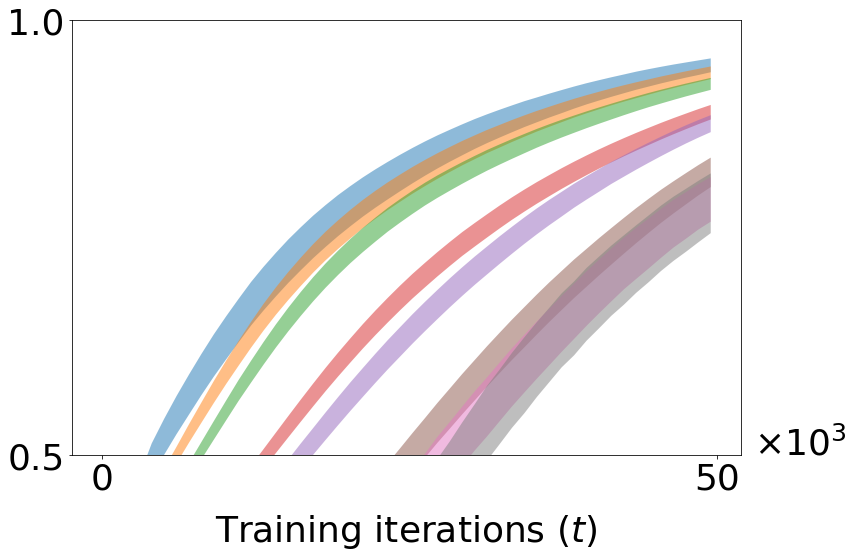

In [1752]:
plot_mean_timecourse(sparsenet_rfhistory, 
                     [t1, t2, t3, t4, t5, t6, t7, t8], 
                     ['1 cycle', '2 cycles', '3 cycles', '4 cycles', '5 cycles', '6 cycles', '7 cycles', '8 cycles'], 
                     stepwise=False, 
                     ref_idx=-1)

# MISC

### 3) Sort into classes

In [39]:
goodidxs,goodparams = generate_good_samples(lca_gabor_params,r2s,1024,50,(1.5,14.5))

651
651


In [40]:
goodrfs = lca_model.Q[goodidxs]

#### Look for small cutoff

In [41]:
np.shape(np.array(lca_model.Qhistory))

(101, 2048, 256)

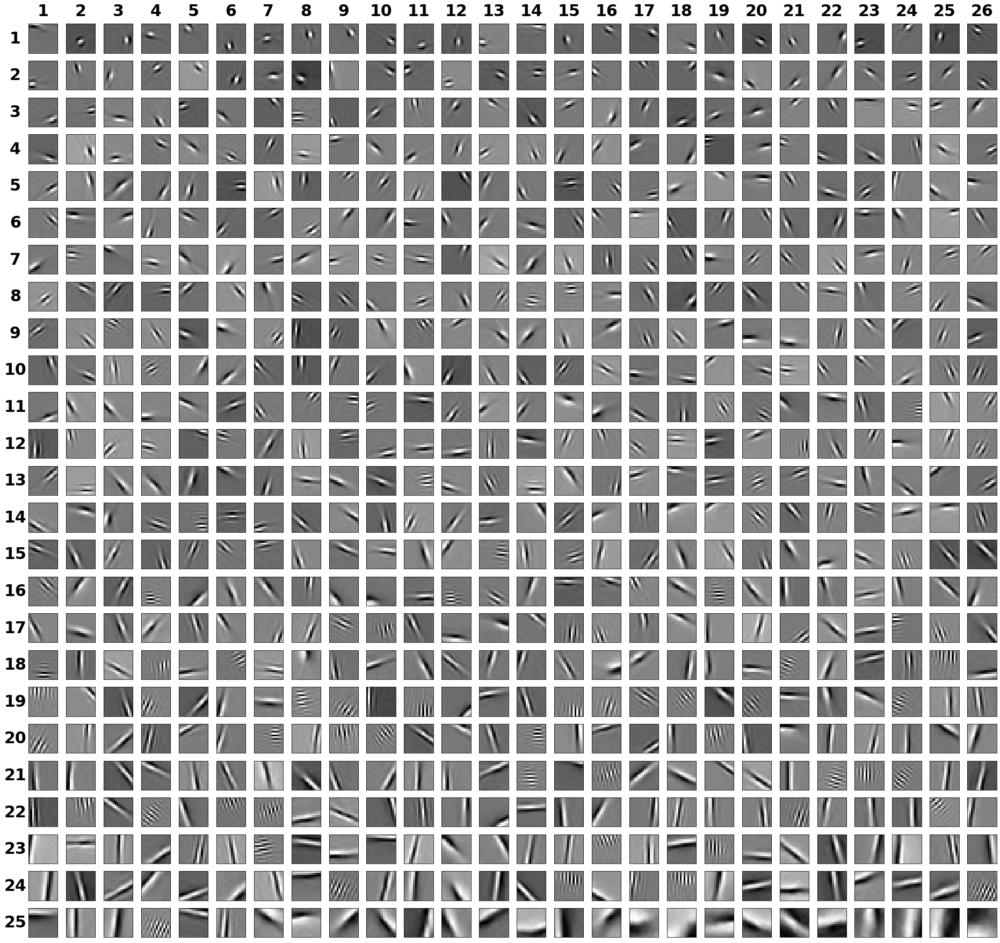

In [42]:
a = utils.display_patches(650,
                          goodrfs[sort_by_param(goodparams,param_str='sigmaarea')],
                          display=True)

In [43]:
testsmall = sort_by_param(goodparams,param_str='sigmaarea')[:41]

In [44]:
np.max(get_param(goodparams[testsmall],param_str='sigmaarea'))

2.360364753570238

#### Get all but small RFs

In [45]:
notsmall = list(set(range(651))-set(testsmall))

In [46]:
nosmallrfs = goodrfs[notsmall]
nosmallparams = goodparams[notsmall]

In [47]:
len(nosmallrfs)

610

#### Look for high frequency cutoff

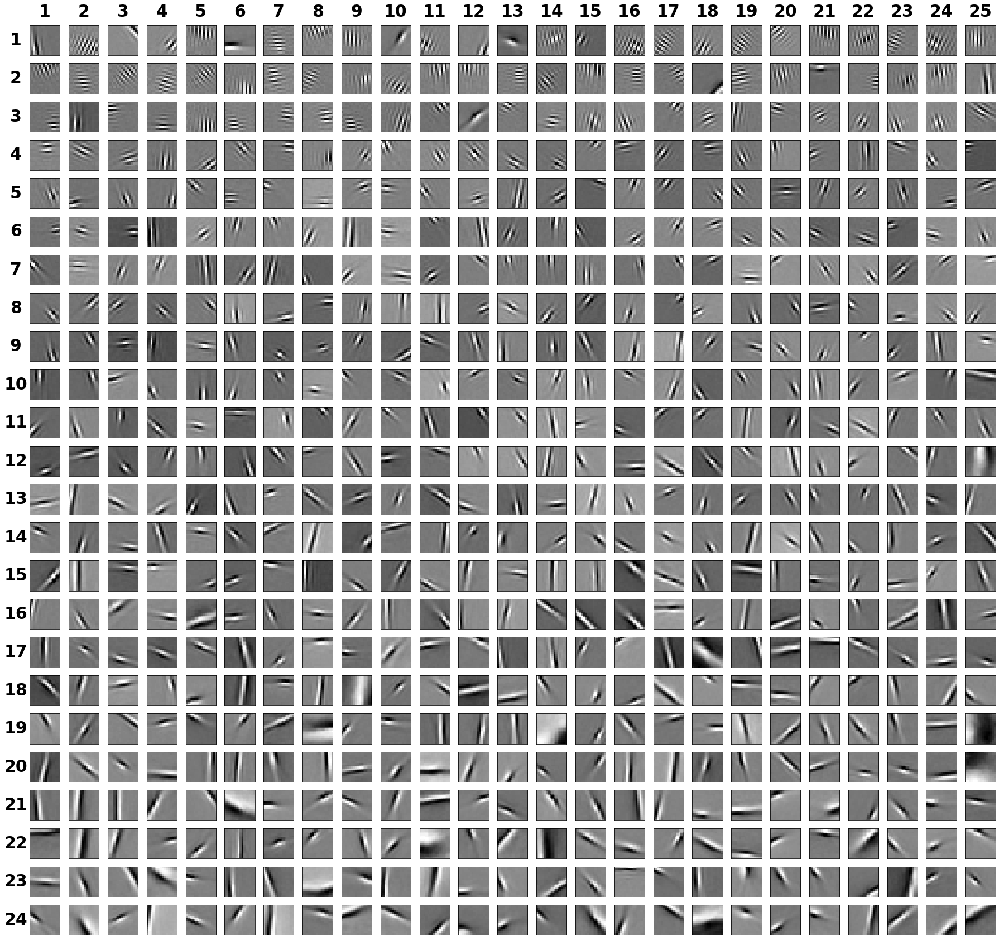

In [2356]:
a = utils.display_patches(600,
                          nosmallrfs[sort_by_param(nosmallparams,param_str='orientedcycles')[::-1]],
                          display=True)

In [48]:
testhighfreq = list(sort_by_param(nosmallparams,param_str='orientedcycles')[::-1][:96])

In [49]:
fakehighfreq = [0,2,5,9,12,42,45,49,61]
for index in sorted(fakehighfreq, reverse=True):
    del testhighfreq[index]

#### Get all but small/high freq RFs

In [50]:
nothighfreq = list(set(range(len(notsmall)))-set(testhighfreq))

In [51]:
nohighfreqrfs = nosmallrfs[nothighfreq]
nohighfreqparams = nosmallparams[nothighfreq]

In [52]:
len(nohighfreqrfs)

523

#### Get edges and gabors

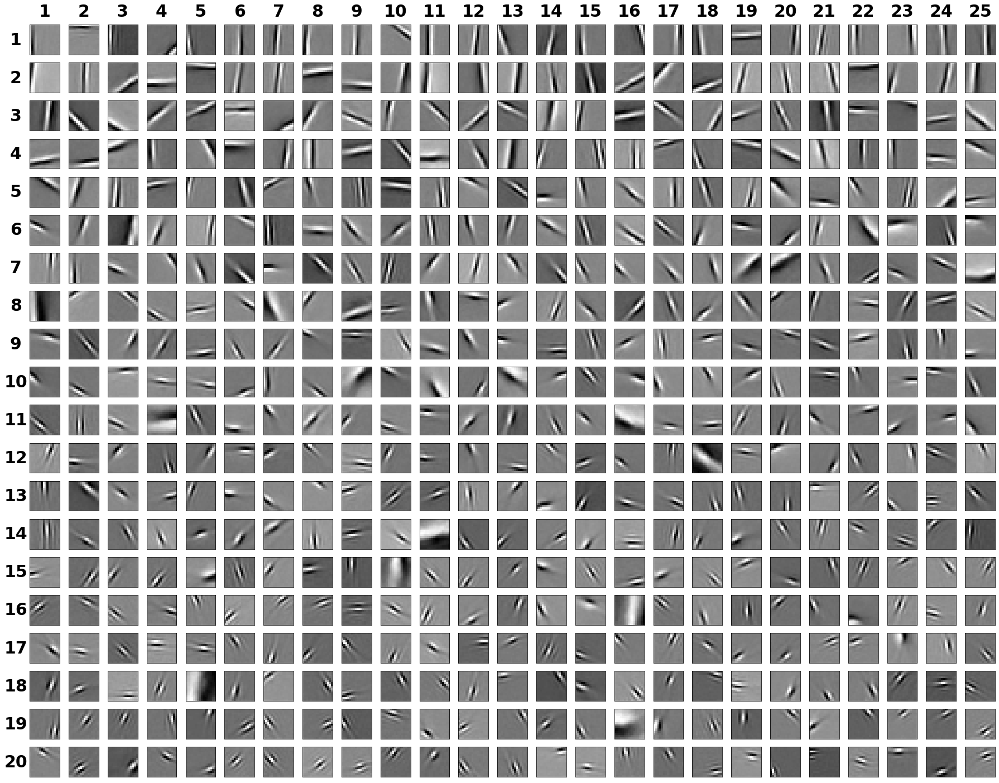

In [2370]:
a = utils.display_patches(500, 
                          nohighfreqrfs[sort_by_param(nohighfreqparams,param_str='orientationratio')],
                          display=True)

In [53]:
testedges = list(sort_by_param(nohighfreqparams,param_str='orientationratio')[:107])
testgabors = list(sort_by_param(nohighfreqparams,param_str='orientationratio')[-300:])

#### Get center surrounds

In [54]:
areaall = sort_by_param(lca_gabor_params, param_str='sigmaarea')

In [685]:
cs = np.concatenate(((np.array([6,12,16])-1),
(np.array([1,4,14,18,19,20])-1+20),
(np.array([11,12,16,17,19])-1+40),
(np.array([1,2,5,6,7,8,10])-1+60),
(np.array([1,9,19,20])-1+80),
(np.array([2,3,14,18,20])-1+100),
(np.array([2,3,7,8,14])-1+120),
(np.array([3,11,18])-1+140),


(np.array([3,4,13,120])-1+200)))

#### Collect indices

In [55]:
manualsmall = goodidxs[testsmall]
manualhighfreq = goodidxs[notsmall][testhighfreq]
manualedges = goodidxs[notsmall][nothighfreq][testedges]
manualgabors = goodidxs[notsmall][nothighfreq][testgabors]
# manualcs = areaall[cs]

In [49]:
np.savez('sparsenetFISTA100ksmallarea',manualsmall)
np.savez('sparsenetFISTA100khighfreq',manualhighfreq)
np.savez('sparsenetFISTA100kedges',manualedges)
np.savez('sparsenetFISTA100kgabors',manualgabors)

### 4) Inspect parameter distributions

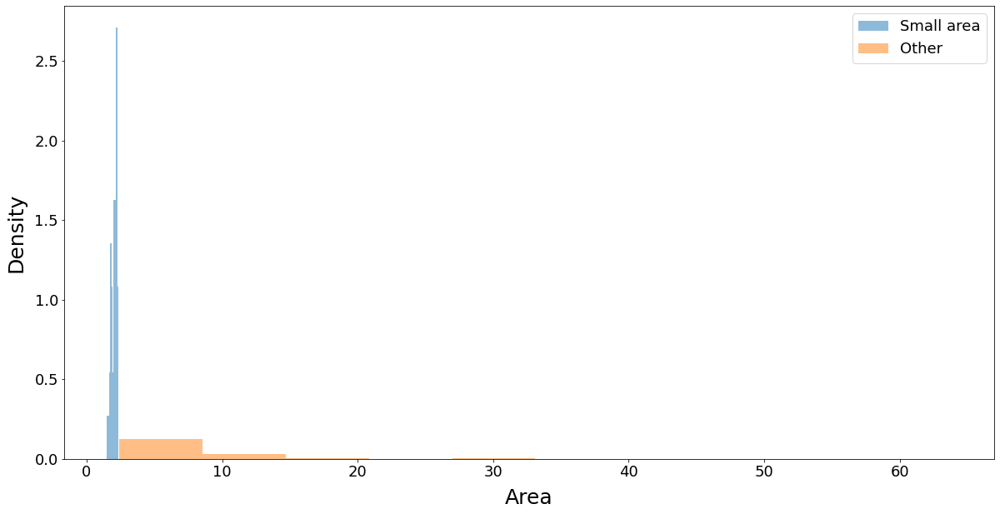

In [56]:
# plt.hist(get_param(lca_gabor_params,param_str="sigmaarea")[manualedges],alpha=0.5, density=True)
# plt.hist(get_param(lca_gabor_params,param_str="sigmaarea")[manualgabors],alpha=0.5, density=True)
plt.hist(get_param(lca_gabor_params,param_str="sigmaarea")[manualsmall],alpha=0.5, density=True, label='Small area')
plt.hist(get_param(lca_gabor_params,param_str="sigmaarea")[np.concatenate((manualedges,manualgabors,manualhighfreq))],alpha=0.5, density=True, label='Other')
# plt.hist(get_param(lca_gabor_params,param_str="sigmaarea")[manualhighfreq],alpha=0.2, density=True)
plt.legend(fontsize=18)
plt.xticks(fontsize=18)
plt.xlabel('Area', fontsize=25, labelpad=10)
plt.yticks(fontsize=18)
plt.ylabel('Density', fontsize=25, labelpad=10)
plt.legend(fontsize=18)

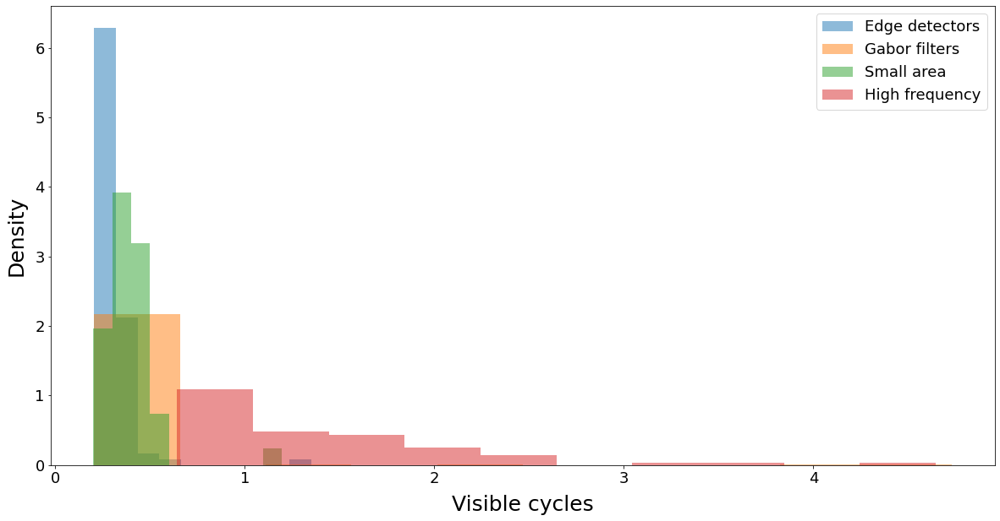

In [57]:
plt.hist(get_param(lca_gabor_params,param_str="orientedcycles")[manualedges],alpha=0.5, density=True, label="Edge detectors")
# plt.hist(get_param(lca_gabor_params,param_str="orientedcycles")[np.concatenate((manualedges,manualgabors,manualsmall))],alpha=0.5, density=True, label="Other")

plt.hist(get_param(lca_gabor_params,param_str="orientedcycles")[manualgabors],alpha=0.5, density=True, label="Gabor filters")
plt.hist(get_param(lca_gabor_params,param_str="orientedcycles")[manualsmall],alpha=0.5, density=True, label="Small area")
plt.hist(get_param(lca_gabor_params,param_str="orientedcycles")[manualhighfreq],alpha=0.5, density=True, label="High frequency")
plt.legend(fontsize=18)
plt.xticks(fontsize=18)
plt.xlabel('Visible cycles', fontsize=25, labelpad=10)
plt.yticks(fontsize=18)
plt.ylabel('Density', fontsize=25, labelpad=10)
plt.legend(fontsize=18)

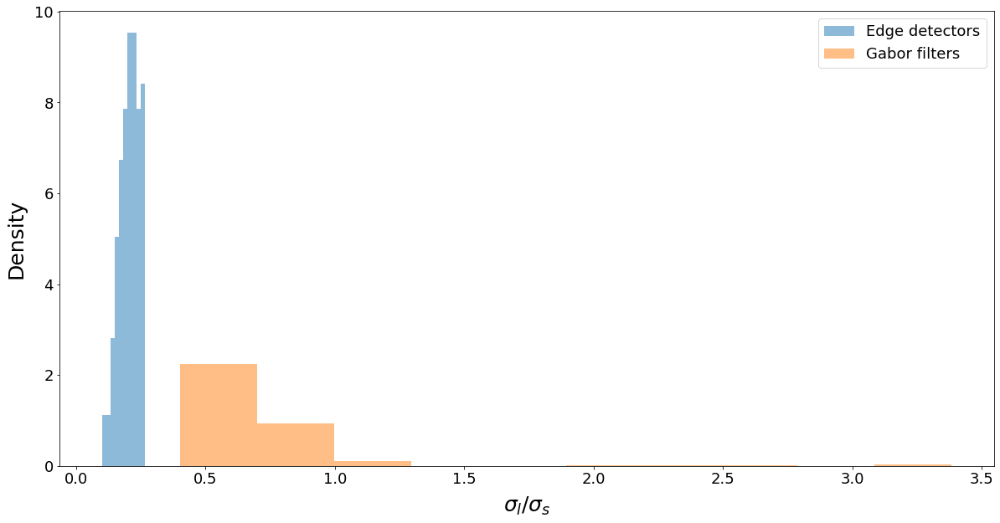

In [58]:
plt.hist(get_param(lca_gabor_params,param_str="orientationratio")[manualedges],alpha=0.5, density=True, label='Edge detectors')
plt.hist(get_param(lca_gabor_params,param_str="orientationratio")[manualgabors],alpha=0.5, density=True, label='Gabor filters')
# plt.hist(get_param(lca_gabor_params,param_str="orientationratio")[manualsmall],alpha=0.5, density=True)
# plt.hist(get_param(lca_gabor_params,param_str="orientationratio")[manualhighfreq],alpha=0.2, density=True)
plt.legend(fontsize=18)
plt.xticks(fontsize=18)
plt.xlabel('$\sigma_l/\sigma_s$', fontsize=25, labelpad=10)
plt.yticks(fontsize=18)
plt.ylabel('Density', fontsize=25, labelpad=10)
plt.legend(fontsize=18)

### 5) Plot timecourses

#### Get timecourses

In [59]:
smallmean, smallstderr = get_mean_timecourse(Qfinaloverlaphistory, idxs=manualsmall)
    
highfreqmean, highfreqstderr = get_mean_timecourse(Qfinaloverlaphistory, idxs=manualhighfreq)
    
edgesmean, edgesstderr = get_mean_timecourse(Qfinaloverlaphistory, idxs=manualedges)
    
gaborsmean, gaborsstderr = get_mean_timecourse(Qfinaloverlaphistory, idxs=manualgabors)

# csmean, csstderr = get_mean_timecourse(Qfinaloverlaphistory,idxs=manualcs)

In [2551]:
smallmean, smallstderr = get_mean_timecourse(dQhistory, idxs=manualsmall)
    
highfreqmean, highfreqstderr = get_mean_timecourse(dQhistory, idxs=manualhighfreq)
    
edgesmean, edgesstderr = get_mean_timecourse(dQhistory, idxs=manualedges)
    
gaborsmean, gaborsstderr = get_mean_timecourse(dQhistory, idxs=manualgabors)

# csmean, csstderr = get_mean_timecourse(Qfinaloverlaphistory,idxs=manualcs)

In [2547]:
smallmean, smallstderr = get_mean_timecourse(dQfinalhistory, idxs=manualsmall)
    
highfreqmean, highfreqstderr = get_mean_timecourse(dQfinalhistory, idxs=manualhighfreq)
    
edgesmean, edgesstderr = get_mean_timecourse(dQfinalhistory, idxs=manualedges)
    
gaborsmean, gaborsstderr = get_mean_timecourse(dQfinalhistory, idxs=manualgabors)

# csmean, csstderr = get_mean_timecourse(Qfinaloverlaphistory,idxs=manualcs)

#### Plot timecourses

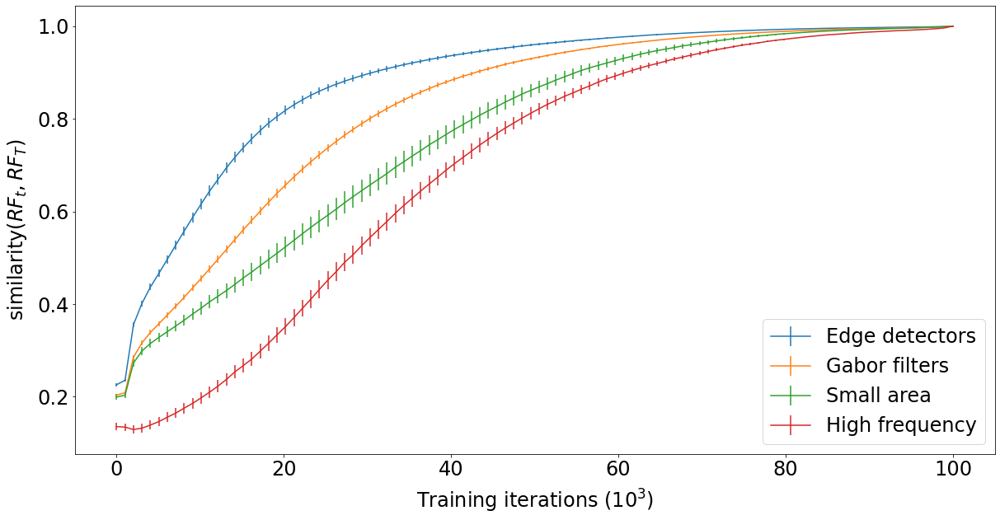

In [60]:
# f=plot_mean_timecourse([edgesmean, gaborsmean, smallmean, highfreqmean, csmean],
#                          [edgesstderr, gaborsstderr, smallstderr, highfreqstderr, csstderr],
#                          ['Edge detectors', 'Gabor filters', 'Small area', 'High frequency', 'Center/surround (manual)'])

f=plot_mean_timecourse([edgesmean, gaborsmean, smallmean, highfreqmean],
                         [edgesstderr, gaborsstderr, smallstderr, highfreqstderr],
                         ['Edge detectors', 'Gabor filters', 'Small area', 'High frequency'])

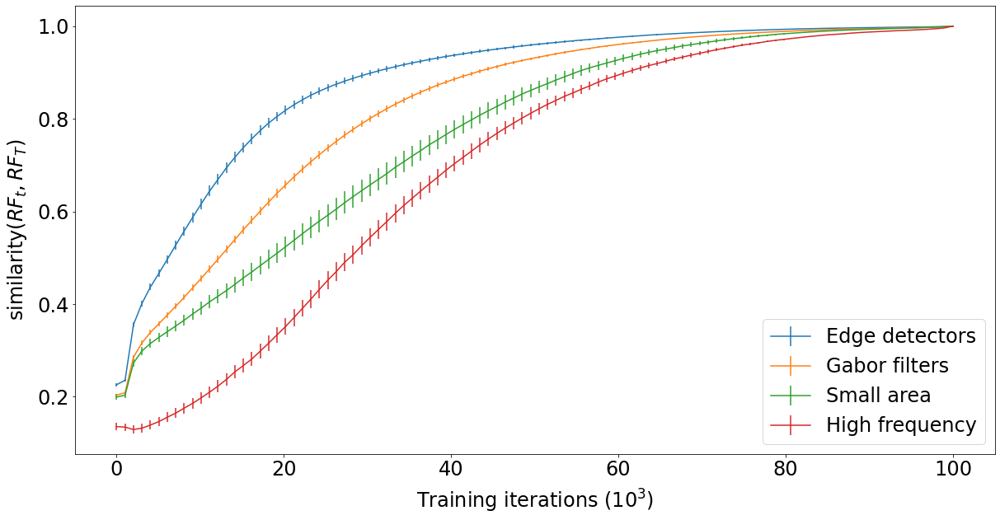

In [2550]:
# f=plot_mean_timecourse([edgesmean, gaborsmean, smallmean, highfreqmean, csmean],
#                          [edgesstderr, gaborsstderr, smallstderr, highfreqstderr, csstderr],
#                          ['Edge detectors', 'Gabor filters', 'Small area', 'High frequency', 'Center/surround (manual)'])

f=plot_mean_timecourse([edgesmean, gaborsmean, smallmean, highfreqmean],
                         [edgesstderr, gaborsstderr, smallstderr, highfreqstderr],
                         ['Edge detectors', 'Gabor filters', 'Small area', 'High frequency'])

#### Check for level of random errors

In [62]:
allrfs = np.concatenate((manualsmall,manualhighfreq,manualedges,manualgabors))

In [63]:
np.random.shuffle(allrfs)

In [64]:
rg1 = allrfs[::4]
rg2 = allrfs[1::4]
rg3 = allrfs[2::4]
rg4 = allrfs[3::4]

In [65]:
rg1mean, rg1stderr = get_mean_timecourse(Qfinaloverlaphistory, idxs=rg1)
    
rg2mean, rg2stderr = get_mean_timecourse(Qfinaloverlaphistory, idxs=rg2)
    
rg3mean, rg3stderr = get_mean_timecourse(Qfinaloverlaphistory, idxs=rg3)
    
rg4mean, rg4stderr = get_mean_timecourse(Qfinaloverlaphistory, idxs=rg4)

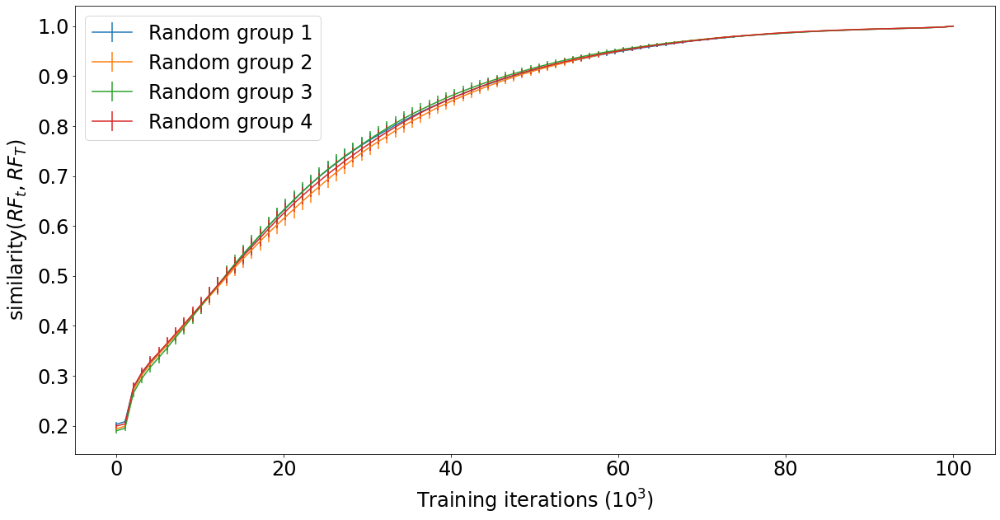

In [66]:
f=plot_mean_timecourse([rg1mean, rg2mean, rg3mean, rg4mean],
                         [rg1stderr, rg2stderr, rg3stderr, rg4stderr],
                         ['Random group 1', 'Random group 2', 'Random group 3', 'Random group 4'])

### 6) Control for size/frequency confounds

#### Pearson's r between size/frequency

In [67]:
scipy.stats.pearsonr(get_param(lca_gabor_params[allrfs],param_str='sigmaarea'), get_param(lca_gabor_params[allrfs], param_str='orientedcycles'))

(0.028148990302619685, 0.5158899592312612)

#### Split into frequency bins

In [68]:
sort_all_by_freq = sort_by_param(lca_gabor_params[allrfs], param_str='orientedcycles')

In [69]:
len(sort_all_by_freq)

535

In [70]:
freq0,freq1,freq2,freq3,freq4,_ = np.split(allrfs[sort_all_by_freq],[105,210,315,420,525])

(array([35., 19.,  7.,  9.,  9.,  9.,  6.,  2.,  5.,  4.]),
 array([0.57721943, 0.75238395, 0.92754847, 1.102713  , 1.27787752,
        1.45304204, 1.62820656, 1.80337108, 1.9785356 , 2.15370012,
        2.32886465]),
 <BarContainer object of 10 artists>)

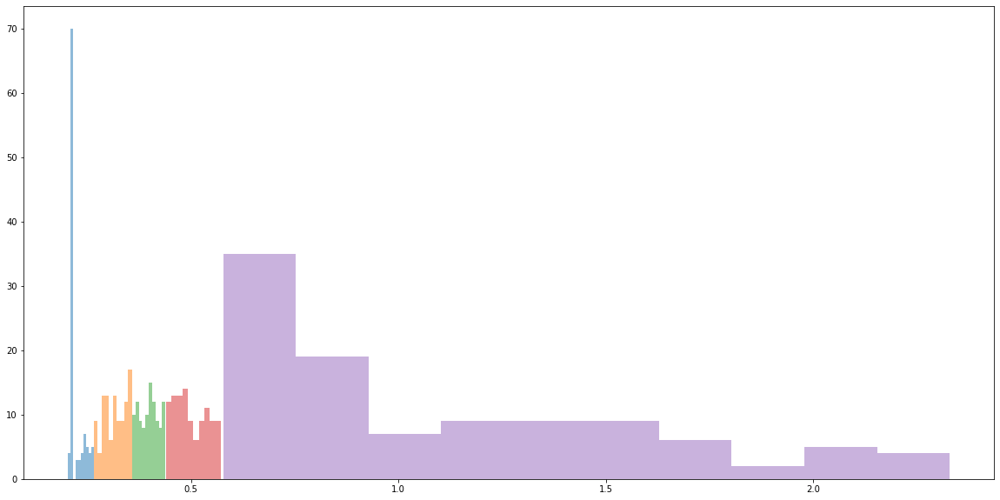

In [71]:
plt.hist(get_param(lca_gabor_params[freq0],param_str='orientedcycles'),alpha=0.5)
plt.hist(get_param(lca_gabor_params[freq1],param_str='orientedcycles'),alpha=0.5)
plt.hist(get_param(lca_gabor_params[freq2],param_str='orientedcycles'),alpha=0.5)
plt.hist(get_param(lca_gabor_params[freq3],param_str='orientedcycles'),alpha=0.5)
plt.hist(get_param(lca_gabor_params[freq4],param_str='orientedcycles'),alpha=0.5)

In [83]:
freq0s, freq0m, freq0l = classify_sample_by_param(lca_gabor_params,freq0)
freq1s, freq1m, freq1l = classify_sample_by_param(lca_gabor_params,freq1)
freq2s, freq2m, freq2l = classify_sample_by_param(lca_gabor_params,freq2)
freq3s, freq3m, freq3l = classify_sample_by_param(lca_gabor_params,freq3)
freq4s, freq4m, freq4l = classify_sample_by_param(lca_gabor_params,freq4)
# freq5s, freq5m, freq5l = classify_sample_by_param(lca_gabor_params,freq5[:-1])

In [84]:
freq0smean, freq0sstderr = get_mean_timecourse(Qfinaloverlaphistory, idxs=freq0s)
    
freq0mmean, freq0mstderr = get_mean_timecourse(Qfinaloverlaphistory, idxs=freq0m)
    
freq0lmean, freq0lstderr = get_mean_timecourse(Qfinaloverlaphistory, idxs=freq0l)

freq1smean, freq1sstderr = get_mean_timecourse(Qfinaloverlaphistory, idxs=freq1s)
    
freq1mmean, freq1mstderr = get_mean_timecourse(Qfinaloverlaphistory, idxs=freq1m)
    
freq1lmean, freq1lstderr = get_mean_timecourse(Qfinaloverlaphistory, idxs=freq1l)

freq2smean, freq2sstderr = get_mean_timecourse(Qfinaloverlaphistory, idxs=freq2s)
    
freq2mmean, freq2mstderr = get_mean_timecourse(Qfinaloverlaphistory, idxs=freq2m)
    
freq2lmean, freq2lstderr = get_mean_timecourse(Qfinaloverlaphistory, idxs=freq2l)

freq3smean, freq3sstderr = get_mean_timecourse(Qfinaloverlaphistory, idxs=freq3s)
    
freq3mmean, freq3mstderr = get_mean_timecourse(Qfinaloverlaphistory, idxs=freq3m)
    
freq3lmean, freq3lstderr = get_mean_timecourse(Qfinaloverlaphistory, idxs=freq3l)

freq4smean, freq4sstderr = get_mean_timecourse(Qfinaloverlaphistory, idxs=freq4s)
    
freq4mmean, freq4mstderr = get_mean_timecourse(Qfinaloverlaphistory, idxs=freq4m)
    
freq4lmean, freq4lstderr = get_mean_timecourse(Qfinaloverlaphistory, idxs=freq4l)

# freq5smean, freq5sstderr = get_mean_timecourse(Qfinaloverlaphistory, idxs=freq5s)
    
# freq5mmean, freq5mstderr = get_mean_timecourse(Qfinaloverlaphistory, idxs=freq5m)
    
# freq5lmean, freq5lstderr = get_mean_timecourse(Qfinaloverlaphistory, idxs=freq5l)

Text(0.5, 0.98, 'Frequency bin 1')

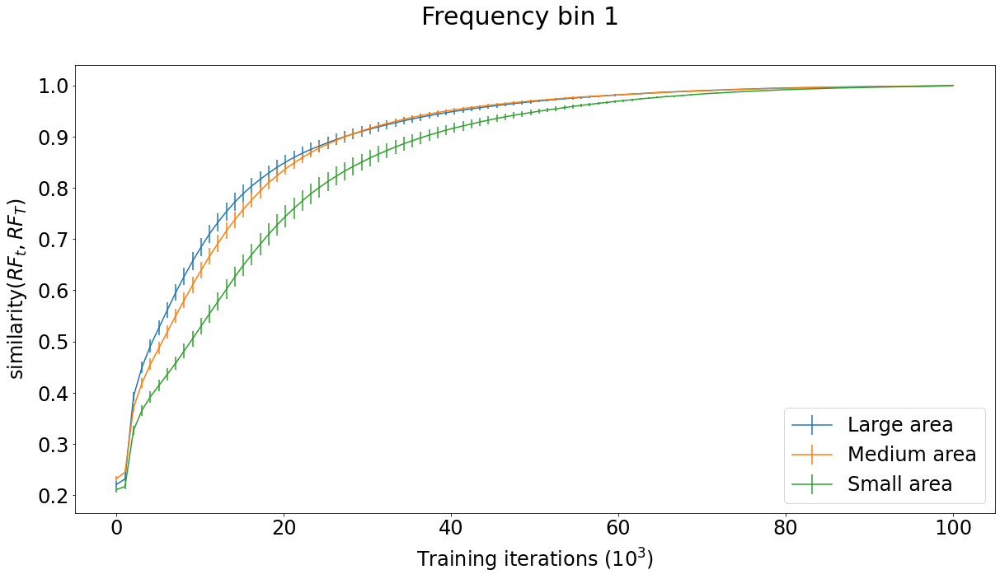

In [85]:
f=plot_mean_timecourse((freq0lmean,freq0mmean,freq0smean),(freq0lstderr,freq0mstderr,freq0sstderr),('Large area', 'Medium area', 'Small area'))
f.suptitle('Frequency bin 1',fontsize=30)

(array([ 6., 21.,  0.,  0.,  1.,  1.,  1.,  2.,  0.,  3.]),
 array([0.20540453, 0.21139558, 0.21738663, 0.22337768, 0.22936873,
        0.23535978, 0.24135083, 0.24734188, 0.25333294, 0.25932399,
        0.26531504]),
 <BarContainer object of 10 artists>)

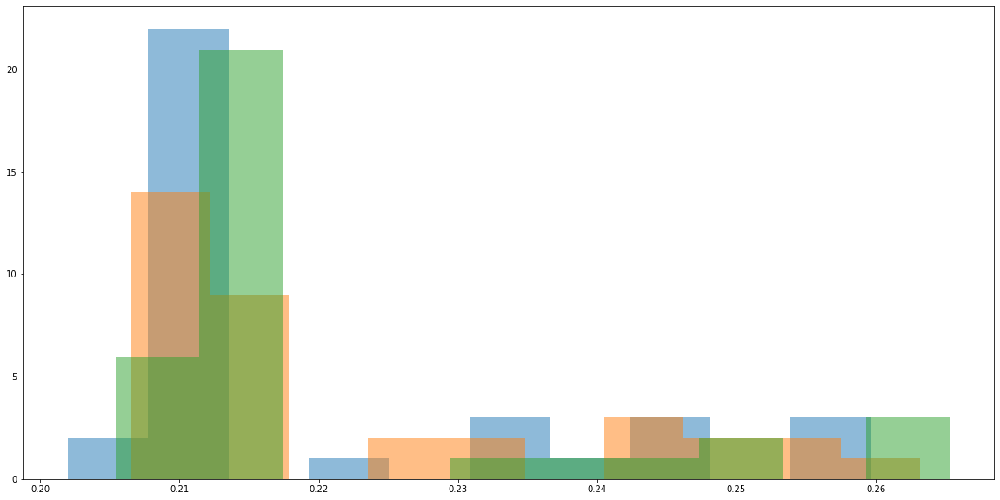

In [86]:
plt.hist(get_param(lca_gabor_params[freq0s],param_str='orientedcycles'),alpha=0.5)
plt.hist(get_param(lca_gabor_params[freq0m],param_str='orientedcycles'),alpha=0.5)
plt.hist(get_param(lca_gabor_params[freq0l],param_str='orientedcycles'),alpha=0.5)

Text(0.5, 0.98, 'Frequency bin 2')

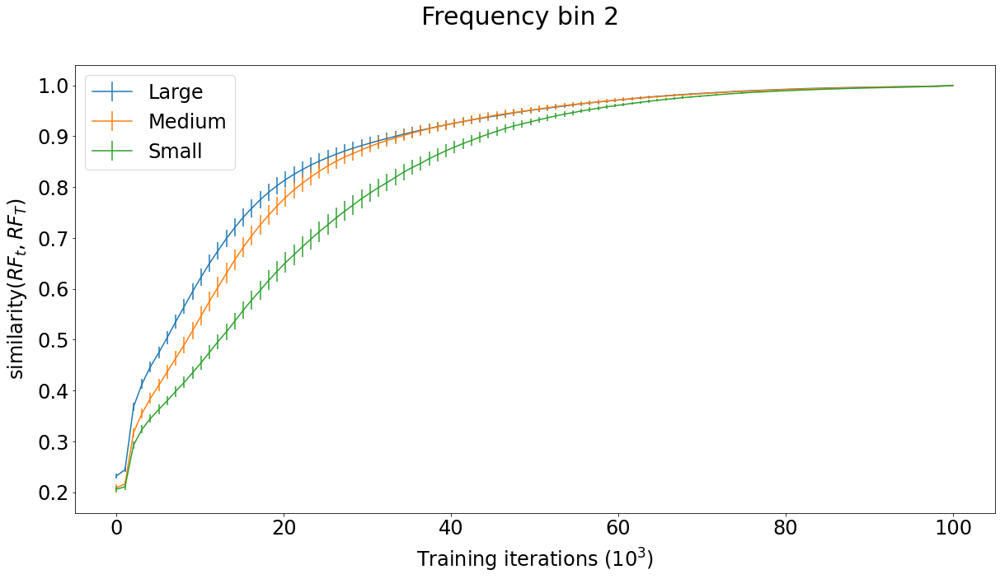

In [87]:
f=plot_mean_timecourse((freq1lmean,freq1mmean,freq1smean),(freq1lstderr,freq1mstderr,freq1sstderr),('Large', 'Medium', 'Small') )
f.suptitle('Frequency bin 2',fontsize=30)

(array([4., 0., 6., 7., 1., 6., 3., 2., 2., 4.]),
 array([0.26610795, 0.27513103, 0.28415411, 0.29317719, 0.30220026,
        0.31122334, 0.32024642, 0.3292695 , 0.33829257, 0.34731565,
        0.35633873]),
 <BarContainer object of 10 artists>)

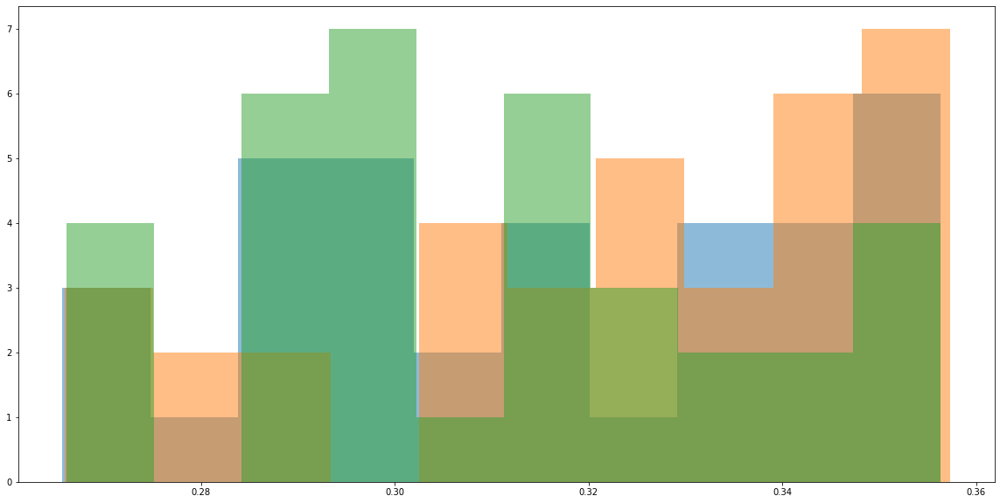

In [88]:
plt.hist(get_param(lca_gabor_params[freq1s],param_str='orientedcycles'),alpha=0.5)
plt.hist(get_param(lca_gabor_params[freq1m],param_str='orientedcycles'),alpha=0.5)
plt.hist(get_param(lca_gabor_params[freq1l],param_str='orientedcycles'),alpha=0.5)

Text(0.5, 0.98, 'Frequency bin 3')

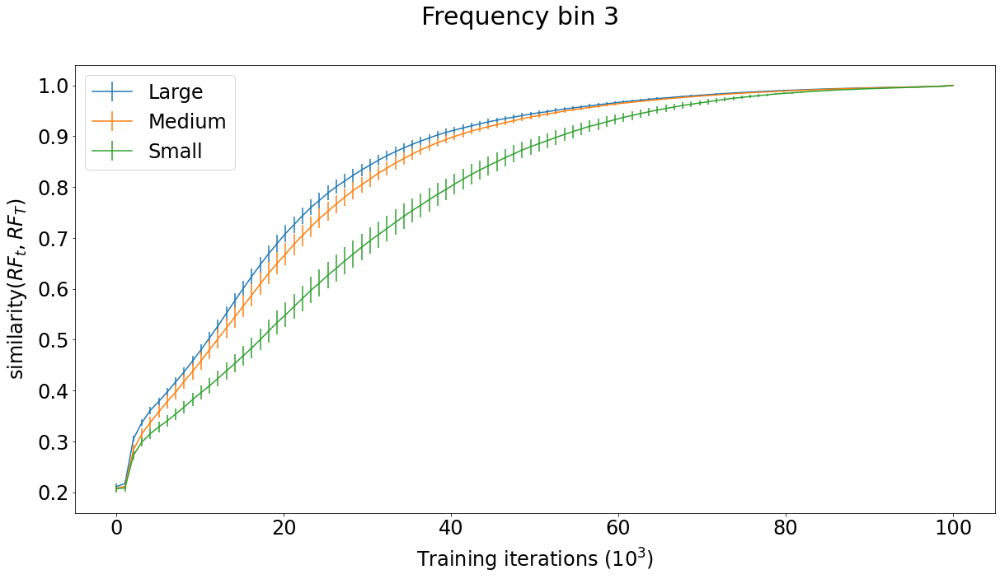

In [89]:
f=plot_mean_timecourse((freq2lmean,freq2mmean,freq2smean),(freq2lstderr,freq2mstderr,freq2sstderr),('Large', 'Medium', 'Small'))
f.suptitle('Frequency bin 3',fontsize=30)

Text(0.5, 0.98, 'Frequency bin 4')

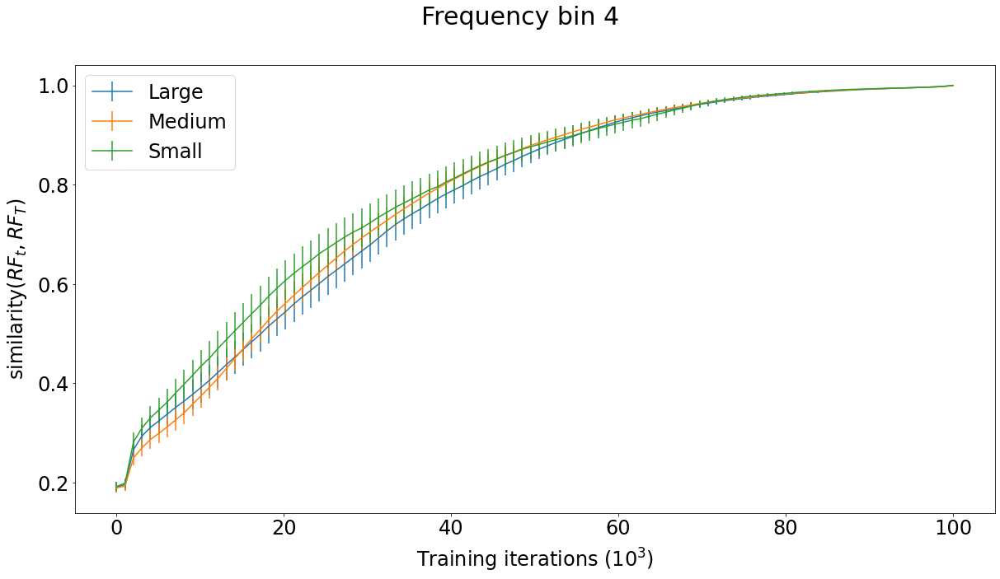

In [81]:
f=plot_mean_timecourse((freq3lmean,freq3mmean,freq3smean),(freq3lstderr,freq3mstderr,freq3sstderr),('Large', 'Medium', 'Small') )
f.suptitle('Frequency bin 4',fontsize=30)

Text(0.5, 0.98, 'Frequency bin 5')

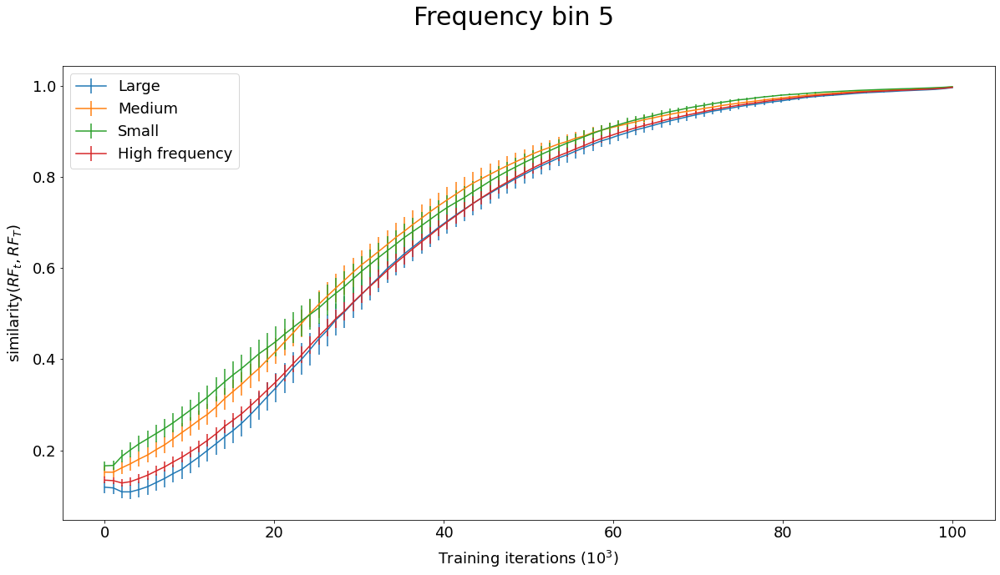

In [2309]:
f=plot_mean_timecourse((freq4lmean,freq4mmean,freq4smean),(freq4lstderr,freq4mstderr,freq4sstderr),('Large', 'Medium', 'Small') )
f.suptitle('Frequency bin 5',fontsize=30)

#### Split into size bins

In [53]:
sort_all_by_area = sort_by_param(lca_gabor_params[allrfs], param_str='sigmaarea')

In [54]:
area0,area1,area2,area3,area4,_ = np.split(allrfs[sort_all_by_area],[105,210,315,420,525])

(array([41., 34., 18.,  8.,  2.,  0.,  0.,  0.,  1.,  1.]),
 array([ 8.88115411, 10.75224977, 12.62334542, 14.49444108, 16.36553673,
        18.23663238, 20.10772804, 21.97882369, 23.84991935, 25.721015  ,
        27.59211065]),
 <BarContainer object of 10 artists>)

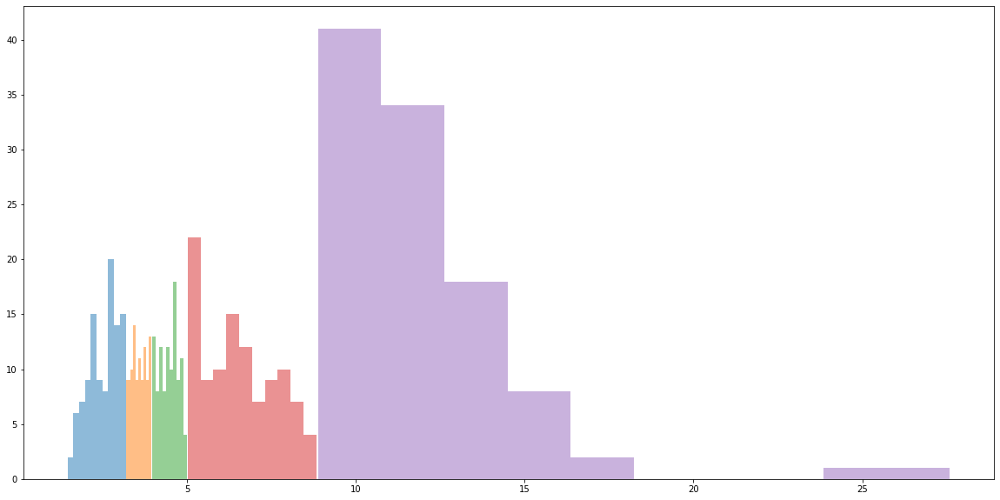

In [55]:
plt.hist(get_param(lca_gabor_params[area0],param_str='sigmaarea'),alpha=0.5)
plt.hist(get_param(lca_gabor_params[area1],param_str='sigmaarea'),alpha=0.5)
plt.hist(get_param(lca_gabor_params[area2],param_str='sigmaarea'),alpha=0.5)
plt.hist(get_param(lca_gabor_params[area3],param_str='sigmaarea'),alpha=0.5)
plt.hist(get_param(lca_gabor_params[area4],param_str='sigmaarea'),alpha=0.5)
# plt.hist(get_param(lca_gabor_params[freq4],param_str='orientedcycles'),alpha=0.5)

In [60]:
area0s, area0m, area0l = classify_sample_by_param(lca_gabor_params,idxs=area0,param_str='orientedcycles')
area1s, area1m, area1l = classify_sample_by_param(lca_gabor_params,idxs=area1,param_str='orientedcycles')
area2s, area2m, area2l = classify_sample_by_param(lca_gabor_params,idxs=area2,param_str='orientedcycles')
area3s, area3m, area3l = classify_sample_by_param(lca_gabor_params,idxs=area3,param_str='orientedcycles')
area4s, area4m, area4l = classify_sample_by_param(lca_gabor_params,idxs=area4,param_str='orientedcycles')
# freq5s, freq5m, freq5l = classify_sample_by_param(lca_gabor_params,freq5[:-1])

In [61]:
area0smean, area0sstderr = get_mean_timecourse(Qfinaloverlaphistory, idxs=area0s)   
area0mmean, area0mstderr = get_mean_timecourse(Qfinaloverlaphistory, idxs=area0m)    
area0lmean, area0lstderr = get_mean_timecourse(Qfinaloverlaphistory, idxs=area0l)
area1smean, area1sstderr = get_mean_timecourse(Qfinaloverlaphistory, idxs=area1s)    
area1mmean, area1mstderr = get_mean_timecourse(Qfinaloverlaphistory, idxs=area1m)    
area1lmean, area1lstderr = get_mean_timecourse(Qfinaloverlaphistory, idxs=area1l)
area2smean, area2sstderr = get_mean_timecourse(Qfinaloverlaphistory, idxs=area2s)    
area2mmean, area2mstderr = get_mean_timecourse(Qfinaloverlaphistory, idxs=area2m)    
area2lmean, area2lstderr = get_mean_timecourse(Qfinaloverlaphistory, idxs=area2l)
area3smean, area3sstderr = get_mean_timecourse(Qfinaloverlaphistory, idxs=area3s)    
area3mmean, area3mstderr = get_mean_timecourse(Qfinaloverlaphistory, idxs=area3m)    
area3lmean, area3lstderr = get_mean_timecourse(Qfinaloverlaphistory, idxs=area3l)
area4smean, area4sstderr = get_mean_timecourse(Qfinaloverlaphistory, idxs=area4s)    
area4mmean, area4mstderr = get_mean_timecourse(Qfinaloverlaphistory, idxs=area4m)    
area4lmean, area4lstderr = get_mean_timecourse(Qfinaloverlaphistory, idxs=area4l)

# freq5smean, freq5sstderr = get_mean_timecourse(Qfinaloverlaphistory, idxs=freq5s)
    
# freq5mmean, freq5mstderr = get_mean_timecourse(Qfinaloverlaphistory, idxs=freq5m)
    
# freq5lmean, freq5lstderr = get_mean_timecourse(Qfinaloverlaphistory, idxs=freq5l)

Text(0.5, 0.98, 'Area bin 1')

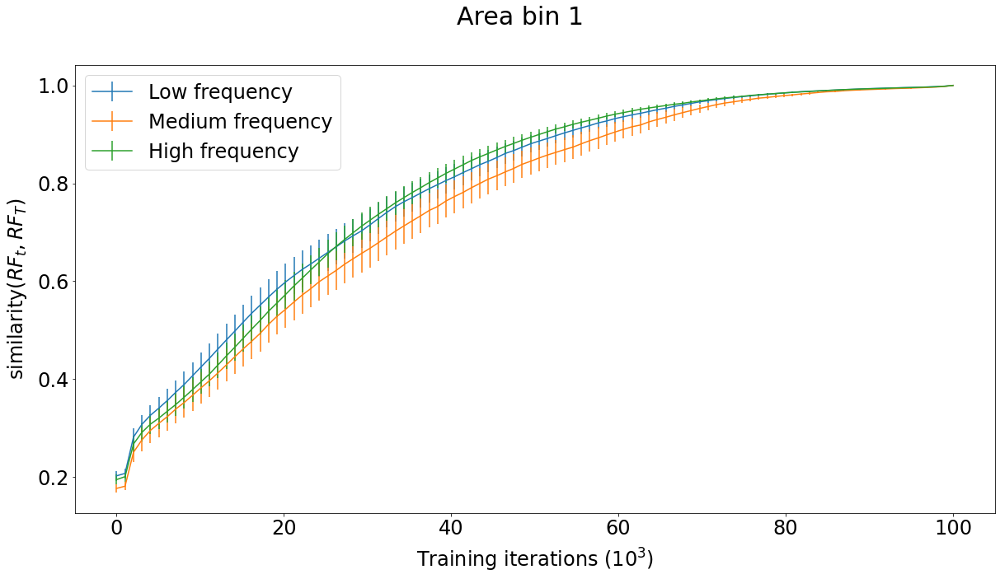

In [62]:
f=plot_mean_timecourse((area0smean,area0mmean,area0lmean),(area0sstderr,area0mstderr,area0lstderr),('Low frequency', 'Medium frequency', 'High frequency') )
f.suptitle('Area bin 1',fontsize=30)

(array([28.,  4.,  1.,  0.,  1.,  0.,  0.,  0.,  0.,  1.]),
 array([0.20375492, 0.65638949, 1.10902406, 1.56165863, 2.0142932 ,
        2.46692777, 2.91956234, 3.37219691, 3.82483149, 4.27746606,
        4.73010063]),
 <BarContainer object of 10 artists>)

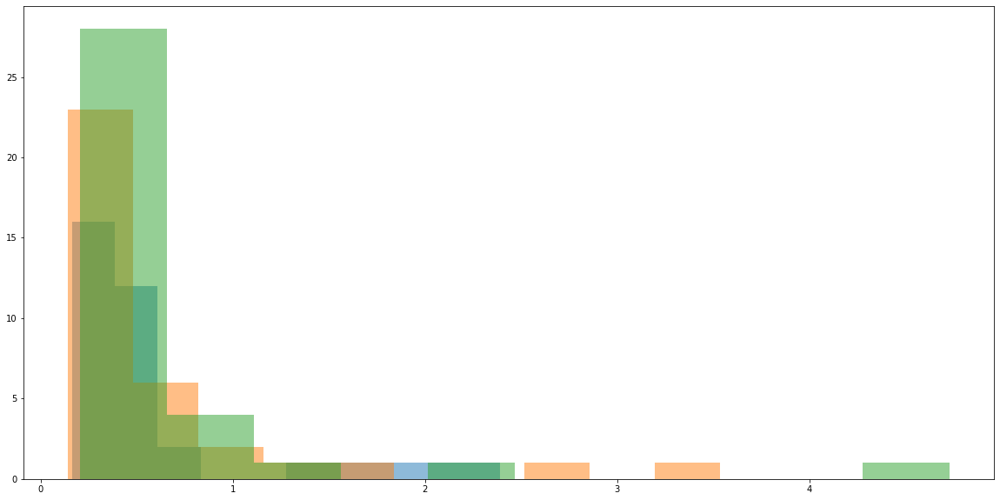

In [63]:
plt.hist(get_param(lca_gabor_params[area0s],param_str='orientedcycles'),alpha=0.5)
plt.hist(get_param(lca_gabor_params[area0m],param_str='orientedcycles'),alpha=0.5)
plt.hist(get_param(lca_gabor_params[area0l],param_str='orientedcycles'),alpha=0.5)

Text(0.5, 0.98, 'Area bin 2')

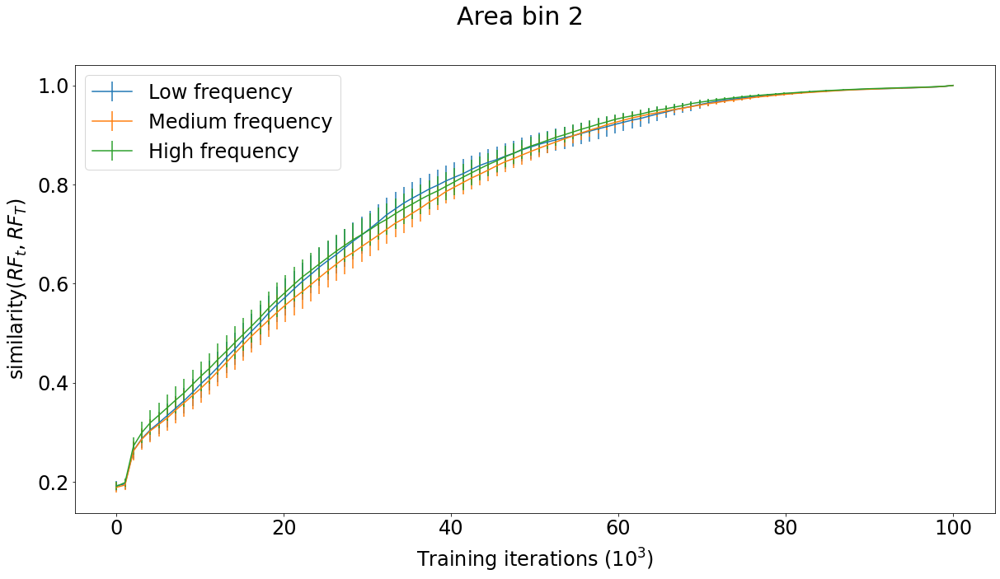

In [64]:
f=plot_mean_timecourse((area1smean,area1mmean,area1lmean),(area1sstderr,area1mstderr,area1lstderr),('Low frequency', 'Medium frequency', 'High frequency') )
f.suptitle('Area bin 2',fontsize=30)

(array([15., 12.,  2.,  4.,  0.,  0.,  0.,  0.,  1.,  1.]),
 array([0.13997102, 0.36495872, 0.58994642, 0.81493412, 1.03992182,
        1.26490953, 1.48989723, 1.71488493, 1.93987263, 2.16486033,
        2.38984803]),
 <BarContainer object of 10 artists>)

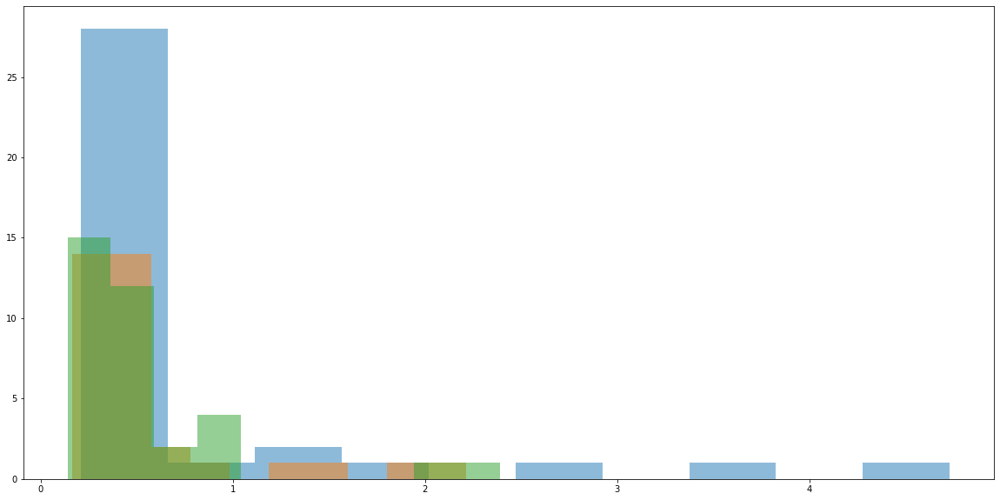

In [65]:
plt.hist(get_param(lca_gabor_params[area1s],param_str='orientedcycles'),alpha=0.5)
plt.hist(get_param(lca_gabor_params[area1m],param_str='orientedcycles'),alpha=0.5)
plt.hist(get_param(lca_gabor_params[area1l],param_str='orientedcycles'),alpha=0.5)

Text(0.5, 0.98, 'Area bin 3')

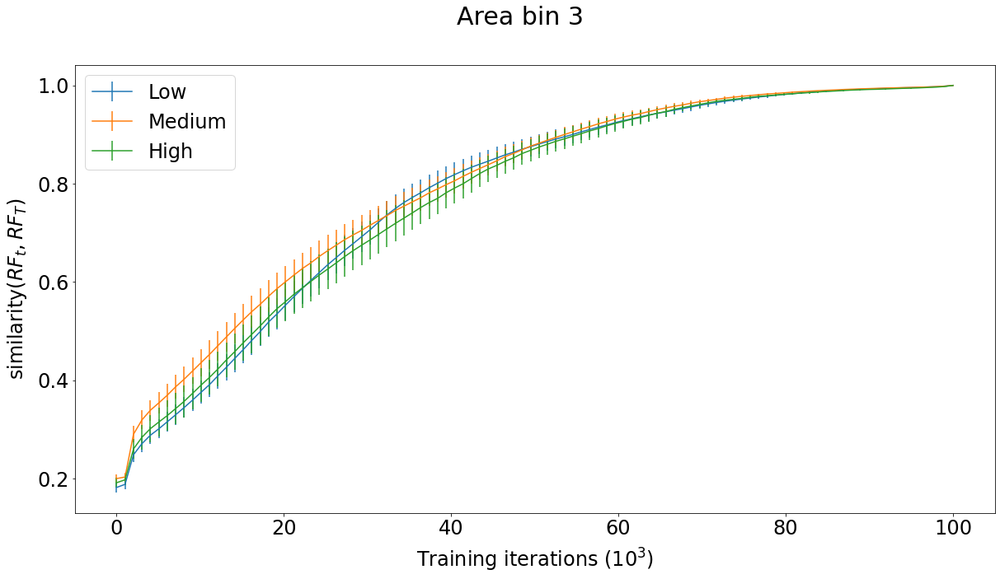

In [66]:
f=plot_mean_timecourse((area2smean,area2mmean,area2lmean),(area2sstderr,area2mstderr,area2lstderr),('Low', 'Medium', 'High') )
f.suptitle('Area bin 3',fontsize=30)

(array([4.98143681, 3.44868703, 1.14956234, 0.38318745, 1.91593724,
        0.        , 0.76637489, 0.        , 0.38318745, 0.38318745]),
 array([0.52995206, 0.6045146 , 0.67907713, 0.75363967, 0.82820221,
        0.90276475, 0.97732728, 1.05188982, 1.12645236, 1.2010149 ,
        1.27557744]),
 <BarContainer object of 10 artists>)

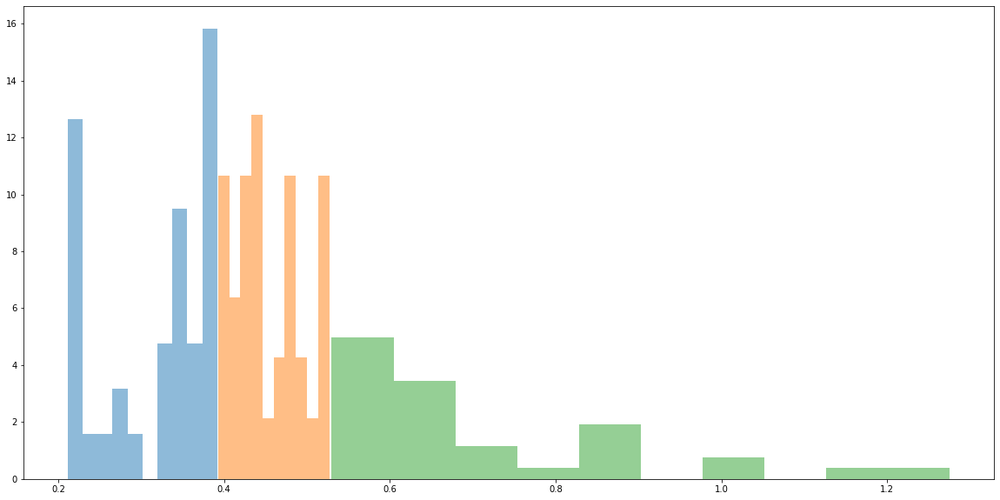

In [2294]:
plt.hist(get_param(lca_gabor_params[area2s],param_str='orientedcycles'),alpha=0.5,density=True)
plt.hist(get_param(lca_gabor_params[area2m],param_str='orientedcycles'),alpha=0.5,density=True)
plt.hist(get_param(lca_gabor_params[area2l],param_str='orientedcycles'),alpha=0.5,density=True)

Text(0.5, 0.98, 'Area bin 4')

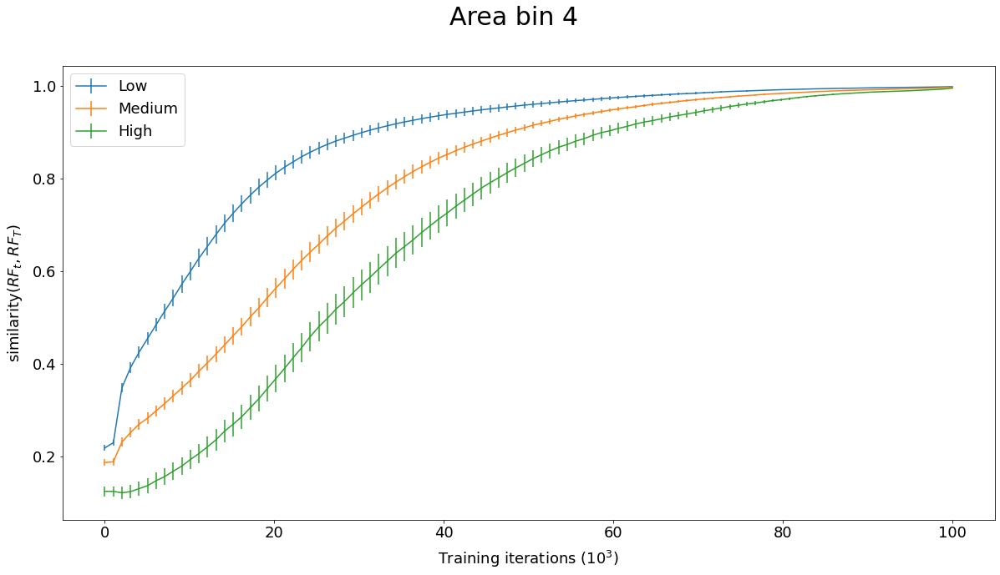

In [2314]:
f=plot_mean_timecourse((area3smean,area3mmean,area3lmean),(area3sstderr,area3mstderr,area3lstderr),('Low', 'Medium', 'High') )
f.suptitle('Area bin 4',fontsize=30)

(array([0.72719902, 1.16351843, 0.29087961, 0.1454398 , 0.0727199 ,
        0.        , 0.        , 0.        , 0.0727199 , 0.0727199 ]),
 array([0.80113099, 1.19402795, 1.58692492, 1.97982188, 2.37271884,
        2.76561581, 3.15851277, 3.55140974, 3.9443067 , 4.33720366,
        4.73010063]),
 <BarContainer object of 10 artists>)

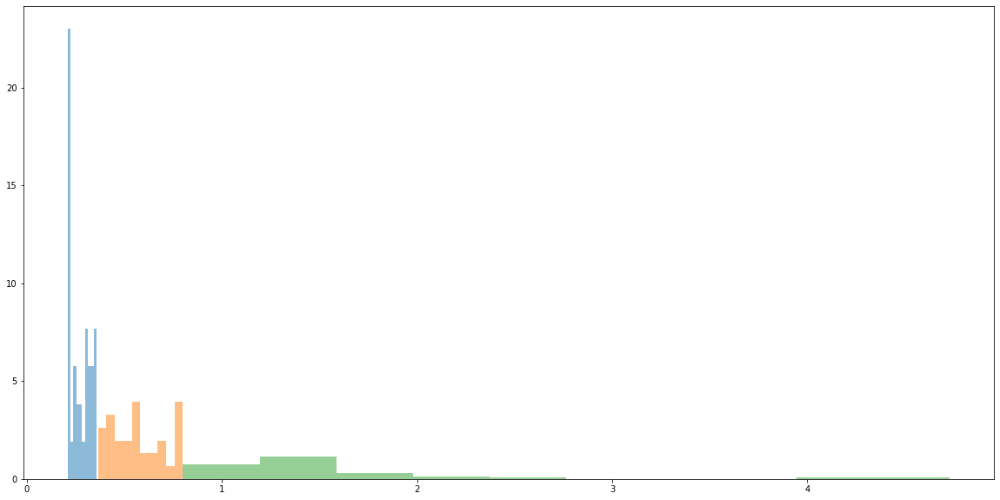

In [2296]:
plt.hist(get_param(lca_gabor_params[area3s],param_str='orientedcycles'),alpha=0.5, density=True)
plt.hist(get_param(lca_gabor_params[area3m],param_str='orientedcycles'),alpha=0.5, density=True)
plt.hist(get_param(lca_gabor_params[area3l],param_str='orientedcycles'),alpha=0.5, density=True)

Text(0.5, 0.98, 'Area bin 5')

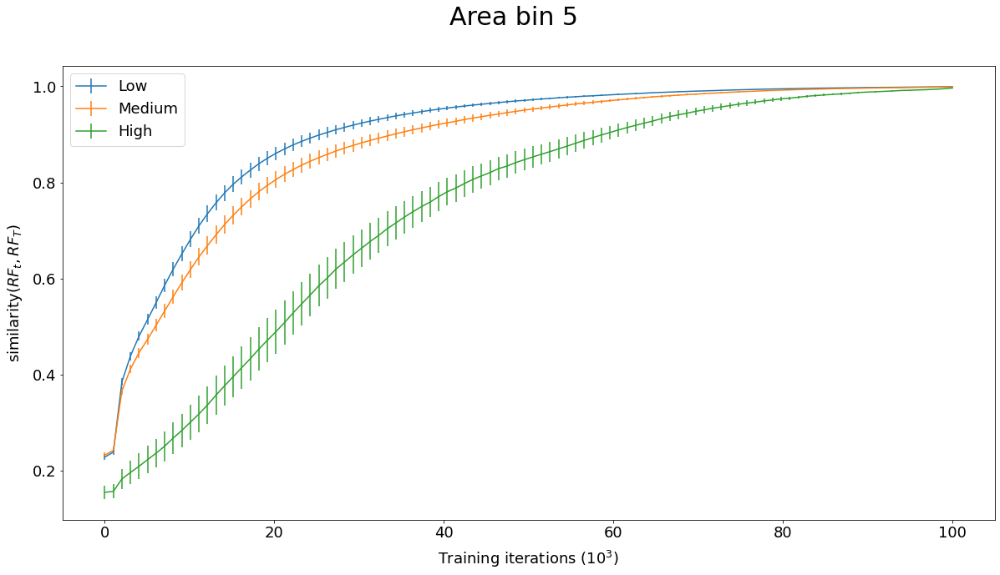

In [2316]:
f=plot_mean_timecourse((area4smean,area4mmean,area4lmean),(area4sstderr,area4mstderr,area4lstderr),('Low', 'Medium', 'High') )
f.suptitle('Area bin 5',fontsize=30)

### 7) ANOVA testing for size/frequency

In [2499]:
alltimecourses = np.array([Q[allrfs] for Q in Qfinaloverlaphistory][0:100])

In [2500]:
areasundertimecourses = np.trapz(alltimecourses,axis=0)
Y = scipy.stats.zscore(areasundertimecourses)

In [2501]:
X = np.column_stack((get_param(lca_gabor_params[allrfs], param_str='sigmaarea'),
                     get_param(lca_gabor_params[allrfs], param_str='orientedcycles'))
                   )
X = scipy.stats.zscore(X,axis=0)

In [2451]:
import sklearn

In [2502]:
testlin = sklearn.linear_model.LinearRegression().fit(X,Y)


In [2503]:
testlin.score(X,Y)

0.32410001566527924

In [2505]:
testlin.coef_

array([ 0.22004172, -0.53128442])

In [2506]:
beta_hat = np.linalg.inv(X.T @ X) @ X.T @ Y

In [2507]:
beta_hat

array([ 0.22004172, -0.53128442])

In [2510]:
np.var(beta_hat[1]*X[:,1])/(np.var(beta_hat[0]*X[:,0])+np.var(beta_hat[1]*X[:,1]))

0.8535800796077055

In [2511]:
np.var(beta_hat[0]*X[:,0])/(np.var(beta_hat[0]*X[:,0])+np.var(beta_hat[1]*X[:,1]))

0.14641992039229454

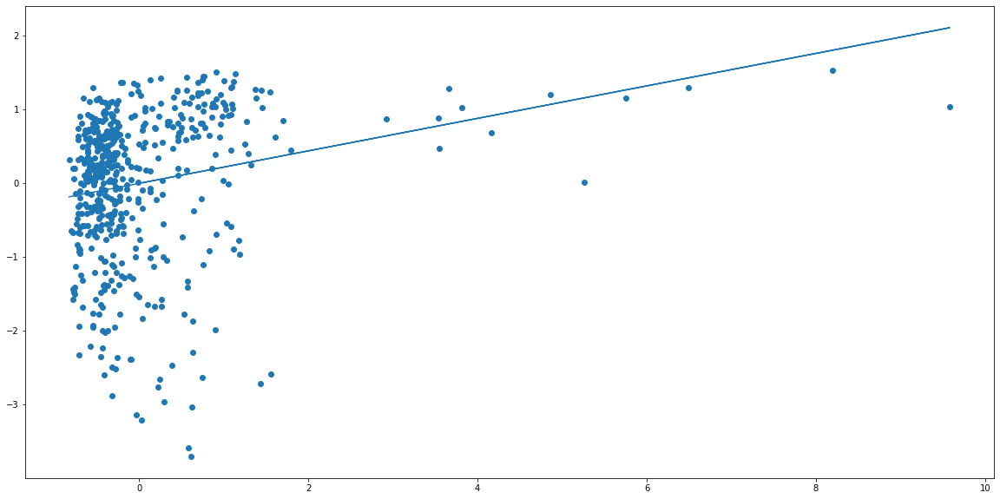

In [2512]:
plt.plot(X[:,0], beta_hat[0]*X[:,0])
plt.scatter(X[:,0], Y)

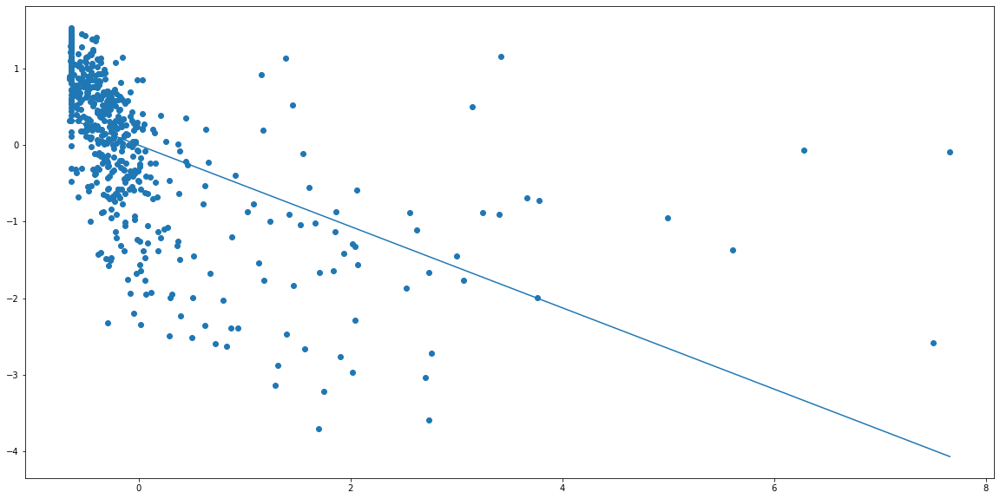

In [2513]:
plt.plot(X[:,1], beta_hat[1]*X[:,1])
plt.scatter(X[:,1], Y)

### 8) Phi dependence sanity check

In [2317]:
sort_all_by_phi = sort_by_param(lca_gabor_params[allrfs], param_str='phi')

In [2319]:
phi0,phi1,phi2,phi3,phi4,_ = np.split(allrfs[sort_all_by_phi],[105,210,315,420,525])

In [2321]:
phi0mean, phi0stderr = get_mean_timecourse(Qfinaloverlaphistory, idxs=phi0)   
phi1mean, phi1stderr = get_mean_timecourse(Qfinaloverlaphistory, idxs=phi1)    
phi2mean, phi2stderr = get_mean_timecourse(Qfinaloverlaphistory, idxs=phi2)
phi3mean, phi3stderr = get_mean_timecourse(Qfinaloverlaphistory, idxs=phi3)    
phi4mean, phi4stderr = get_mean_timecourse(Qfinaloverlaphistory, idxs=phi4)    


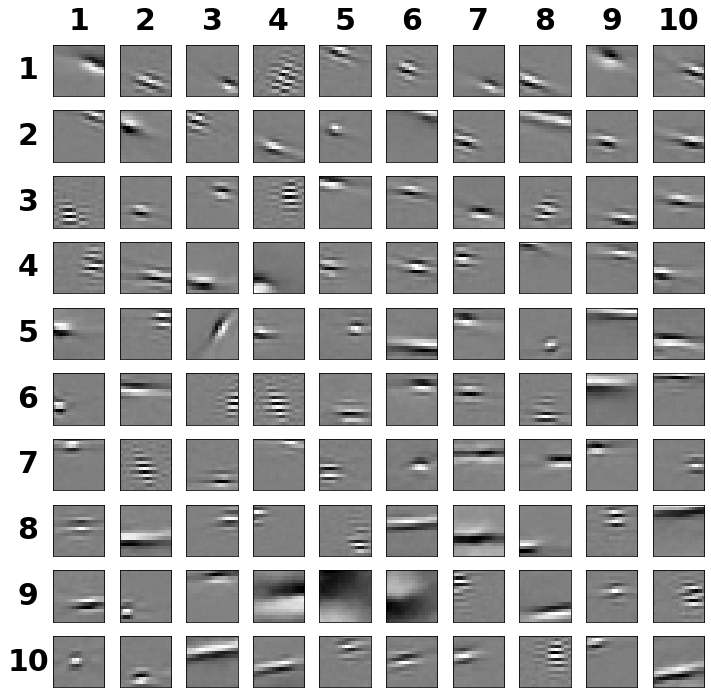

In [2325]:
f = utils.display_patches(100,lca_model.Q[phi2],display=True, center=True)

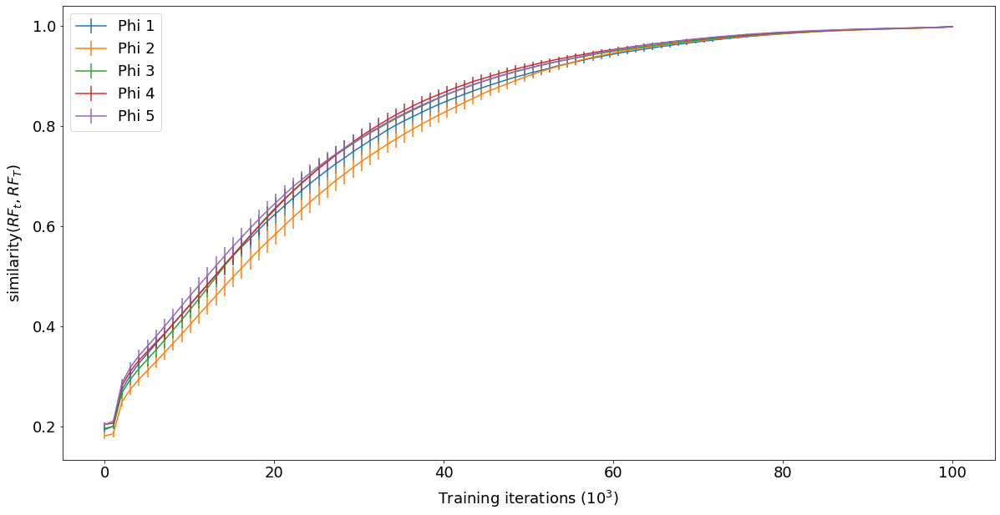

In [2326]:
f=plot_mean_timecourse((phi0mean,phi1mean,phi2mean,phi3mean,phi4mean),(phi0stderr,phi1stderr,phi2stderr,phi3stderr,phi4stderr),('Phi 1', 'Phi 2', 'Phi 3', 'Phi 4', 'Phi 5') )

### 10) Fourier transform of RFs

In [240]:
def get_max_freqs(bases, idxs):
    kfreq = np.fft.fftfreq(16)*16
    kfreq2D = np.meshgrid(kfreq, kfreq)
    knrm = np.sqrt(kfreq2D[0]**2+kfreq2D[1]**2)
    knrm = knrm.flatten()
    kbins = np.arange(0.5, 16//2+1, 1.)
    kvals = 0.5*(kbins[1:] + kbins[:-1])
    fourier_basis = np.array([np.fft.fftn(rf.reshape((16,16))) for rf in bases[idxs]])
    fourier_amplitudes = np.abs(fourier_basis)**2
    fourier_amplitudes = [oneamp.reshape(256) for oneamp in fourier_amplitudes]
    Abins = [stats.binned_statistic(knrm, amplitude, statistic="mean", bins=kbins)[0] for amplitude in fourier_amplitudes]
    Abins = [onebin*np.pi*(kbins[1:]**2 - kbins[:-1]**2) for onebin in Abins]
    return np.array([kvals[np.argmax(Abin)] for Abin in Abins])

In [296]:
hfmf = get_max_freqs(Qhistory[-1], highfreq)

In [297]:
gabormf = get_max_freqs(Qhistory[-1], gabors)
edgesmf = get_max_freqs(Qhistory[-1], edges)
smallareamf = get_max_freqs(Qhistory[-1], smallarea)

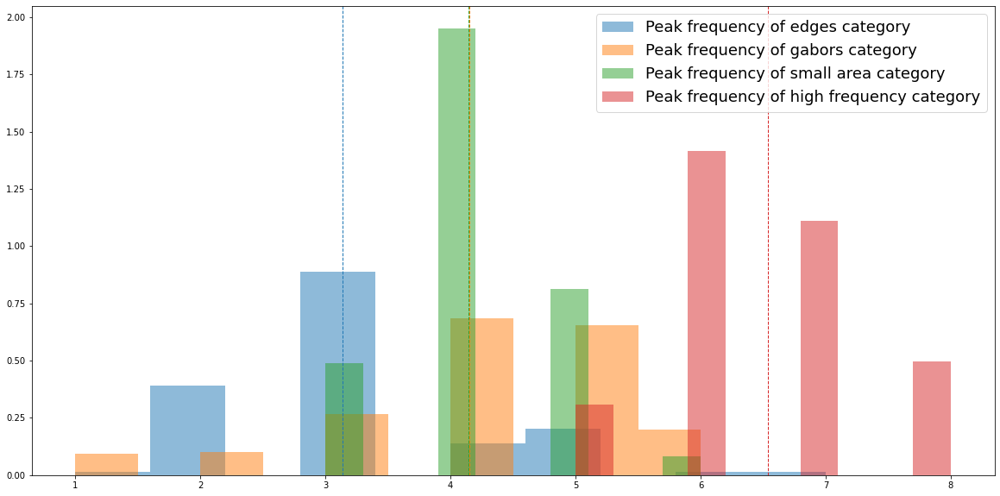

In [320]:
plt.hist(edgesmf, density=True, alpha=0.5, label='Peak frequency of edges category')
plt.axvline(np.mean(edgesmf), color='tab:blue', linestyle='dashed', linewidth=1)
plt.hist(gabormf, density=True, alpha=0.5, label='Peak frequency of gabors category')
plt.axvline(np.mean(gabormf), color='tab:orange', linestyle='dashed', linewidth=1)
plt.hist(smallareamf, density=True, alpha=0.5, label='Peak frequency of small area category')
plt.axvline(np.mean(smallareamf), color='tab:green', linestyle='dashed', linewidth=1)
plt.hist(hfmf, density=True, alpha=0.5, label='Peak frequency of high frequency category')
plt.axvline(np.mean(hfmf), color='tab:red', linestyle='dashed', linewidth=1)
plt.legend(fontsize=18)

In [302]:
len(np.intersect1d(highfreq,max3))

81

In [316]:
len(np.intersect1d(smallarea,max2))

14

In [314]:
len(np.intersect1d(gabors,max3))

50

In [307]:
len(np.intersect1d(edges,max0))

48

In [241]:
allmax = get_max_freqs(Qhistory[-1], list(range(2048)))

In [242]:
np.sort(allmax)

array([1., 1., 1., ..., 8., 8., 8.])

In [243]:
np.argsort(allmax)

array([ 992, 1522, 1527, ..., 1001, 1083,  549])

In [245]:
sortbymax = np.argsort(allmax)

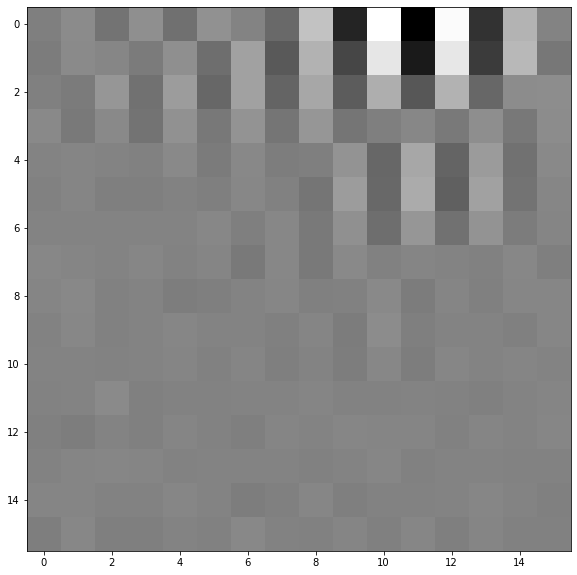

Idx: 549 Mean: 0.00047571916365996003 Stdev: 0.06249818578362465 Min: -0.341447651386261 Max: 0.32336366176605225


In [247]:
utils.display_image(utils.move_axis_to_batch_minor(Qhistory[-1],0).reshape(16,16,2048),idx=549)

(<Figure size 4608x2304 with 2048 Axes>,
 [<AxesSubplot:title={'center':'1'}, ylabel='1'>,
  <AxesSubplot:title={'center':'2'}>,
  <AxesSubplot:title={'center':'3'}>,
  <AxesSubplot:title={'center':'4'}>,
  <AxesSubplot:title={'center':'5'}>,
  <AxesSubplot:title={'center':'6'}>,
  <AxesSubplot:title={'center':'7'}>,
  <AxesSubplot:title={'center':'8'}>,
  <AxesSubplot:title={'center':'9'}>,
  <AxesSubplot:title={'center':'10'}>,
  <AxesSubplot:title={'center':'11'}>,
  <AxesSubplot:title={'center':'12'}>,
  <AxesSubplot:title={'center':'13'}>,
  <AxesSubplot:title={'center':'14'}>,
  <AxesSubplot:title={'center':'15'}>,
  <AxesSubplot:title={'center':'16'}>,
  <AxesSubplot:title={'center':'17'}>,
  <AxesSubplot:title={'center':'18'}>,
  <AxesSubplot:title={'center':'19'}>,
  <AxesSubplot:title={'center':'20'}>,
  <AxesSubplot:title={'center':'21'}>,
  <AxesSubplot:title={'center':'22'}>,
  <AxesSubplot:title={'center':'23'}>,
  <AxesSubplot:title={'center':'24'}>,
  <AxesSubplot:title

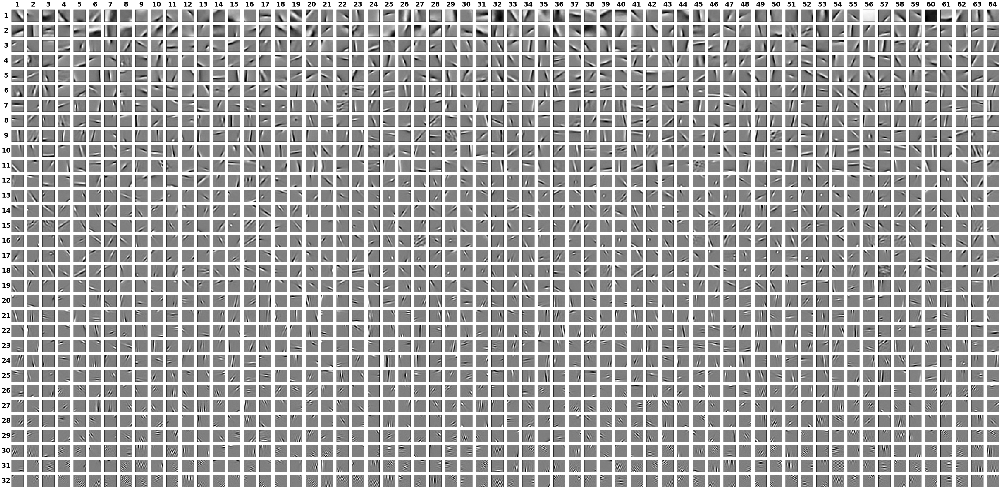

In [248]:
f = utils.display_patches(2048,Qhistory[-1][sortbymax],display=True,center=True)

In [212]:
len(sortbymax)

2048

In [249]:
max0,max1,max2,max3 = np.split(sortbymax,4)

(array([107., 231., 391.,   0., 473., 401.,   0., 240., 126.,  79.]),
 array([1. , 1.7, 2.4, 3.1, 3.8, 4.5, 5.2, 5.9, 6.6, 7.3, 8. ]),
 <BarContainer object of 10 artists>)

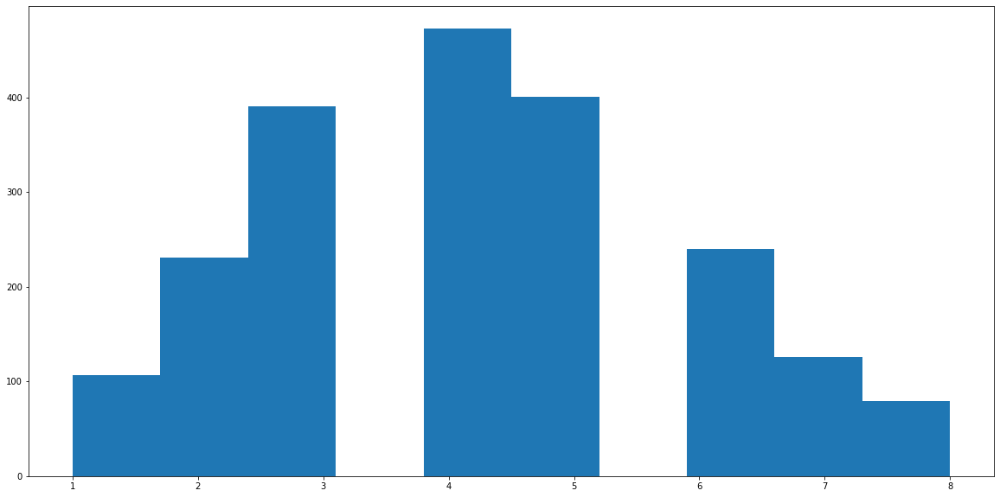

In [295]:
plt.hist(allmax)

In [250]:
max0mean, max0std = get_mean_timecourse(Qfinaloverlaphistory,max0)
max1mean, max1std = get_mean_timecourse(Qfinaloverlaphistory,max1)
max2mean, max2std = get_mean_timecourse(Qfinaloverlaphistory,max2)
max3mean, max3std = get_mean_timecourse(Qfinaloverlaphistory,max3)
# max4mean, max4std = get_mean_timecourse(Qfinaloverlaphistory,max4)


In [34]:
allrfs = np.concatenate((smallarea,highfreq,gabors,edges))

In [296]:
hfmf = get_max_freqs(Qhistory[-1], highfreq)

In [297]:
gabormf = get_max_freqs(Qhistory[-1], gabors)
edgesmf = get_max_freqs(Qhistory[-1], edges)
smallareamf = get_max_freqs(Qhistory[-1], smallarea)

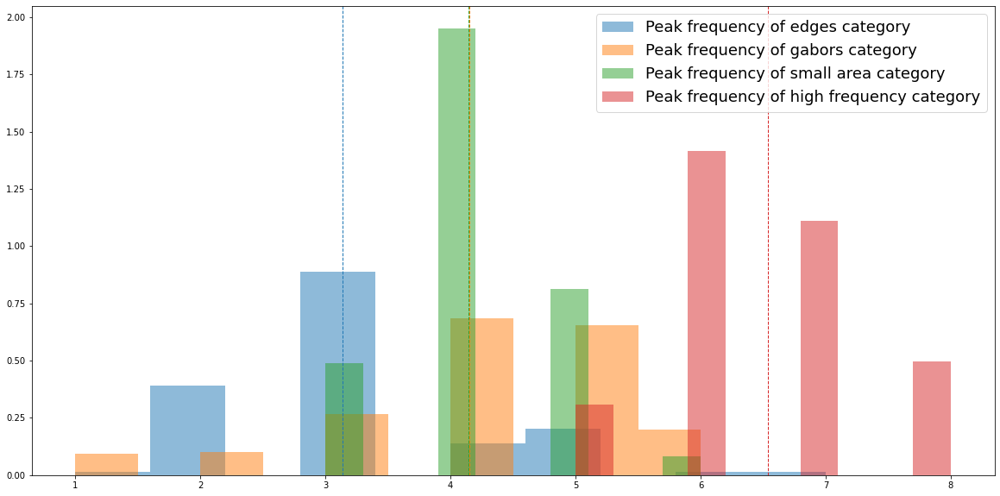

In [320]:
plt.hist(edgesmf, density=True, alpha=0.5, label='Peak frequency of edges category')
plt.axvline(np.mean(edgesmf), color='tab:blue', linestyle='dashed', linewidth=1)
plt.hist(gabormf, density=True, alpha=0.5, label='Peak frequency of gabors category')
plt.axvline(np.mean(gabormf), color='tab:orange', linestyle='dashed', linewidth=1)
plt.hist(smallareamf, density=True, alpha=0.5, label='Peak frequency of small area category')
plt.axvline(np.mean(smallareamf), color='tab:green', linestyle='dashed', linewidth=1)
plt.hist(hfmf, density=True, alpha=0.5, label='Peak frequency of high frequency category')
plt.axvline(np.mean(hfmf), color='tab:red', linestyle='dashed', linewidth=1)
plt.legend(fontsize=18)

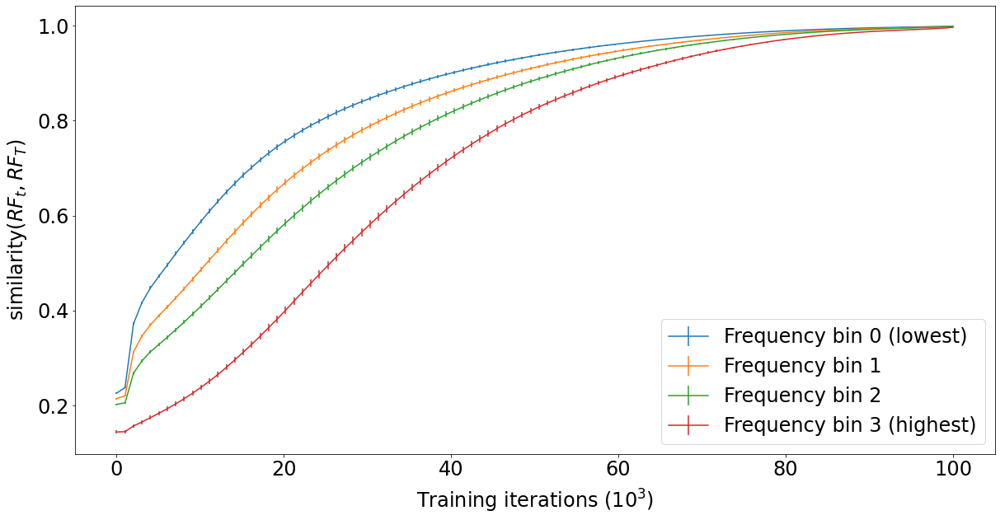

In [258]:
f = plot_mean_timecourse((max0mean, max1mean, max2mean, max3mean), 
                        (max0std, max1std, max2std, max3std),
                        ('Frequency bin 0 (lowest)','Frequency bin 1','Frequency bin 2','Frequency bin 3 (highest)'))

<Figure size 1440x720 with 0 Axes>

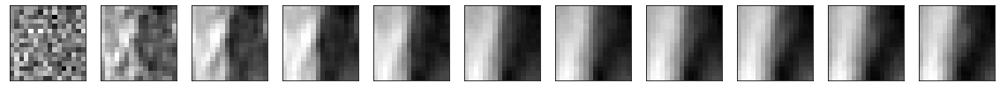

In [289]:
display_rfs_over_time(Qhistory, interval=10, idx=max0[6], center=False)

<Figure size 1440x720 with 0 Axes>

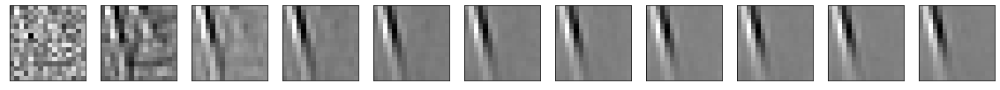

In [290]:
display_rfs_over_time(Qhistory, interval=10, idx=max1[80], center=False)

<Figure size 1440x720 with 0 Axes>

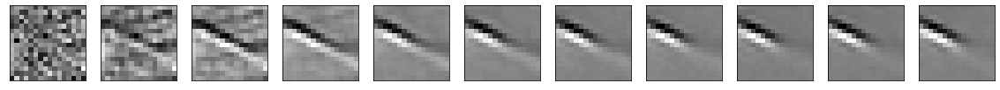

In [292]:
display_rfs_over_time(Qhistory, interval=10, idx=max2[80], center=False)

<Figure size 1440x720 with 0 Axes>

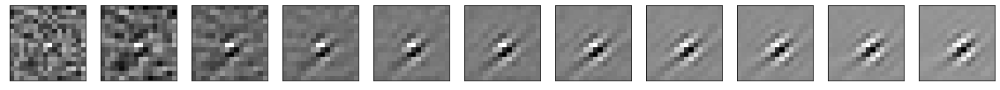

In [291]:
display_rfs_over_time(Qhistory, interval=10, idx=max3[131], center=False)

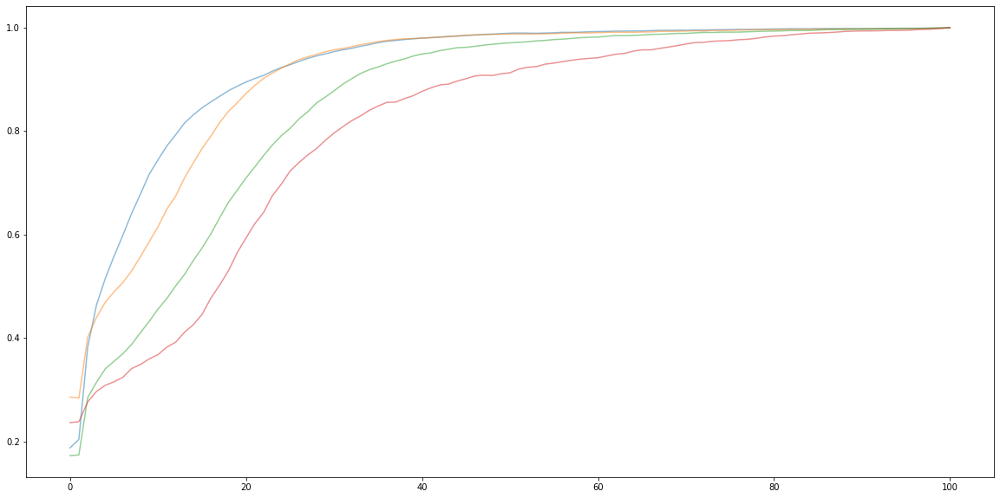

In [294]:
f = plt.plot([Q[max0][6] for Q in Qfinaloverlaphistory], color='tab:blue',alpha=0.5)
f = plt.plot([Q[max1][80] for Q in Qfinaloverlaphistory], color='tab:orange',alpha=0.5)
f = plt.plot([Q[max2][80] for Q in Qfinaloverlaphistory], color='tab:green',alpha=0.5)
f = plt.plot([Q[max3][131] for Q in Qfinaloverlaphistory], color='tab:red',alpha=0.5)

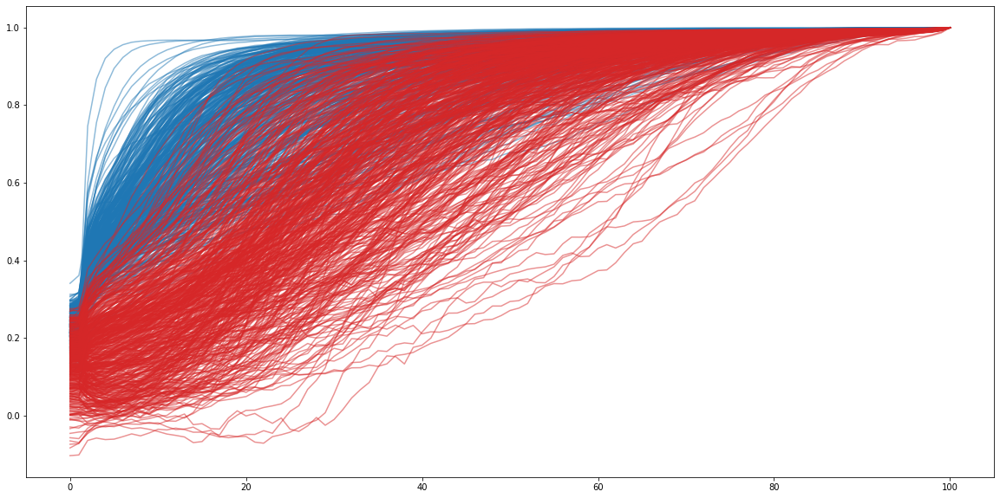

In [265]:
f = plt.plot([Q[max0] for Q in Qfinaloverlaphistory], color='tab:blue',alpha=0.5)
f = plt.plot([Q[max3] for Q in Qfinaloverlaphistory], color='tab:red',alpha=0.5)

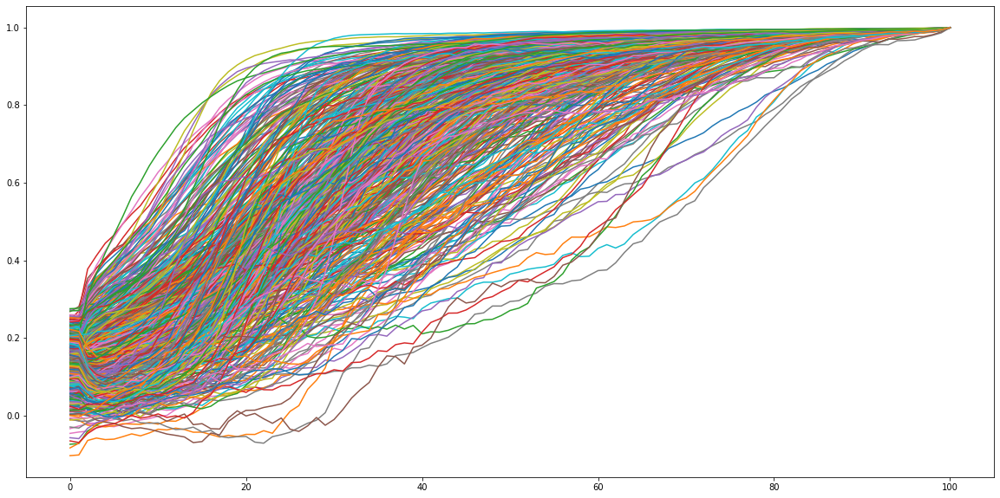

In [261]:
f = plt.plot([Q[max3] for Q in Qfinaloverlaphistory])

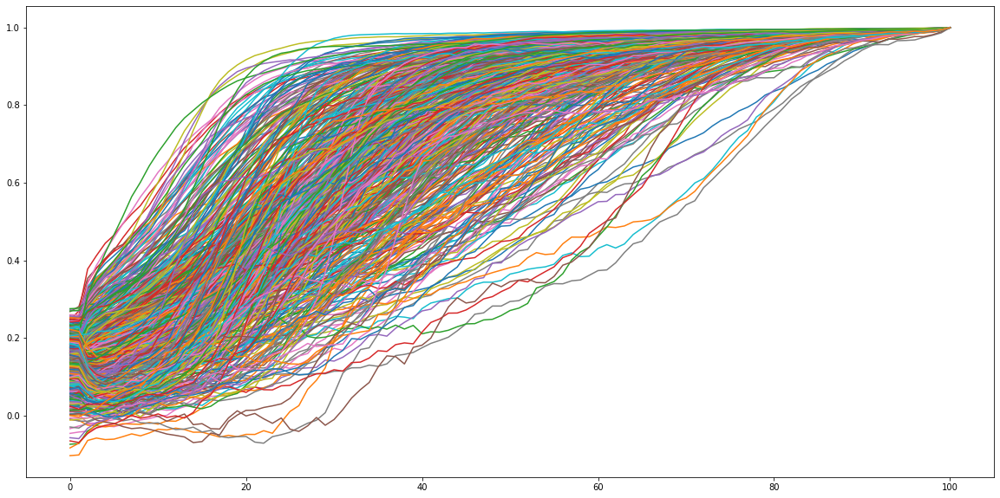

In [259]:
f = plt.plot([Q[max3] for Q in Qfinaloverlaphistory])

In [252]:
gabormax = get_max_freqs(Qhistory[-1], gabors)
edgesmax = get_max_freqs(Qhistory[-1], edges)
highfreqmax = get_max_freqs(Qhistory[-1], highfreq)
smallareamax = get_max_freqs(Qhistory[-1], smallarea)

In [253]:
sort_all_by_freq = sort_by_param(gabor_params[allrfs], param_str='orientedcycles')

In [254]:
freq0,freq1,freq2,freq3,freq4 = np.split(allrfs[sort_all_by_freq],5)

In [255]:
freq0max = get_max_freqs(Qhistory[-1], freq0)
freq1max = get_max_freqs(Qhistory[-1], freq1)
freq2max = get_max_freqs(Qhistory[-1], freq2)
freq3max = get_max_freqs(Qhistory[-1], freq3)
freq4max = get_max_freqs(Qhistory[-1], freq4)

(array([ 1.,  1.,  0.,  3.,  0., 19., 41.,  0., 29., 13.]),
 array([2. , 2.6, 3.2, 3.8, 4.4, 5. , 5.6, 6.2, 6.8, 7.4, 8. ]),
 <BarContainer object of 10 artists>)

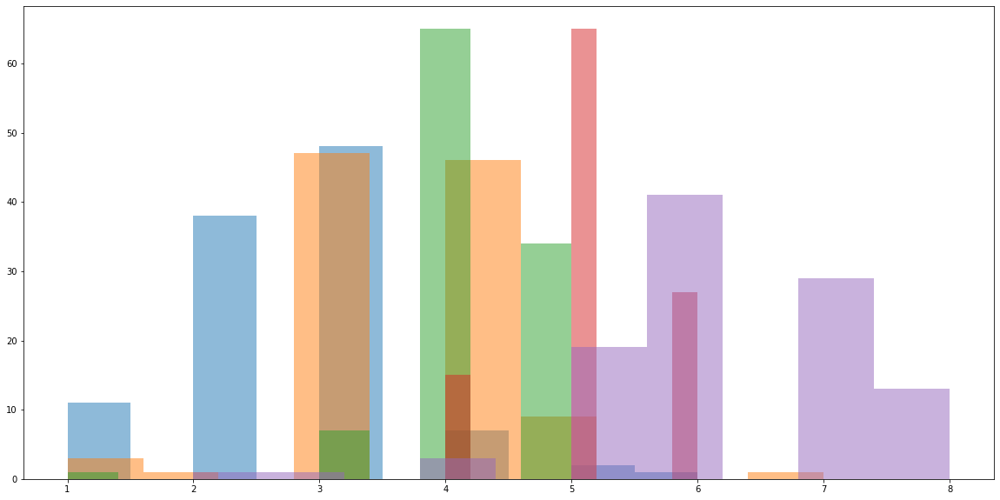

In [256]:
plt.hist(freq0max, alpha=0.5)
plt.hist(freq1max, alpha=0.5)
plt.hist(freq2max, alpha=0.5)
plt.hist(freq3max, alpha=0.5)
plt.hist(freq4max, alpha=0.5)

In [172]:
fourier_amplitudes.shape

(300, 256)

In [175]:
import scipy.stats as stats

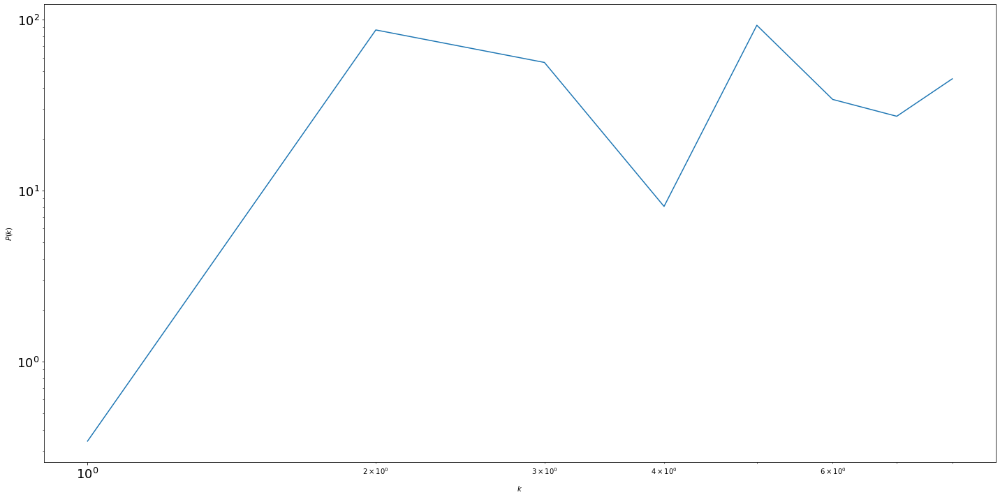

In [128]:
plt.loglog(kvals, Abins[70])
plt.xlabel("$k$")
plt.xticks(size=18)
plt.yticks(size=18)
plt.ylabel("$P(k)$")
plt.tight_layout()

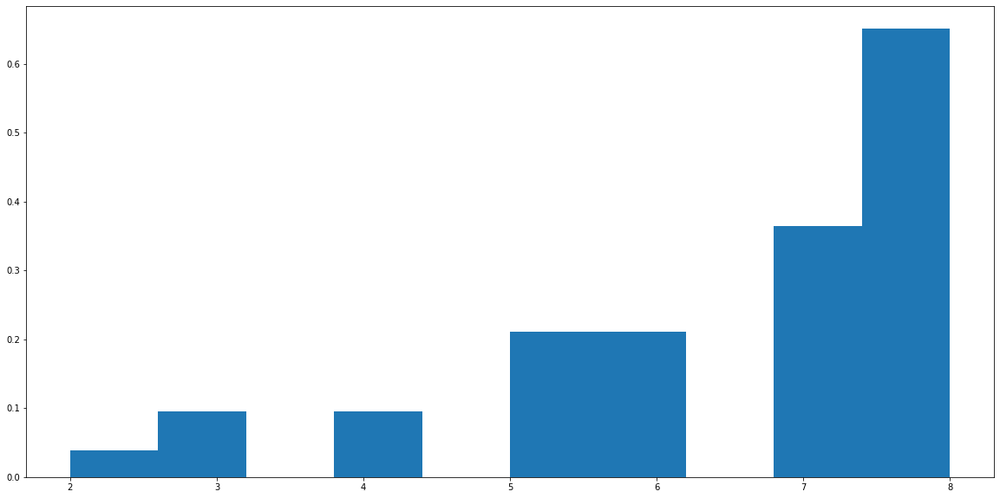

In [130]:
f = plt.hist(maxf, density=True)

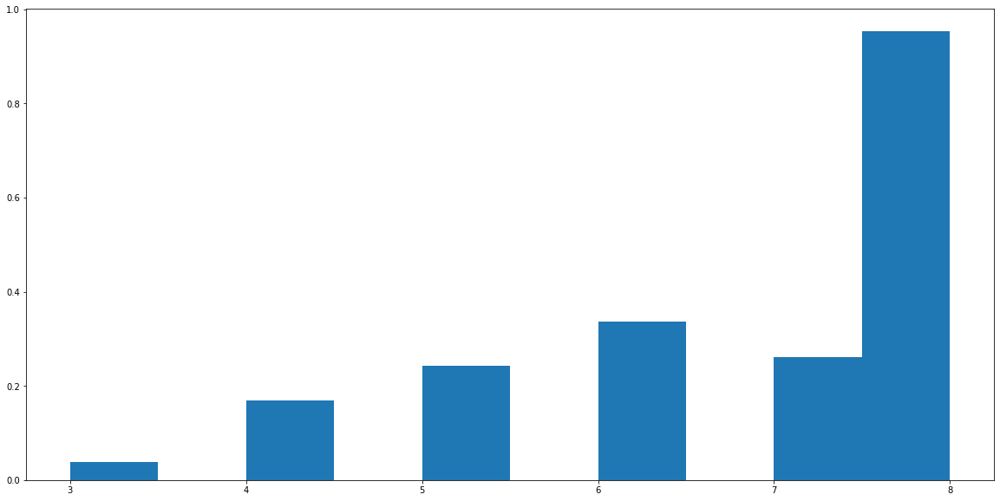

In [163]:
f = plt.hist(maxf, density=True)

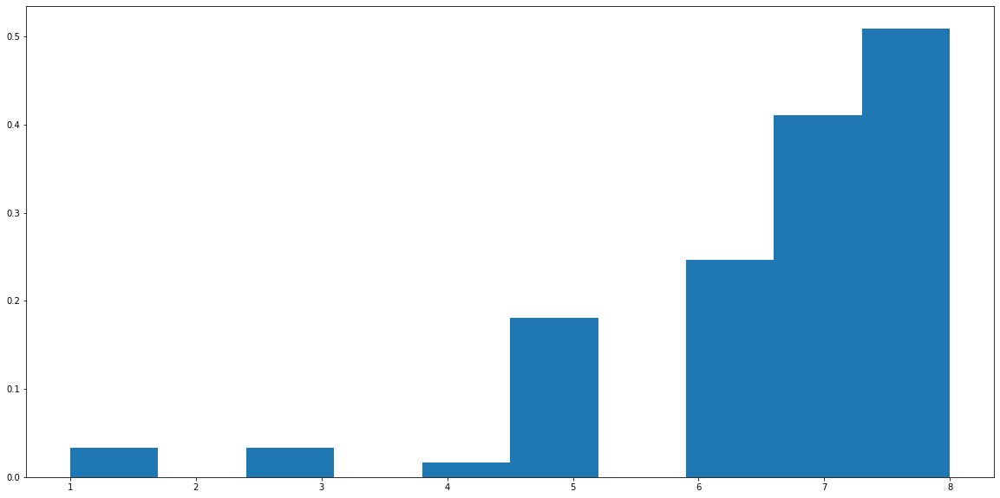

In [147]:
f = plt.hist(maxf[highfreq], density=True)
# g = plt.hist(maxf[edges], density=True)
# h = plt.hist(maxf[gabors], density=True)
# i = plt.hist(maxf[smallarea], density=True)

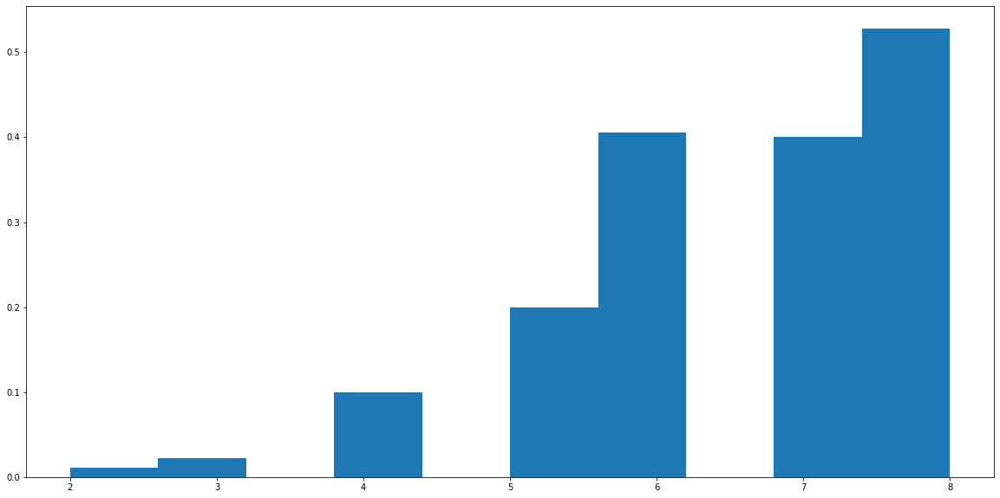

In [180]:
f = plt.hist(maxf, density=True)

### n) Misc./old

In [2086]:
def classify_sample(matlab_params, split,n_per_group):
#     sampleidxs, sample_params = generate_good_samples(matlab_params,r2s,n_per_group*4,r2lowestpercentile,centercutoff)
    sample_params = matlab_params[split]
    #extract small rfs
    areasort = sort_by_param(sample_params, param_str='sigmaarea')
    small = areasort[:n_per_group]
    rest = areasort[n_per_group:]
    #extract high cycles 
    cyclesort = sort_by_param(sample_params[rest], param_str='orientedcycles')
    highfreq = rest[cyclesort][-n_per_group:]
    rest = rest[cyclesort][:-n_per_group]
    #extract edges and gabors
    orientationsort = sort_by_param(sample_params[rest], param_str='orientationratio')
    edges = rest[orientationsort][:n_per_group]
    gabors = rest[orientationsort][n_per_group:]
    return(split[small], split[highfreq], split[edges], split[gabors])

In [2515]:
def generate_class_samples(matlab_params, r2s, n_per_group=100, r2lowestpercentile=50, centercutoff=(1,15)):
    sampleidxs, sample_params = generate_good_samples(matlab_params,r2s,n_per_group*4,r2lowestpercentile,centercutoff)
    #extract small rfs
    areasort = sort_by_param(sample_params, param_str='sigmaarea')
    small = areasort[:n_per_group]
    rest = areasort[n_per_group:]
    #extract high cycles 
    cyclesort = sort_by_param(sample_params[rest], param_str='orientedcycles')
    highfreq = rest[cyclesort][-n_per_group:]
    rest = rest[cyclesort][:-n_per_group]
    #extract edges and gabors
    orientationsort = sort_by_param(sample_params[rest], param_str='orientationratio')
    edges = rest[orientationsort][:n_per_group]
    gabors = rest[orientationsort][n_per_group:]
    return(sampleidxs[small], sampleidxs[highfreq], sampleidxs[edges], sampleidxs[gabors])

In [1469]:
def generate_class_scores(matlab_params, r2s, r2lowestpercentile=50, centercutoff=(1,15)):
        sampleidxs, sample_params = generate_good_samples(matlab_params,
                                                          r2s,
                                                          np.int(r2lowestpercentile*.01*len(matlab_params)),
                                                          r2lowestpercentile,
                                                          centercutoff)
        
        minsize = get_param(sample_params,param_str='sigmaarea').min()
        maxsize = get_param(sample_params, param_str='sigmaarea').max()
        areascores = (get_param(sample_params,param_str='sigmaarea')-minsize)/(maxsize-minsize)
        
        minfreq = get_param(sample_params,param_str='orientedcycles').min()
        maxfreq = get_param(sample_params, param_str='orientedcycles').max()
        freqscores = (get_param(sample_params,param_str='orientedcycles')-minfreq)/(maxfreq-minfreq)
        
        minratio = get_param(sample_params,param_str='orientationratio').min()
        maxratio = get_param(sample_params, param_str='orientationratio').max()
        ratioscores = (get_param(sample_params,param_str='orientationratio')-minratio)/(maxratio-minratio)
        
        return(sampleidxs, areascores, freqscores, ratioscores)
        
        


In [1585]:
def compare_timecourse_order(matlab_params,
                             rfs,
                             r2s, 
                             timecourses,
                             n_per_group=100,
                             r2lowestpercentile=50,
                             centercutoff=(1,15),
                             timebounds=(0,100),
                             showrfs=False):
    
    small, highfreq, edges, gabors = generate_class_samples(matlab_params, 
                                                            r2s,
                                                            n_per_group=n_per_group,
                                                            r2lowestpercentile=r2lowestpercentile,
                                                            centercutoff=centercutoff
                                                            )
    
    smallmean, smallstderr = get_mean_timecourse(timecourses, idxs=small, timebounds=timebounds)
    
    highfreqmean, highfreqstderr = get_mean_timecourse(timecourses, idxs=highfreq, timebounds=timebounds)
    
    edgesmean, edgesstderr = get_mean_timecourse(timecourses, idxs=edges, timebounds=timebounds)
    
    gaborsmean, gaborsstderr = get_mean_timecourse(timecourses, idxs=gabors, timebounds=timebounds)
    
    edgeovergabor = edgesmean-edgesstderr > gaborsmean+gaborsstderr
    gaboroversmall = gaborsmean-gaborsstderr > smallmean+smallstderr
    smalloverhighfreq = smallmean-smallstderr > highfreqmean+highfreqstderr
    
#     edgeoversmall = edgesmean-edgesstderr > smallmean+smallstderr
#     edgeoverhighfreq = edgesmean-edgesstderr > highfreqmean+highfreqstderr
    
#     gaboroverhighfreq = gaborsmean-gabosstderr > highfreqmean+highfreqstderr
    
    asexpected1 = np.logical_and(edgeovergabor, gaboroversmall)
    asexpected2 = np.logical_and(asexpected1, smalloverhighfreq)
#     asexpected3 = np.logical_and(asexpected2, edgeoversmall)
#     ase
    
    f=plot_mean_timecourse([edgesmean, gaborsmean, smallmean, highfreqmean],
                         [edgesstderr, gaborsstderr, smallstderr, highfreqstderr],
                         ['Edge detectors', 'Gabor filters', 'Small area', 'High frequency'])
    
    if showrfs == True:
        f=utils.display_patches(n_per_group, rfs[edges],display=True,center=True, sample=False)
        f=utils.display_patches(n_per_group, rfs[gabors],display=True,center=True, sample=False)
        f=utils.display_patches(n_per_group, rfs[small],display=True,center=True, sample=False)
        f=utils.display_patches(n_per_group, rfs[highfreq],display=True,center=True, sample=False)
    
    if np.where(np.logical_not(asexpected2))[0].size != 0:
        return(np.where(np.logical_not(asexpected2))[0], 
               np.where(np.logical_not(edgeovergabor))[0],
               np.where(np.logical_not(gaboroversmall))[0],
               np.where(np.logical_not(smalloverhighfreq))[0],
              )
    else:
        return None

In [201]:
def plot_raw_params(matlab_params):
    A, b, x0, y0, sigmax, sigmay, theta, phi, lamb, phase = collect_params(matlab_params)
    f0 = 1/lamb
    
    X, Y = np.meshgrid(np.linspace(0,16),np.linspace(0,16))
    plt.figure(figsize=(8,8))
    plt.imshow(ellgaussfunction(X,Y,A,b,x0,y0,sigmax,sigmay,theta,phi,lamb,phase), cmap='gray',extent=[0,16,16,0])
    #plt.imshow(M.T, origin='lower')
    #plt.colorbar()
    print(collect_params(matlab_params))
    print (getr2(matlab_params))
    plt.show()

In [ ]:
def plot_manual_params(params_tuple,A=1,b=0,phi=0,phase=0):
    x0, y0, sigmax, sigmay, theta, lamb = params_tuple
    f0 = 1/lamb
    X,Y = np.meshgrid(np.linspace(0,16),np.linspace(0,16))
    plt.figure(figsize=(8,8))
    plt.imshow(ellgaussfunction(X,Y,A,b,x0,y0,3,3,np.pi/4,0,f0,phase).T, cmap='gray',extent=[0,16,16,0])
    plt.show()

1024
200


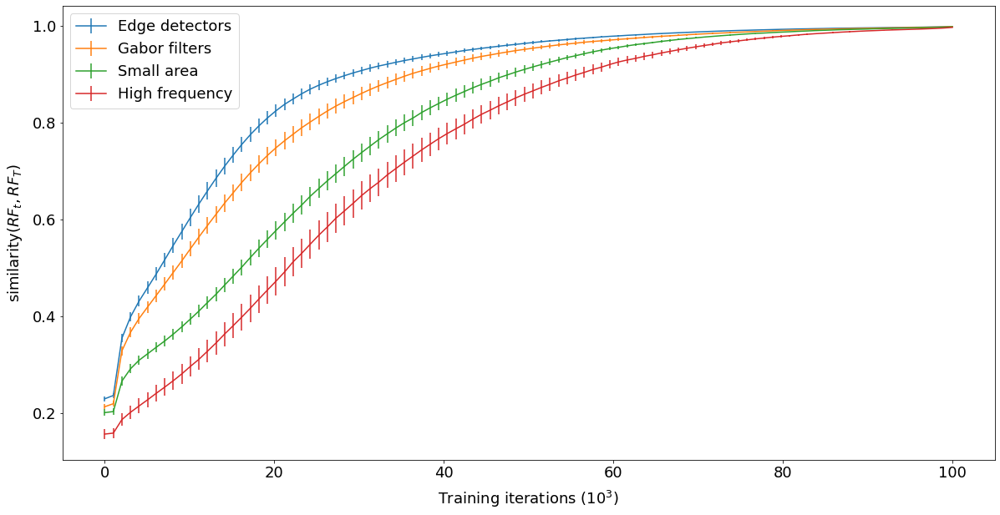

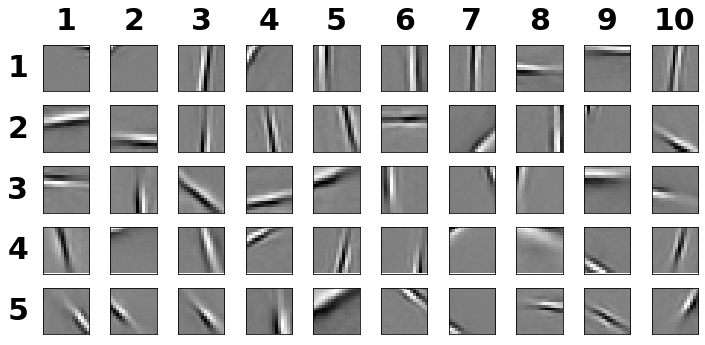

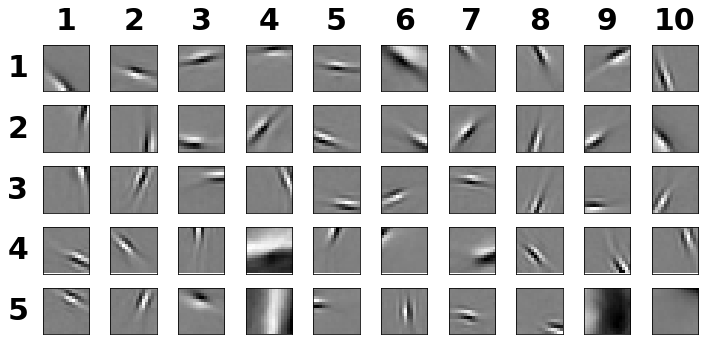

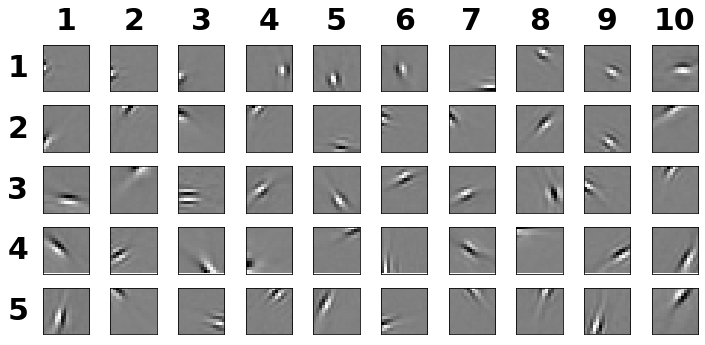

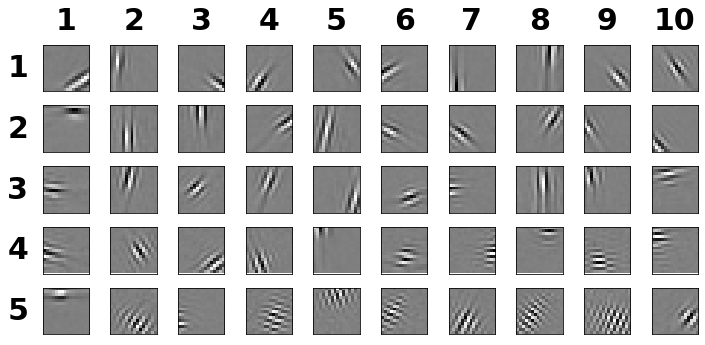

In [1587]:
compare_timecourse_order(lca_gabor_params,lca_model.Q,r2s,Qfinaloverlaphistory,n_per_group=50,r2lowestpercentile=50,showrfs=True)

In [6]:
def describe_helper(series):
    splits = str(series.describe()).split()
    keys, values = "", ""
    for i in range(0, len(splits), 2):
        keys += "{:8}\n".format(splits[i])
        values += "{:>8}\n".format(splits[i+1])
    return keys, values

In [7]:
def gabor(xrange, yrange, params):
    A, phi, sigma_x, sigma_y, f0, phase, x0, y0 = params
    x = (xrange-x0)*np.cos(phi)+(yrange-y0)*np.sin(phi)
    y = -(xrange-x0)*np.sin(phi)+(yrange-y0)*np.cos(phi)
    g = A*np.cos(2*f0*np.pi*x+phase)*np.exp(-(x/(np.sqrt(2)*sigma_x))**2-(y/(np.sqrt(2)*sigma_y))**2)
    return(g)

In [8]:
def plot_params(matlab_params):
    A, b, x0, y0, sigmax, sigmay, theta, phi, lamb, phase = collect_params(matlab_params)
    f0 = 1/lamb
    
    X, Y = np.meshgrid(np.linspace(0,16),np.linspace(0,16))
    plt.figure(figsize=(8,8))
    plt.imshow(ellgaussfunction(X,Y,A,b,x0,y0,sigmax,sigmay,theta,phi,f0,phase).T, cmap='gray',extent=[0,16,16,0])
    #plt.imshow(M.T, origin='lower')
    #plt.colorbar()
    print(collect_params(matlab_params))
    print (getr2(matlab_params))
    plt.show()

In [9]:
def ellgaussfunction(xrange, yrange, A, b, x0, y0, sigmax, sigmay, theta, phi, f0, phase):
    x = (xrange-x0)*np.cos(phi)+(yrange-y0)*np.sin(phi)
    y = -(xrange-x0)*np.sin(phi)+(yrange-y0)*np.cos(phi)
    a_gauss = np.cos(theta)**2/(2*sigmax**2) + np.sin(theta)**2/(2*sigmay**2)
    b_gauss = -np.sin(2*theta)/(4*sigmax**2) + np.sin(2*theta)/(4*sigmay**2)
    c_gauss = np.sin(theta)**2/(2*sigmax**2) + np.cos(theta)**2/(2*sigmay**2)
    g = b + A*np.cos(2*f0*np.pi*x+phase)*np.exp(-(a_gauss*x**2 - 2*b_gauss*x*y + c_gauss*y**2))
    return(g)

In [10]:
def ellgaussconstructor(xrange,yrange,params):
    A, b, x0, y0, sigmax, sigmay, theta, phi, lamb, phase = collect_params(params)
    f0 = 1/lamb
    g = ellgaussfunction(xrange, yrange, A, b, x0, y0, sigmax, sigmay, theta, phi, f0, phase)
    return(g)

In [11]:
def collect_params(matlab_params):
    A, b, x0, y0, sigmax, sigmay, theta, phi, lamb, phase = matlab_params[0][0][1][0][0]
    A = A[0][0]
    b = b[0][0]
    x0 = x0[0][0]
    y0 = y0[0][0]
    sigmax = sigmax[0][0]
    sigmay = sigmay[0][0]
    theta = theta[0][0]
    phi = phi[0][0]
    lamb = lamb[0][0]
    phase = phase[0][0]
#     f0 = 1/lamb
    return A, b, x0, y0, sigmax, sigmay, theta, phi, lamb, phase

In [12]:
def get_param(matlab_params, param_str='lambda'):
    if param_str == 'lambda':
        idx = 8 
   
    elif param_str == 'A':
        idx = 0
       
    elif param_str == 'x0':
        idx = 2
       
    elif param_str == 'y0':
        idx = 3
   
    elif param_str == 'sigmax':
        idx=4
          
    elif param_str == 'sigmay':
        idx=5
       
    elif param_str == 'theta':
        idx=6
       
    elif param_str == 'phi':
        idx = 7
        
    elif param_str == 'sigmamax':
        sigmax = get_param(matlab_params, param_str='sigmax')
        sigmay = get_param(matlab_params, param_str='sigmay')
        return(np.maximum(sigmax,sigmay))
    
    elif param_str == 'sigmaarea':
        sigmax = get_param(matlab_params, param_str='sigmax')
        sigmay = get_param(matlab_params, param_str='sigmay')
        return(sigmax*sigmay)
    
    elif param_str == 'cyclewidth':
        sigmax = get_param(matlab_params, param_str='sigmax')
        f = 1/get_param(matlab_params, param_str='lambda')
        cyclewidth = sigmax*f
        return(cyclewidth)
    
    elif param_str == 'cyclelength':
        sigmay = get_param(matlab_params, param_str='sigmay')
        f = 1/get_param(matlab_params, param_str='lambda')
        cyclewidth = sigmay*f
        return(cyclelength)
    
    elif param_str == 'cyclearea':
        cyclewidth = get_param(matlab_params, param_str='cyclewidth')
        cyclelength = get_param(matlab_params, param_str='cyclelength')
        return(cyclewidth*cyclelength)

    elif param_str == 'orientationratio':
        sigmax = get_param(matlab_params, param_str='sigmax')
        sigmay = get_param(matlab_params, param_str='sigmay')
        theta = get_param(matlab_params, param_str='theta')
        return(get_orientation_ratio(sigmax,sigmay,theta))
    
    elif param_str == 'orientedcycles':
        sigmax = get_param(matlab_params, param_str='sigmax')
        sigmay = get_param(matlab_params, param_str='sigmay')
        theta = get_param(matlab_params, param_str='theta')
        f = 1/get_param(matlab_params, param_str='lambda')
        return(get_orientation(sigmax,sigmay,theta)*f)
    
#     elif param_str == 'orientationfreq':
#         orientation = get_param(matlab_params,param_str='orientation')
#         f = 1/get_param(matlab_params,param_str='lambda')
#         return(f*orientation)
    
    param = [collect_params(rf)[idx] for rf in matlab_params]
    return(np.array(param))

In [13]:
def get_orientation_ratio(sigmax, sigmay, theta):
    xovermask = (np.abs(theta) < np.pi/4).astype('int')
    yovermask = (np.abs(theta) > np.pi/4).astype('int')
    return((sigmax/sigmay)*xovermask + (sigmay/sigmax)*yovermask)

In [14]:
def get_orientation(sigmax, sigmay, theta):
    xovermask = (np.abs(theta) < np.pi/4).astype('int')
    yovermask = (np.abs(theta) > np.pi/4).astype('int')
    return(sigmax*xovermask + sigmay*yovermask)

In [15]:
def sort_by_param(matlab_params, param_str='lambda'):
    param = get_param(matlab_params, param_str=param_str)
    return(np.argsort(param))

In [16]:
def filterbyparam(matlab_params, goodrange, param_str):
    param = get_param(matlab_params, param_str=param_str)
    goodbool = np.logical_and(param>=goodrange[0], param<=goodrange[1])
    badbool = np.logical_not(goodbool)
    return np.where(goodbool)[0], np.where(badbool)[0]
#     param = sort_by_param(matlab_params, param_str=param_str)
#     goodbool = (param >= goodrange[0]) & (param <=  goodrange[1])
#     badbool = (param < goodrange[0]) & (param >  goodrange[1])
#     goodidxs = param[:goodbool.sum()]
#     badidxs = param[:badbool.sum()]
#     return(goodidxs,badidxs)

In [17]:
def getr2(matlab_params):
    r2 = matlab_params['gof'][0][0][0]['rsquare'][0][0][0]
    return r2

In [18]:
def filterbyr2(matlab_params, threshold=.9):
#     r2 = getr2(matlab_params)
    r2 = np.array([getr2(i) for i in matlab_params])
    goodbool = (r2 >= threshold)
    return np.where(goodbool)[0]

In [37]:
def patchify_gabor_fits(params, xlinspace=np.linspace(0,16,16),ylinspace=np.linspace(0,16,16)):
#     fits = np.zeros((params.shape[0], len(xlinspace)*len(ylinspace)))
    X, Y = np.meshgrid(xlinspace,ylinspace)
    one_fit = lambda one_param_set : ellgaussconstructor(X, Y, one_param_set)
#     patchify = np.vectorize(one_fit) 
    return np.array([one_fit(one_param_set).T for one_param_set in params])
#     return np.apply_along_axis(one_fit, axis=0, arr=params)
#     X,Y = np.meshgrid(xlinspace, ylinspace) # grid of point
#     Z = gabor(X, Y, lca_gabor_params[1356,:])

In [21]:
def display_rf_and_fit(rfs,params,center=True,idx=None):
    if idx == None:
        idx = np.random.randint(0,np.shape(rfs)[-1])
    
    #get data
    rfs = utils.move_axis_to_batch_minor(rfs,0)
    data = rfs[:,idx].reshape((16,16))
    
    #get params
    fit = patchify_gabor_fits(params)[idx]
    
    #center
    if center == True:
        datavmax = np.max(np.abs([data.min(),data.max()]))
        datavmin = -datavmax
        fitvmax = np.max(np.abs([fit.min(),fit.max()]))
        fitvmin = -fitvmax
        
    else:
        datavmax = None
        datavmin = None
        fitvmax = None
        fitvmin = None
        
    plt.figure()
    f, axarr = plt.subplots(1,2)
    axarr[0].imshow(data, interpolation='nearest',cmap='gray',vmin=datavmin,vmax=datavmax)
    axarr[1].imshow(fit, interpolation='nearest', cmap='gray', vmin=fitvmin, vmax=fitvmax)
    
    print(collect_params(params[idx]))
    print(getr2(params[idx]))

In [22]:
def display_rfs_over_time(rfhistory,interval=20,center=True,idx=None):
    if idx == None:
        idx = np.random.randint(0,np.shape(rfhistory[-1])[0])
    
    #get data
    
    im_t = lambda rf : utils.move_axis_to_batch_minor(rf,0)[:,idx].reshape((16,16))
    rf_over_time = [im_t(rf) for rf in rfhistory[::interval]]
   
    #center
    if center == True:
        datavmax = np.max(np.abs([rf_over_time[-1].min(),rf_over_time[-1].max()]))
        datavmin = -datavmax
        
    else:
        datavmax = None
        datavmin = None
        
    plt.figure()
    f, axarr = plt.subplots(1,len(rf_over_time))
    for ax, rf in zip(axarr, rf_over_time):
        ax.imshow(rf, interpolation='nearest',cmap='gray',vmin=datavmin,vmax=datavmax)
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
 

In [23]:
def generate_good_samples(matlab_params,r2s,n,r2lowestpercentile,centercutoff):
    errorfilter = filterbyr2(matlab_params, threshold=np.percentile(r2s, r2lowestpercentile))
    centerfilter, _ = filteroffcenter(matlab_params, xlims=centercutoff, ylims=centercutoff)
    goodidxs = np.intersect1d(errorfilter, centerfilter)
    if n>len(goodidxs):
        n=len(goodidxs)
    sampleidxs = np.random.choice(goodidxs,size=n,replace=False)
    sample_params = matlab_params[sampleidxs]
    print(len(goodidxs))
    print(len(sample_params))
    return(sampleidxs, sample_params)

In [24]:
def get_mean_timecourse(history, idxs=[], timebounds=(0, 100)):
    if len(idxs) == 0:
        meantimecourse = np.array([Q.mean() for Q in history][timebounds[0]:timebounds[1]])       
        stderr = np.array([Q.std()/np.sqrt(np.shape(history)[1]) for Q in history][timebounds[0]:timebounds[1]])
    else:
        meantimecourse = np.array([Q[idxs].mean() for Q in history][timebounds[0]:timebounds[1]])
        stderr = np.array([Q[idxs].std()/np.sqrt(len(idxs)) for Q in history][timebounds[0]:timebounds[1]])
    return(meantimecourse, stderr)

In [1459]:
def plot_mean_timecourse(meantimecourses, stderrs, labels):
    timecourseplot = plt.figure()
    for t, err, l in zip(meantimecourses, stderrs, labels):
        x = np.linspace(0, len(t), len(t))
        plt.errorbar(x, t, yerr=err, label=l)
    
    plt.xticks(fontsize=24)
    plt.xlabel('Training iterations ($10^3$)', fontsize=24, labelpad=16)
    plt.yticks(fontsize=24)
    plt.ylabel('similarity$(RF_t, RF_T)$', fontsize=24, labelpad=16)
    plt.legend(fontsize=24)
    return(timecourseplot)    

In [26]:
def make_rand_vector(dims):
    vec = [gauss(0, 1) for i in range(dims)]
    mag = sum(x**2 for x in vec) ** .5
    return [x/mag for x in vec]

In [27]:
def classify_sample_by_param(matlab_params, split,param_str='sigmaarea'):
#     sampleidxs, sample_params = generate_good_samples(matlab_params,r2s,n_per_group*4,r2lowestpercentile,centercutoff)
    sample_params = matlab_params[split]
    #extract small rfs
    areasort = sort_by_param(sample_params, param_str=param_str)
    low, mid, high = np.split(areasort,3)
    return(split[low], split[mid], split[high])

## Zylberberg figures

Figure 3C (Gabor Fitting)

Figure 4A (Firing rate distribution under probe stimuli)

In [ ]:
train_stimset.shape

In [ ]:
vh_pca_object.transform(train_stimset).shape

In [ ]:
probe_idxs = np.random.choice(len(train_stimset), 50000, replace=False)
probe_stims = vh_pca_object.transform(train_stimset)[probe_idxs]

In [ ]:
probe_model = model.SAILnet(data=probe_stims,
                        pca=vh_pca_object,
                        store_every=50,
                        buffer=0,
                        nunits=256*4,
                        paramfile='run-results/20210203_probe.pickle'
                       )

In [ ]:
probe_model._old_load('run-results/20210203_probe.pickle')

In [ ]:
probe_model.adjust_rates(0)
probe_model.run(1500)

In [ ]:
probe_model.actshistory.mean(1).var()

In [ ]:
n, bins, patches = plt.hist(probe_model.actshistory.mean(1), 50, density=True)  # output is two arrays
plt.close()
# Scatter plot
# Now we find the center of each bin from the bin edges
fig = plt.figure(figsize=(8,8))
# plt.xticks(np.arange(0.01,0.12, 0.01))
plt.ylabel('Probability density', fontsize=12)
plt.xscale('log')
plt.xlabel('Spikes per image', fontsize=12)
bins_mean = [0.5 * (bins[i] + bins[i+1]) for i in range(len(n))]
sc = plt.scatter(bins_mean, n)

In [ ]:
0.00044335290431976316

In [ ]:
probe_model_lc = model.SAILnet(data=probe_stims/6,
                        pca=vh_pca_object,
                        store_every=50,
                        buffer=0,
                        nunits=256*4,
                        paramfile='run-results/20210203_probe_lc.pickle'
                       )

In [ ]:
probe_model._old_load('run-results/20200203.pickle')

In [ ]:
probe_model_lc.adjust_rates(0)
probe_model_lc.run(1500)

In [ ]:
probe_model_lc.actshistory.mean(1).var()

In [ ]:
n, bins, patches = plt.hist(probe_model_lc.actshistory.mean(1), 50)  # output is two arrays
plt.close()
# Scatter plot
# Now we find the center of each bin from the bin edges
fig = plt.figure()
bins_mean = [0.5 * (bins[i] + bins[i+1]) for i in range(len(n))]
sc = plt.scatter(bins_mean, n)

Figure 5 (Firing rate correlations)

In [ ]:
fig5 = plt.figure(figsize=(8,8))
plt.hist(probe_model.corrmatrix_ave[np.triu_indices(1024, k = 1)], 20, density=True)
plt.ylabel('Probability density', fontsize=12)
plt.xlabel('Inhibitory connection strength', fontsize=12)

Figure 6A (Connection strengths) 

In [ ]:
mask = trained_model.W[np.triu_indices(1024,k=1)] < 10e-5

In [ ]:
trained_model.W[np.triu_indices(1024,k=1)][mask].shape

In [ ]:
trained_model.W[np.triu_indices(1024,k=1)][mask]

In [ ]:
n, bins, patches = plt.hist(np.log10(trained_model.W[np.triu_indices(1024,k=1)][mask]), 50, density=True)  # output is two arrays
plt.close()
# Scatter plot
# Now we find the center of each bin from the bin edges
fig6a = plt.figure()
bins_mean = [0.5 * (bins[i] + bins[i+1]) for i in range(len(n))]
sc = plt.scatter(bins_mean, n)

Figure 6B (RF overlap vs. inhibition) 

In [ ]:
fig6b = plt.figure(figsize=(8,8))
plt.ylabel('Receptive field overlap', fontsize=16)
# plt.xscale('log')
plt.xlabel('Inhibitory connection strength', fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
# plt.scatter(trained_model.W[np.triu_indices(1024,k=1)][mask], trained_model.Q.dot(trained_model.Q.T)[np.triu_indices(1024,k=1)][mask])
plt.scatter(trained_model.W[np.triu_indices(1024,k=1)], trained_model.Q.dot(trained_model.Q.T)[np.triu_indices(1024,k=1)])

## Training course analysis

RF overlap / W correlation

In [ ]:
plt.plot(trained_model.rfWcorrhistory)
plt.ylabel("Pearson's r")
plt.xlabel('Training iteration')

In [ ]:
index, element = max(enumerate(trained_model.rfWcorrhistory), key=itemgetter(1))

In [ ]:
print(index, element)

In [ ]:
plt.plot(trained_model.errorhist)

In [ ]:
t, u = rf_overlap_grid_plot(trained_model.Whistory,trained_model.rfoverlaphistory)

In [ ]:
trained_model.rfw_store_factor

In [ ]:
weights = trained_model.Whistory[-1]
rfoverlaps = trained_model.rfoverlaphistory[-1]
mask = weights > 1e-6
fig = plt.figure(figsize=(8,8))
plt.ylabel('Receptive field overlap', fontsize=16)
plt.xscale('log')
plt.yscale('log')
plt.ylim(10e-9,10**-.1)
plt.xlabel('Inhibitory connection strength', fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

plt.scatter(weights[mask], rfoverlaps[mask])
# x = np.linspace(10**0+.7,10,num=300)

# plt.scatter(x, p[1]*x+p[0])

In [ ]:
np.min(rfoverlaps)

In [ ]:
plt.hist(trained_model.Whistory[-1][mask])

In [ ]:
t = np.array([1,2,3])

In [ ]:
5*t+1

In [ ]:
print(np.sort(trained_model.Whistory[-1][mask]))

In [ ]:
p = np.polyfit(weights[mask], rfoverlaps[mask], 1, rcond=None, full=True, w=None, cov=False)

In [ ]:
p[0]

In [ ]:
p

In [ ]:
p[0]

In [ ]:
p[1]

In [ ]:
p

In [ ]:

plt.gca().set_xscale('log')

In [ ]:
objplot = plt.figure()
plt.plot([np.sum(step) for step in trained_model.objhistory], 'b', label='Objective')
plt.plot([step[0] for step in trained_model.objhistory], 'r', label='Reconstruction penalty')
plt.plot([step[1] for step in trained_model.objhistory], 'g', label='Sparsity penalty')
plt.plot([step[2] for step in trained_model.objhistory], 'm', label='Decorrelation penalty')
plt.xticks(fontsize=18)
plt.xlabel('Training iterations ($10^3$)', fontsize=18, labelpad=10)
plt.yticks(fontsize=18)
plt.legend(fontsize=18)
# plt.ylabel('Objective', fontsize=18, labelpad=10)

In [ ]:
selectedrfs = [trained_model.Q[20,:],
              trained_model.Q[54,:],
              trained_model.Q[57,:],
              trained_model.Q[40,:],
              trained_model.Q[56,:],
              trained_model.Q[15,:]]
selectedrfsplot = utils.display_patches(6, selectedrfs,display=True,labels=False, figsize=(20,10))

In [ ]:
inderrorplot = plt.figure()
plt.plot([errorhist.mean() for errorhist in trained_model.independenterrorhist], 'c')
plt.xticks(fontsize=18)
plt.xlabel('Training iterations ($10^3$)', fontsize=18, labelpad=10)
plt.yticks(fontsize=18)
plt.ylabel('Mean of independent MSEs', fontsize=18, labelpad=10)

Get center surround 

In [ ]:
centersort = sort_by_param(lca_gabor_params, param_str='sigmaratio')

In [ ]:
sigmamaxsort = sort_by_param(lca_gabor_params, param_str='sigmamax')

In [ ]:
f = utils.display_patches(2048, lca_model.Q[centersort], display=True)

In [ ]:
f = utils.display_patches(2048, lca_model.Q[sigmamaxsort], display=True)

In [ ]:
center_surround = np.random.choice(sigmamaxsort[:200],size=100,replace=False)

In [ ]:
notcenter_surround = np.random.choice(sigmamaxsort[-400:],size=100,replace=False)

In [ ]:
f = utils.display_patches(100, lca_model.Q[center_surround], display=True)

In [ ]:
f = utils.display_patches(100, lca_model.Q[notcenter_surround], display=True)

In [ ]:
top_n_all = top_n_all[:500]
botton_n_all = bottom_n_all[:500]

In [ ]:
L1usageplot = plt.figure()
plt.plot(trained_model.L1usagehistory)
plt.xticks(fontsize=18)
plt.xlabel('Training iterations ($10^3$)', fontsize=18, labelpad=10)
plt.yticks(fontsize=18)
plt.ylabel('Dictionary usage ($L_1$ moving average)', fontsize=18, labelpad=10)

In [ ]:
individualL1usageplot = plt.figure()
plt.plot([Q[20] for Q in trained_model.L1usagehistory], label='Circular')
plt.plot([Q[54] for Q in trained_model.L1usagehistory], label='Circular 2')
plt.plot([Q[57] for Q in trained_model.L1usagehistory], label='Ridgelet')
plt.plot([Q[40] for Q in trained_model.L1usagehistory], label='Ridgelet 2')
plt.plot([Q[56] for Q in trained_model.L1usagehistory], label='Gabor')
plt.plot([Q[15] for Q in trained_model.L1usagehistory], label='Gabor 2')
plt.xticks(fontsize=18)
plt.xlabel('Training iterations ($10^3$)', fontsize=18, labelpad=10)
plt.yticks(fontsize=18)
plt.ylabel('Dictionary usage ($L_1$ moving average)', fontsize=18, labelpad=10)
plt.legend(fontsize=18)

In [ ]:
trained_model.L1

In [ ]:
trained_model.L

In [ ]:
individualL1usageplot = plt.figure()
well_y = np.array([Q[top_n].mean() for Q in trained_model.L1usagehistory[:100]])
x = np.linspace(0, len(well_y),len(well_y))
well_error = np.array([Q[top_n].std()/np.sqrt(len(top_n)) for Q in trained_model.L1usagehistory[:100]])
# plt.plot(well_y, label='Well fit')
# plt.fill_between(x, well_y-well_error, well_y+well_error, alpha=0.3)
plt.errorbar(x, well_y, yerr=well_error, label='Well fit')

poor_y = np.array([Q[bottom_n].mean() for Q in trained_model.L1usagehistory[:100]])
poor_error = np.array([Q[bottom_n].std()/np.sqrt(len(bottom_n)) for Q in trained_model.L1usagehistory[:100]])
# plt.plot(poor_y, label='Poorly fit')
# plt.fill_between(x, poor_y-poor_error, poor_y+poor_error, alpha=0.3)
plt.errorbar(x, poor_y, yerr=poor_error, label='Poorly fit')

plt.xticks(fontsize=18)
plt.xlabel('Training iterations ($10^3$)', fontsize=18, labelpad=10)
plt.yticks(fontsize=18)
plt.ylabel('Dictionary usage ($L_1$ moving average)', fontsize=18, labelpad=10)
plt.legend(fontsize=18)

In [ ]:
inf_acts = np.load('acts.npz')['arr_0']

In [ ]:
inf_acts.shape

In [ ]:
plt.hist(np.linalg.norm(inf_acts,ord=1,axis=1))

In [ ]:
np.linalg.norm(inf_acts,ord=1,axis=1)[54]

In [ ]:
np.linalg.norm(inf_acts,ord=1,axis=1)[57]

In [ ]:
np.linalg.norm(inf_acts,ord=1,axis=1)[40]

In [ ]:
np.linalg.norm(inf_acts,ord=1,axis=1)[40]

In [ ]:
acts.shape

In [ ]:
57
40
56
15

In [ ]:
plt.figure()
for i in range(len(trained_model.actshistory)):
#     if np.max(small_model.dQhistory[i]) > 5:
    plt.plot(trained_model.actshistory[i])
    plt.show()

In [ ]:
plt.figure()
for i in range(len(trained_model.actshistory)):
    plt.plot(trained_model.dQhistory[i])
plt.show()

In [ ]:
units,axs = unit_plots(trained_model.actshistory)

Single neuron RF changes during training

In [ ]:
ims2 = scipy.io.loadmat('datasets/IMAGES.mat')

In [ ]:
utils.display_image(ims2['IMAGES'], idx=0)

In [ ]:
utils.display_image(X[:,:,np.newaxis])

In [ ]:
from patchify import patchify, unpatchify

In [ ]:
X = sparsenet_ims['IMAGES'][:,:,0]
# X_std = X.ravel().std()

In [ ]:
X = np.random.randn(512,512)

In [ ]:
X_chunks = patchify(X, (16, 16), step=16)

In [ ]:
X_hat = np.zeros((32,32,16,16))
spikes_total = 0 
# dummy_spikes = 0 
# acts_by_neuron = np.zeros((dummy_model.nunits,1))
for i in range(32):
    for j in range(32):
        x = X_chunks[i,j,:,:].ravel()
        #try with old Q
        acts = trained_model.infer(((x-x.mean())/x.std())[:,np.newaxis])
#         acts = trained_model.infer(x[:,np.newaxis])
#         acts_by_neuron += acts
        acts_total += np.sum(acts) 
        xhat = trained_model.generate_model(acts).reshape(16,16)
        X_hat[i,j,:,:] = xhat*x.std()+x.mean() 
#         X_hat[i,j,:,:] = xhat

In [ ]:
acts_total

In [ ]:
(512*512)/acts_total

In [ ]:
256/75

In [ ]:
np.mean(acts_by_neuron/1024)

In [ ]:
plt.hist(acts_by_neuron/(1024))

In [ ]:
X_hat = unpatchify(X_hat,(512,512))

In [ ]:
utils.display_image(X_hat[:,:,np.newaxis])

In [ ]:
np.mean((X.ravel()-X_hat.ravel())**2)

In [ ]:
training_model.

In [ ]:
X_hat.shape

In [ ]:
plt.plot()

In [ ]:
plt.figure()
for i in range(len(trained_model.actshistory)):
#     if np.max(small_model.dQhistory[i]) > 5:
    plt.plot(trained_model.dQhistory[i])
    plt.show()

In [ ]:
plt.figure()
for i in range(len(trained_model.dQhistory)):
    plt.plot(trained_model.dQhistory[i])
plt.show()

In [ ]:
units,axs = unit_plots(np.abs(trained_model.dQhistory))

In [ ]:
#make: plot for learning relative to the max dQ for each neuron
#check: are changes getting averaged out? 

Look at the number of unseen data points over time (unscaled iters)

In [ ]:
unseen, seen_prop = get_num_unseen_points(trained_model.datahistory, 300000)

In [ ]:
p = plt.plot(unseen)

Look at proportion of seen data over time (unscaled iters)

In [ ]:
p = plt.plot(seen_prop)

In [ ]:
X_hat = X_chunks.ravel().reshape(512,512, 1)

In [ ]:
X_hat.shape

In [ ]:
#Check: frequencies of each datapoint over time?

Population with acts over threshold

In [ ]:
p = plt.plot(get_population_activities(trained_model.actshistory, 0, freq=False))

Population with dQ over threshold

In [ ]:
p = plt.plot(get_population_activities(trained_model.dQhistory, 0, freq=False))

Inhibitory weights

In [ ]:
trained_model.W.max()

RF Overlap versus inhibitory connections

In [ ]:
wts, rfs =  get_rf_overlap_per_weight(trained_model.W, trained_model.Q)

In [ ]:
p = plt.scatter(wts[wts>-1], rfs[wts>-1])

## Inference tests

View receptive fields

In [ ]:
rfs = np.array([np.reshape(trained_model.Q[i,:], (16,16)) for i in range(trained_model.Q.shape[0])])

In [ ]:
trained_model.stims.stimarray(trained_model.Q[::-1])

In [ ]:
f = display_patches(256, rfs, sample=False)

Generate random training stimuli

In [ ]:
X = trained_model.stims.rand_stim(batch_size=100)

In [ ]:
X.shape

In [ ]:
X_patches = np.array([np.reshape(X[:,i], (16,16)) for i in range(X.shape[1])])

In [ ]:
X.shape

In [ ]:
f = display_patches(100, X_patches)

Infer on random stimuli

In [ ]:
trained_model.niter = 50
acts = trained_model.infer(X, infplot=True)

In [ ]:
X_errors = trained_model.compute_errors(acts, X)

In [ ]:
Xhat = trained_model.generate_model(acts)

In [ ]:
Xhat_patches = np.array([np.reshape(Xhat[:,i], (16,16)) for i in range(Xhat.shape[1])])

In [ ]:
f, axs = display_patches(100, Xhat_patches)

In [ ]:
trained_model.test_inference()

## Infer on larger stim set

In [ ]:
X = trained_model.stims.rand_stim(batch_size=100000)

In [ ]:
trained_model.niter = 23
acts = trained_model.infer(X, infplot=True)

In [ ]:
np.shape(acts)

In [ ]:
plt.hist(np.max(acts, axis=1))

In [ ]:
f = plt.hist(np.mean(acts, axis=1))

In [ ]:
f = plt.hist(np.max(acts, axis=1))

k-means clustering

In [ ]:
from sklearn.cluster import KMeans

In [ ]:
from sklearn.decomposition import PCA

In [ ]:
allparamvectorsraw = [np.array(collect_params(lca_gabor_params[idx])) for idx in range(2048) if idx !=1238]

In [ ]:
# paramvectors = [np.array(collect_params(lca_gabor_params[idx])) for idx in range(2048) if idx !=1238]
paramvectorsraw = [np.array(collect_params(lca_gabor_params[idx])) for idx in errorandcenter]

In [ ]:
badvecs = list(set(range(2048))-set(errorandcenter))

In [ ]:
badparamvectorsraw = [np.array(collect_params(lca_gabor_params[idx])) for idx in badvecs]

In [ ]:
# paramsofinterest = np.delete(paramvectors,np.s_[6:8],1)
allparamsofinterestraw = np.delete(allparamvectorsraw,np.s_[7:8],1)
allparamsofinterestraw = np.delete(allparamsofinterestraw,np.s_[0:2],1)
allparamsofinterestraw = np.delete(allparamsofinterestraw,np.s_[-1],1)

paramsofinterestraw = np.delete(paramvectorsraw,np.s_[7:8],1)
paramsofinterestraw = np.delete(paramsofinterestraw,np.s_[0:2],1)
paramsofinterestraw = np.delete(paramsofinterestraw,np.s_[-1],1)

badparamsofinterestraw = np.delete(badparamvectorsraw,np.s_[7:8],1)
badparamsofinterestraw = np.delete(badparamsofinterestraw,np.s_[0:2],1)
badparamsofinterestraw = np.delete(badparamsofinterestraw,np.s_[-1],1)

In [ ]:
allpca= PCA(n_components=6, svd_solver='full')

In [ ]:
pca = PCA(n_components=6, svd_solver='full')

In [ ]:
badpca = PCA(n_components=6, svd_solver='full')

In [ ]:
allparamsofinterest = (allparamsofinterestraw - allparamsofinterestraw.mean(axis=0))/allparamsofinterestraw.std(axis=0)
paramsofinterest = (paramsofinterestraw - paramsofinterestraw.mean(axis=0))/paramsofinterestraw.std(axis=0)
badparamsofinterest = (badparamsofinterestraw - badparamsofinterestraw.mean(axis=0))/badparamsofinterestraw.std(axis=0)

In [ ]:
allpca.fit(allparamsofinterest)

In [ ]:
pca.fit(paramsofinterest)

In [ ]:
badpca.fit(badparamsofinterest)

In [ ]:
allpca.explained_variance_ratio_

In [ ]:
pca.explained_variance_ratio_

In [ ]:
badpca.explained_variance_ratio_

In [ ]:
alltransformparamsofinterest = allpca.fit_transform(allparamsofinterest)

In [ ]:
transformparamsofinterest = pca.fit_transform(paramsofinterest)

In [ ]:
badtransformparamsofinterest = badpca.fit_transform(badparamsofinterest)

In [ ]:
allpoikmeans = KMeans(n_clusters=3).fit(alltransformparamsofinterest)

In [ ]:
poikmeans = KMeans(n_clusters=3).fit(transformparamsofinterest)

In [ ]:
badpoikmeans = KMeans(n_clusters=3).fit(badtransformparamsofinterest)

In [ ]:
alllabels = allpoikmeans.labels_

In [ ]:
labels = poikmeans.labels_

In [ ]:
badlabels = badpoikmeans.labels_

In [ ]:
allcluszero = np.where(alllabels==0)[0]
allclusone = np.where(alllabels==1)[0]
allclustwo = np.where(alllabels==2)[0]
allclusthree = np.where(alllabels==3)[0]
allclusfour = np.where(alllabels==4)[0]
allclusfive = np.where(alllabels==5)[0]

In [ ]:
cluszero = np.where(labels==0)[0]
clusone = np.where(labels==1)[0]
clustwo = np.where(labels==2)[0]
clusthree = np.where(labels==3)[0]
clusfour = np.where(labels==4)[0]
clusfive = np.where(labels==5)[0]

In [ ]:
badcluszero = np.where(badlabels==0)[0]
badclusone = np.where(badlabels==1)[0]
badclustwo = np.where(badlabels==2)[0]
badclusthree = np.where(badlabels==3)[0]
badclusfour = np.where(badlabels==4)[0]
badclusfive = np.where(badlabels==5)[0]

In [ ]:
print(len(allcluszero),len(allclusone),len(allclustwo),len(allclusthree),len(allclusfour),len(allclusfive))

In [ ]:
print(len(cluszero),len(clusone),len(clustwo),len(clusthree),len(clusfour),len(clusfive))

In [ ]:
print(len(badcluszero),len(badclusone),len(badclustwo),len(badclusthree),len(badclusfour),len(badclusfive))

In [ ]:
col = np.where(alllabels==0,'tab:blue',np.where(alllabels==1,'tab:orange',np.where(alllabels==2,'tab:green',np.where(alllabels==3,'tab:red',np.where(alllabels==4,'tab:brown','k')))))

plt.scatter(alltransformparamsofinterest[:,0+1], alltransformparamsofinterest[:,1+1], c=col, s=5, linewidth=0)
# plt.scatter(transformparamvectors[slowQs][:,1], transformparamvectors[slowQs][:,2], c='k', s=5, linewidth=0)
# plt.scatter(transformparamvectors[fastQs][:,1], transformparamvectors[fastQs][:,2], c='tab:green', s=5, linewidth=0)
# plt.scatter(transformparamsofinterest[650,0],transformparamsofinterest[650,1], c='g',s=200)
plt.scatter(allpoikmeans.cluster_centers_[:,0+1],allpoikmeans.cluster_centers_[:,1+1], marker="+", c='red', s=200)
plt.show()

In [ ]:
col = np.where(labels==0,'tab:blue',np.where(labels==1,'tab:orange',np.where(labels==2,'tab:green',np.where(labels==3,'tab:red',np.where(labels==4,'tab:brown','k')))))

plt.scatter(transformparamsofinterest[:,0], transformparamsofinterest[:,1], c=col, s=5, linewidth=0)
# plt.scatter(transformparamvectors[slowQs][:,1], transformparamvectors[slowQs][:,2], c='k', s=5, linewidth=0)
# plt.scatter(transformparamvectors[fastQs][:,1], transformparamvectors[fastQs][:,2], c='tab:green', s=5, linewidth=0)
# plt.scatter(transformparamsofinterest[650,0],transformparamsofinterest[650,1], c='g',s=200)
plt.scatter(poikmeans.cluster_centers_[:,0],poikmeans.cluster_centers_[:,1], marker="+", c='red', s=200)
plt.show()

In [ ]:
col = np.where(badlabels==0,'tab:blue',np.where(badlabels==1,'tab:orange',np.where(badlabels==2,'tab:green',np.where(badlabels==3,'tab:red',np.where(badlabels==4,'tab:brown','k')))))

plt.scatter(badtransformparamsofinterest[:,0], badtransformparamsofinterest[:,1], c=col, s=5, linewidth=0)
# plt.scatter(transformparamvectors[slowQs][:,1], transformparamvectors[slowQs][:,2], c='k', s=5, linewidth=0)
# plt.scatter(transformparamvectors[fastQs][:,1], transformparamvectors[fastQs][:,2], c='tab:green', s=5, linewidth=0)
# plt.scatter(transformparamsofinterest[650,0],transformparamsofinterest[650,1], c='g',s=200)
plt.scatter(badpoikmeans.cluster_centers_[:,0],badpoikmeans.cluster_centers_[:,1], marker="+", c='red', s=200)
plt.show()

In [ ]:
np.argsort([np.linalg.norm(transformedvec - poikmeans.cluster_centers_[0,:]) for transformedvec in transformparamsofinterest])

In [ ]:
clus1params = tuple(allpca.inverse_transform(allpoikmeans.cluster_centers_[0,:]))
clus2params = tuple(allpca.inverse_transform(allpoikmeans.cluster_centers_[1,:]))
clus3params = tuple(allpca.inverse_transform(allpoikmeans.cluster_centers_[2,:]))

In [ ]:
clus1params = tuple((allpca.inverse_transform(allpoikmeans.cluster_centers_[0,:])*np.std(allparamsofinterestraw,axis=0))+np.mean(allparamsofinterestraw,axis=0))
clus2params = tuple((allpca.inverse_transform(allpoikmeans.cluster_centers_[1,:])*np.std(allparamsofinterestraw,axis=0))+np.mean(allparamsofinterestraw,axis=0))
clus3params = tuple((allpca.inverse_transform(allpoikmeans.cluster_centers_[2,:])*np.std(allparamsofinterestraw,axis=0))+np.mean(allparamsofinterestraw,axis=0))

In [ ]:
clus2params

A, b, x0, y0, sigmax, sigmay, theta, phi, lamb, phase

In [ ]:
np.where(np.abs(get_param(lca_gabor_params,param_str='theta'))==np.pi/4)

In [ ]:
def plot_manual_params(params_tuple,A=1,b=0,phi=0,phase=0):
    x0, y0, sigmax, sigmay, theta, lamb = params_tuple
    f0 = 1/lamb
    X,Y = np.meshgrid(np.linspace(0,16),np.linspace(0,16))
    plt.figure(figsize=(8,8))
    plt.imshow(ellgaussfunction(X,Y,A,b,x0,y0,3,3,np.pi/4,0,f0,phase).T, cmap='gray',extent=[0,16,16,0])
    plt.show()

In [ ]:
plot_manual_params(clus2params)

In [ ]:
def plot_raw_params(matlab_params):
    A, b, x0, y0, sigmax, sigmay, theta, phi, lamb, phase = collect_params(matlab_params)
    f0 = 1/lamb
    
    X, Y = np.meshgrid(np.linspace(0,16),np.linspace(0,16))
    plt.figure(figsize=(8,8))
    plt.imshow(ellgaussfunction(X,Y,A,b,x0,y0,sigmax,sigmay,theta,phi,lamb,phase).T, cmap='gray',extent=[0,16,16,0])
    #plt.imshow(M.T, origin='lower')
    #plt.colorbar()
    print(collect_params(matlab_params))
    print (getr2(matlab_params))
    plt.show()

In [ ]:
plot_params(lca_gabor_params[650])

In [ ]:
get_param(lca_gabor_params,param_str='orientation')

In [ ]:
plt.hist(get_param(lca_gabor_params,param_str='orientation'))

TO DO: 
plot fast and slow on principal component axes 

In [ ]:
matrixA={}
matrixA['pc1']=allpca.components_[0,:]
matrixA['pc2']=allpca.components_[1,:]
matrixA['pc3']=allpca.components_[2,:]
matrixA['pc4']=allpca.components_[3,:]
matrixA['pc5']=allpca.components_[4,:]
matrixA['pc6']=allpca.components_[5,:]
# matrixA['pc7'all]=pca.components_[6,:]
# matrixA['pc8']=pca.components_[7,:]
# matrixA['pc3']=pca.components_[8,:]
# matrixA['pc10']=pca.components_[9,:]
df = pd.DataFrame(matrixA, index=['x0', 'y0', 'sigmax' , 'sigmay' ,'theta', '1/f'])
print(df)



In [ ]:
matrixA={}
matrixA['pc1']=pca.components_[0,:]
matrixA['pc2']=pca.components_[1,:]
matrixA['pc3']=pca.components_[2,:]
matrixA['pc4']=pca.components_[3,:]
matrixA['pc5']=pca.components_[4,:]
matrixA['pc6']=pca.components_[5,:]
# matrixA['pc7']=pca.components_[6,:]
# matrixA['pc8']=pca.components_[7,:]
# matrixA['pc3']=pca.components_[8,:]
# matrixA['pc10']=pca.components_[9,:]
df = pd.DataFrame(matrixA, index=['x0', 'y0', 'sigmax' , 'sigmay' ,'theta', '1/f'])
print(df)



In [ ]:
matrixA={}
matrixA['pc1']=badpca.components_[0,:]
matrixA['pc2']=badpca.components_[1,:]
matrixA['pc3']=badpca.components_[2,:]
matrixA['pc4']=badpca.components_[3,:]
matrixA['pc5']=badpca.components_[4,:]
matrixA['pc6']=badpca.components_[5,:]
# matrixA['pc7'bad]=pca.components_[6,:]
# matrixA['pc8']=pca.components_[7,:]
# matrixA['pc3']=pca.components_[8,:]
# matrixA['pc10']=pca.components_[9,:]
df = pd.DataFrame(matrixA, index=['x0', 'y0', 'sigmax' , 'sigmay' ,'theta', '1/f'])
print(df)



x0, y0, sigmax, sigmay, lamb

In [ ]:
paramvectors = [np.array(collect_params(lca_gabor_params[idx])) for idx in range(2048) if idx !=1238]

In [ ]:
slowQs = [Qidx for Qidx in range(2047) if (Qfinaloverlaphistory[50][Qidx] < 0.80) and (Qidx != 1238)]

In [ ]:
slowQs

In [ ]:
len(slowQs)

In [ ]:
len(fastQs)

In [ ]:
np.mean(np.array(r2s)[slowQs])

In [ ]:

np.mean(np.array(r2s)[fastQs])

In [ ]:
plt.hist(np.array(r2s)[slowQs],density=True)
plt.hist(np.array(r2s)[fastQs],density=True,alpha=0.5)

In [ ]:
len(slowQs)

In [ ]:
fastQs = list(set(range(2047))-set(slowQs))

In [ ]:
fastQs = [Q for Q in fastQs if Q!=1238]

In [ ]:
len(np.intersect1d(slowQs,cluszero))/len(cluszero)

In [ ]:
len(np.intersect1d(slowQs,clusone))/len(clusone)

In [ ]:
len(np.intersect1d(slowQs,clustwo))/len(clustwo)

In [ ]:
len(np.intersect1d(fastQs,cluszero))/len(cluszero)

In [ ]:
len(np.intersect1d(fastQs,clusone))/len(clusone)

In [ ]:
len(np.intersect1d(fastQs,clustwo))/len(clustwo)

In [ ]:
np.mean(get_param(lca_gabor_params)[clustwo])

In [ ]:
np.mean(get_param(lca_gabor_params)[cluszero])

In [ ]:
f = utils.display_patches(225, lca_model.Q[clusone], display=True, center=True)

In [ ]:
f = utils.display_patches(225, lca_model.Q[clustwo], display=True, center=True)

In [ ]:
f = utils.display_patches(225, lca_model.Q[clusone], display=True, center=True)

In [ ]:
f = utils.display_patches(225, lca_model.Q[cluszero], display=True, center=True)

In [ ]:
f = utils.display_patches(225, patchify_gabor_fits(lca_gabor_params)[sort_by_param(lca_gabor_params,param_str='theta')], display=True, center=True)

In [ ]:
plt.hist(get_param(lca_gabor_params, param_str='theta')[cluszero],density=True, )
plt.hist(get_param(lca_gabor_params, param_str='theta')[clusone], density=True, alpha=0.5)
plt.hist(get_param(lca_gabor_params, param_str='theta')[clustwo],density=True, alpha=0.5)

In [ ]:
plt.hist(get_param(lca_gabor_params, param_str='phi'),density=True, )